### E-commerce Capstone Project

Problem Statement: ElecKart, a leading e-commerce platform in Canada for electronic products, has experienced a revenue decline over the past year despite significant marketing efforts. The company faces high customer churn due to poor understanding of customer demographics, lack of a mobile app, and a confusing website interface. These issues, combined with ineffective budgeting and operational flaws, have led to customer dissatisfaction and missed profit targets. The CFO now seeks a root cause analysis to identify what went wrong and how to optimize ElecKart’s operations for better cost efficiency and customer retention.

We will be creating market mix models for three product subcategories: Camera Accessory, Home Audio, and Gaming Accessory and providing recommendation to the business.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

In [ ]:
!pip install python-docx

In [ ]:
# Importing required libraries

import pandas as pd, numpy as np
from docx import Document
import calendar, re, matplotlib
import matplotlib.pyplot as plt, seaborn as sns
from datetime import date, datetime

#Display all the columns
pd.pandas.set_option('display.max_columns',None)
pd.pandas.set_option('display.max_rows',None)

import warnings
warnings.filterwarnings("ignore")

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn import metrics

## Step 1 : Reading the dataset
#### Reading consumer electronics, Product List sheet, Media data and other information dataset

In [ ]:
consumer_df=pd.read_csv("/content/gdrive/MyDrive/E-Commerce Capstone Dataset/ConsumerElectronics.csv")

In [ ]:
prod_list_df = pd.read_excel("/content/gdrive/MyDrive/E-Commerce Capstone Dataset/Media data and other information.xlsx", sheet_name="Product List", skiprows=1, usecols=range(1,4))
prod_list_df.columns.values[0] = "Product_name"

In [ ]:
#prod_list_df.head()

In [ ]:
media_inv_df = pd.read_excel("/content/gdrive/MyDrive/E-Commerce Capstone Dataset/Media data and other information.xlsx", sheet_name="Media Investment", skiprows=2, usecols=range(1,13))

media_inv_df.head()

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,NaN,NaN
1,2015.0,8.0,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,NaN,NaN
2,2015.0,9.0,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,NaN,NaN
3,2015.0,10.0,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,NaN,NaN
4,2015.0,11.0,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,NaN,NaN


In [ ]:
# Reading Special Sale calendar dataset
spcl_sale_calendar = pd.read_excel("/content/gdrive/MyDrive/E-Commerce Capstone Dataset/Media data and other information.xlsx", sheet_name="Special Sale Calendar", usecols=range(1,3))

# Re-naming the first column
spcl_sale_calendar.columns.values[0] = "Sale_year"

# Filling the null values of column Sale year with previous value
spcl_sale_calendar["Sale_year"] = spcl_sale_calendar["Sale_year"].ffill()

spcl_sale_calendar

,Sale_year,Sales Calendar
0,2015.0,(18-19th July)
1,2015.0,(15-17th Aug)
2,2015.0,(28-30th Aug)
3,2015.0,(15-17th Oct)
4,2015.0,(7-14th Nov)
5,2015.0,(25th Dec'15 - 3rd Jan'16)
6,2016.0,(20-22 Jan)
7,2016.0,(1-2 Feb)
8,2016.0,(20-21 Feb)
9,2016.0,(14-15 Feb)


In [ ]:
# Reading Monthly NPS score
Monthly_nps = pd.read_excel("/content/gdrive/MyDrive/E-Commerce Capstone Dataset/Media data and other information.xlsx", sheet_name = "Monthly NPS Score")

# Renaming the first column
Monthly_nps.columns.values[0] = "Scores"

Monthly_nps

,Scores,July'15,Aug'15,Sept'15,Oct'15,Nov'15,Dec'15,Jan'16,Feb'16,Mar'16,Apr'16,May'16,June'16
0,NPS,54.599588,59.987101,46.925419,44.398389,47.0,45.8,47.093031,50.327406,49.02055,51.827605,47.306951,50.516687
1,Stock Index,1177.000000,1206.000000,1101.000000,1210.000000,1233.0,1038.0,1052.000000,1222.000000,1015.00000,1242.000000,1228.000000,1194.000000


In [ ]:
# Reading the Product Details word file
Document = Document("/content/gdrive/MyDrive/E-Commerce Capstone Dataset/Product Details.docx")

In [ ]:
Document

In [ ]:
# Convert the document into table
table = Document.tables[0]

In [ ]:
# Converting the table data to dataframe
data = [[cell.text for cell in row.cells] for row in table.rows]
product_df = pd.DataFrame(data)

# Formatting the column names
product_df = product_df.rename(columns=product_df.iloc[0]).drop(product_df.index[0]).reset_index(drop=True)
#product_df.head()

In [ ]:
# Read the climate data for 2015

ontario_2015 = pd.read_excel("/content/gdrive/MyDrive/E-Commerce Capstone Dataset/ONTARIO-2015.xlsx", skiprows=24)
ontario_2015.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2015-01-01,2015,1,1,†,0.0,NaN,-8.5,NaN,-4.3,NaN,22.3,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
1,2015-01-02,2015,1,2,†,3.0,NaN,-3.0,NaN,0.0,NaN,18.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
2,2015-01-03,2015,1,3,†,2.5,NaN,-4.0,NaN,-0.8,NaN,18.8,NaN,0.0,NaN,24.0,NaN,0.0,NaN,24.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
3,2015-01-04,2015,1,4,†,2.5,NaN,0.0,NaN,1.3,NaN,16.7,NaN,0.0,NaN,0.0,NaN,1.0,NaN,1.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
4,2015-01-05,2015,1,5,†,-10.0,NaN,-13.5,NaN,-11.8,NaN,29.8,NaN,0.0,NaN,0.0,NaN,3.0,NaN,3.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Read the climate data for 2016

ontario_2016 = pd.read_excel("/content/gdrive/MyDrive/E-Commerce Capstone Dataset/ONTARIO-2016.xlsx", skiprows=24)
ontario_2016.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2016-01-01,2016,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-01-02,2016,1,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-01-03,2016,1,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-01-04,2016,1,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-01-05,2016,1,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Step 2: Data Cleaning, Preparation and Analysis

In [ ]:
consumer_df.shape

(1648824, 20)

In [ ]:
#consumer_df.head()

In [ ]:
consumer_df.describe()

,Year,Month,order_id,order_item_id,units,sla,product_mrp,product_procurement_sla
count,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06
mean,2.015519e+03,6.585650e+00,2.842445e+15,1.375628e+16,1.022087e+00,5.687832e+00,4.108309e+03,5.403451e+00
std,4.996557e-01,3.623351e+00,1.269134e+15,5.594598e+16,2.535318e-01,2.983336e+00,8.510918e+03,5.346618e+01
min,2.015000e+03,1.000000e+00,7.633152e+07,1.080165e+08,1.000000e+00,0.000000e+00,0.000000e+00,-1.000000e+00
25%,2.015000e+03,3.000000e+00,1.602589e+15,1.606725e+15,1.000000e+00,4.000000e+00,7.990000e+02,1.000000e+00
50%,2.016000e+03,6.000000e+00,2.611825e+15,2.619185e+15,1.000000e+00,6.000000e+00,1.599000e+03,2.000000e+00
75%,2.016000e+03,1.000000e+01,3.610614e+15,4.397706e+15,1.000000e+00,7.000000e+00,3.499000e+03,3.000000e+00
max,2.016000e+03,1.200000e+01,5.395077e+15,3.000373e+17,5.000000e+01,1.006000e+03,2.999990e+05,1.000000e+03


In [ ]:
consumer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648824 entries, 0 to 1648823
Data columns (total 20 columns):
 #   Column                           Non-Null Count    Dtype  
---  ------                           --------------    -----  
 0   fsn_id                           1648824 non-null  object 
 1   order_date                       1648824 non-null  object 
 2   Year                             1648824 non-null  int64  
 3   Month                            1648824 non-null  int64  
 4   order_id                         1648824 non-null  float64
 5   order_item_id                    1648824 non-null  float64
 6   gmv                              1648824 non-null  object 
 7   units                            1648824 non-null  int64  
 8   deliverybdays                    1648824 non-null  object 
 9   deliverycdays                    1648824 non-null  object 
 10  s1_fact.order_payment_type       1648824 non-null  object 
 11  sla                              1648824 non-null 

In [ ]:
# converting date to datetime type
consumer_df["ord_date"] = pd.to_datetime(pd.DatetimeIndex(consumer_df.order_date).date)

# Storing time values in new column
consumer_df["ord_time"] = pd.DatetimeIndex(consumer_df["order_date"]).time

# Dropping the order_date column as its redundant now
consumer_df.drop("order_date", axis = 1, inplace=True)

##### We need data only from July 2015 to June 2016, hence we need to filter the data

In [ ]:
print("Start date =", min(consumer_df.ord_date))
print("End date =", max(consumer_df.ord_date))

Start date = 2015-05-19 00:00:00
End date = 2016-07-25 00:00:00


In [ ]:
consumer_df = consumer_df[(consumer_df["ord_date"] >= "2015-07-01") & (consumer_df["ord_date"] <= "2016-06-30")]
consumer_df.shape

(1648215, 21)

In [ ]:
#Cross check the filtered data
print("Start date =", min(consumer_df.ord_date))
print("End date =", max(consumer_df.ord_date))

Start date = 2015-07-01 00:00:00
End date = 2016-06-30 00:00:00


In [ ]:
#Check contents of column gmv

consumer_df.gmv.head(10)

,gmv
0,6400
1,6900
2,1990
3,1690
4,1618
5,3324
6,3695
7,3695
8,
9,3695


In [ ]:
#We can observe spaces in the dataset. This needs to be dealt with

(consumer_df == " ").sum(axis = 0)

,0
fsn_id,0
Year,0
Month,0
order_id,0
order_item_id,0
gmv,4904
units,0
deliverybdays,0
deliverycdays,0
s1_fact.order_payment_type,0


In [ ]:
#Replace the spaces with null values

consumer_df.gmv = consumer_df.gmv.replace(" ", np.nan)
consumer_df.cust_id = consumer_df.cust_id.replace(" ", np.nan)
consumer_df.pincode = consumer_df.pincode.replace(" ", np.nan)

In [ ]:
#convert gmv datatype from object to numeric

consumer_df.gmv = pd.to_numeric(consumer_df.gmv)

In [ ]:
#Obtain the percentage of missing values

round(consumer_df.isnull().sum()/ len(consumer_df)*100,2)

,0
fsn_id,0.0
Year,0.0
Month,0.0
order_id,0.0
order_item_id,0.0
gmv,0.3
units,0.0
deliverybdays,0.0
deliverycdays,0.0
s1_fact.order_payment_type,0.0


In [ ]:
#There are 3% missing values, these can be dropped
consumer_elec_df = consumer_df[~consumer_df["gmv"].isnull()]
consumer_elec_df.shape

(1643311, 21)

In [ ]:
round(consumer_elec_df.isnull().sum()/ len(consumer_elec_df)*100,2)

,0
fsn_id,0.0
Year,0.0
Month,0.0
order_id,0.0
order_item_id,0.0
gmv,0.0
units,0.0
deliverybdays,0.0
deliverycdays,0.0
s1_fact.order_payment_type,0.0


In [ ]:
#Check deliverydays column

consumer_elec_df.deliverybdays.head()

,deliverybdays
0,\N
1,\N
2,\N
3,\N
4,\N


In [ ]:
(consumer_df == "\\N").sum(axis = 0)

,0
fsn_id,0
Year,0
Month,0
order_id,0
order_item_id,0
gmv,0
units,0
deliverybdays,1312870
deliverycdays,1312869
s1_fact.order_payment_type,0


In [ ]:
print("\nPercentage of invalid values in deliverybdays column:", round(len(consumer_elec_df.deliverybdays[consumer_elec_df.deliverybdays == "\\N"])/len(consumer_elec_df.deliverybdays)*100,2))


Percentage of invalid values in deliverybdays column: 79.59


In [ ]:
print("\nPercentage of invalid values in deliverycdays column:", round(len(consumer_elec_df.deliverycdays[consumer_elec_df.deliverycdays == "\\N"])/len(consumer_elec_df.deliverycdays)*100,2))


Percentage of invalid values in deliverycdays column: 79.59


In [ ]:
#Since there are around 80% missing values, these rows cannot be dropped. Instead these cells need to be imputed woth zero

consumer_elec_df.deliverybdays = consumer_elec_df.deliverybdays.replace("\\N", 0)

consumer_elec_df.deliverybdays = pd.to_numeric(consumer_elec_df.deliverybdays)

consumer_elec_df.deliverycdays = consumer_elec_df.deliverycdays.replace("\\N", 0)

consumer_elec_df.deliverycdays = pd.to_numeric(consumer_elec_df.deliverycdays)

In [ ]:
#Check the values in deliverydays columns

print("max deliverybdays =", max(consumer_elec_df.deliverybdays))
print("min deliverybdays =", min(consumer_elec_df.deliverybdays))

print("max deliverycdays =", max(consumer_elec_df.deliverycdays))
print("min deliverycdays =", min(consumer_elec_df.deliverycdays))

print("min sla :", min(consumer_elec_df.sla))
print("max sla :", max(consumer_elec_df.sla))

print("min product_procurement_sla :", min(consumer_elec_df.product_procurement_sla))
print("max product_procurement_sla :", max(consumer_elec_df.product_procurement_sla))



max deliverybdays = 238
min deliverybdays = -98
max deliverycdays = 278
min deliverycdays = -5345
min sla : 0
max sla : 1006
min product_procurement_sla : -1
max product_procurement_sla : 1000


In [ ]:
#Filter out deliverybdays, deliverycdays and product procurement sla that are negative

print("No:of deliverybdays that are negative=",consumer_elec_df[consumer_elec_df["deliverybdays"] < 0 ].shape)
print("No:of deliverycdays that are negative=",consumer_elec_df[consumer_elec_df["deliverycdays"] < 0 ].shape)


No:of deliverybdays that are negative= (38, 21)
No:of deliverycdays that are negative= (39, 21)


In [ ]:
consumer_elec_df = consumer_elec_df[consumer_elec_df["deliverybdays"] >= 0]
consumer_elec_df = consumer_elec_df[consumer_elec_df["deliverycdays"] >= 0]
consumer_elec_df = consumer_elec_df[~consumer_elec_df["product_procurement_sla"] < 0]

In [ ]:
consumer_elec_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1567675 entries, 0 to 1648823
Data columns (total 21 columns):
 #   Column                           Non-Null Count    Dtype         
---  ------                           --------------    -----         
 0   fsn_id                           1567675 non-null  object        
 1   Year                             1567675 non-null  int64         
 2   Month                            1567675 non-null  int64         
 3   order_id                         1567675 non-null  float64       
 4   order_item_id                    1567675 non-null  float64       
 5   gmv                              1567675 non-null  float64       
 6   units                            1567675 non-null  int64         
 7   deliverybdays                    1567675 non-null  int64         
 8   deliverycdays                    1567675 non-null  int64         
 9   s1_fact.order_payment_type       1567675 non-null  object        
 10  sla                              15

In [ ]:
#Change the datatype of order id and order item id to object

consumer_elec_df[["order_id","order_item_id"]] = consumer_elec_df[["order_id","order_item_id"]].astype(object)

In [ ]:
#Check the data in categorical columns to treat for duplicate values and outliers

#Store categorical columns in a new list

categorical_cols = consumer_elec_df.select_dtypes(exclude=np.number)

In [ ]:
for col in categorical_cols.columns:
  if categorical_cols[col].nunique() <= 100:
    print(categorical_cols[col].value_counts())
    print("*End*")

s1_fact.order_payment_type
COD        1133381
Prepaid     434294
Name: count, dtype: int64
*End*
product_analytic_super_category
CE    1567675
Name: count, dtype: int64
*End*
product_analytic_category
EntertainmentSmall    894093
CameraAccessory       249346
GamingHardware        225864
GameCDDVD             106798
Camera                 91574
Name: count, dtype: int64
*End*
product_analytic_sub_category
Speaker                500157
CameraAccessory        231552
GamingAccessory        197559
TVVideoSmall           142478
HomeAudio              120113
AudioMP3Player         111426
Game                   106701
Camera                  91574
GamingConsole           28305
CameraStorage           17794
AudioAccessory          11635
HomeTheatre              4241
AmplifierReceiver        4043
GameMembershipCards        97
Name: count, dtype: int64
*End*
product_analytic_vertical
MobileSpeaker              248440
LaptopSpeaker              245904
AudioMP3Player             111426
PhysicalGame

In [ ]:
#The columns do not have any duplicate names.
#We can rename column s1_fact.order_payment_type to ord_payment_type
#We can drop column product_analytic_super_category as it has only one value

consumer_elec_df.drop(columns="product_analytic_super_category", axis=1, inplace=True)

consumer_elec_df.rename(columns={"s1_fact.order_payment_type":"ord_payment_type"}, inplace=True)

In [ ]:
consumer_elec_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1567675 entries, 0 to 1648823
Data columns (total 20 columns):
 #   Column                         Non-Null Count    Dtype         
---  ------                         --------------    -----         
 0   fsn_id                         1567675 non-null  object        
 1   Year                           1567675 non-null  int64         
 2   Month                          1567675 non-null  int64         
 3   order_id                       1567675 non-null  object        
 4   order_item_id                  1567675 non-null  object        
 5   gmv                            1567675 non-null  float64       
 6   units                          1567675 non-null  int64         
 7   deliverybdays                  1567675 non-null  int64         
 8   deliverycdays                  1567675 non-null  int64         
 9   ord_payment_type               1567675 non-null  object        
 10  sla                            1567675 non-null  int64     

In [ ]:
#Convert Year column to object data type

consumer_elec_df["Year"] = consumer_elec_df["Year"].astype("object")

In [ ]:
#Check the remaining numerical columns gmv, units and product_mrp

print("Percentage of missing values in gmv column:", round(len(consumer_elec_df[consumer_elec_df["gmv"] == 0])/len(consumer_elec_df),1) * 100,"%")
print("Percentage of missing values in units column:", round(len(consumer_elec_df[consumer_elec_df["units"] == 0])/len(consumer_elec_df),1) * 100,"%")
print("Percentage of missing values in product_mrp column:", round(len(consumer_elec_df[consumer_elec_df["product_mrp"] == 0])/len(consumer_elec_df),1) * 100,"%")




Percentage of missing values in gmv column: 0.0 %
Percentage of missing values in units column: 0.0 %
Percentage of missing values in product_mrp column: 0.0 %


In [ ]:
gmv_miss=len(consumer_elec_df[consumer_elec_df["gmv"] == 0])
units_miss=len(consumer_elec_df[consumer_elec_df["units"] == 0])
mrp_miss=len(consumer_elec_df[consumer_elec_df["product_mrp"] == 0])

Total_miss=gmv_miss+units_miss+mrp_miss
print("Total missing values:", round(Total_miss/len(consumer_elec_df)*100,1),"%")





Total missing values: 0.1 %


In [ ]:
#Remove the rows with missing values as it wont be useful for our analysis


consumer_elec_df = consumer_elec_df[~((consumer_elec_df["gmv"] == 0) | (consumer_elec_df["units"] == 0) | (consumer_elec_df["product_mrp"] == 0))]
consumer_elec_df.shape

(1566691, 20)

In [ ]:
#Cross check that these columns dont contain any missing values

gmv_miss=len(consumer_elec_df[consumer_elec_df["gmv"] == 0])
units_miss=len(consumer_elec_df[consumer_elec_df["units"] == 0])
mrp_miss=len(consumer_elec_df[consumer_elec_df["product_mrp"] == 0])

Total_miss=gmv_miss+units_miss+mrp_miss
print("Total missing values:", round(Total_miss/len(consumer_elec_df)*100,1),"%")


Total missing values: 0.0 %


In [ ]:
#Check if gmv is greater than units sold * product_mrp

round((consumer_elec_df[consumer_elec_df["units"]*consumer_elec_df["product_mrp"] < consumer_elec_df["gmv"]].shape[0]) / consumer_elec_df.shape[0]*100,2)

2.0

In [ ]:
#Since 2% of gmv values exceed the units*product_mrp, these are invalid and can be dropped

consumer_elec_df = consumer_elec_df[consumer_elec_df["units"]*consumer_elec_df["product_mrp"] >= consumer_elec_df["gmv"]]

In [ ]:
consumer_elec_df.shape

(1535391, 20)

In [ ]:
#Check for duplicate data

print(consumer_elec_df.duplicated().value_counts())
print("Percentage of duplicate data", round(consumer_elec_df.duplicated().value_counts()[1]/ consumer_elec_df.shape[0]*100,2))

False    1439490
True       95901
Name: count, dtype: int64
Percentage of duplicate data 6.25


In [ ]:
#Drop the duplicate data

consumer_elec_df.drop_duplicates(keep="first", inplace=True)
consumer_elec_df.shape

(1439490, 20)

## Feature engineering

In [ ]:
#Creating a new column for week

consumer_elec_df["week"] = consumer_elec_df["ord_date"].dt.isocalendar().week

In [ ]:
consumer_elec_df["week"].head()

,week
0,42
1,43
2,43
3,42
4,42


In [ ]:
#Since the year for week 53 belongs to 2015, the same has been updated. Also updated the month as '12'

consumer_elec_df.loc[(consumer_elec_df.Year == '2016') & (consumer_elec_df.week == 53), 'Year'] = '2015'

consumer_elec_df.loc[(consumer_elec_df.Year == '2015') & (consumer_elec_df.week == 53), 'Month'] = 12

In [ ]:
#Check if there's any data belonging to June 2015 (Week 27) and drop them

print("No:of rows with week 27 data",consumer_elec_df[consumer_elec_df["week"]==27].shape[0])



No:of rows with week 27 data 264


In [ ]:
consumer_elec_df = consumer_elec_df[consumer_elec_df["week"]!=27]

In [ ]:
consumer_elec_df.shape

(1439226, 21)

In [ ]:
#Create new columns for day of the week and day number

consumer_elec_df["day_of_week"] = consumer_elec_df["ord_date"].dt.weekday
consumer_elec_df["day"] = consumer_elec_df["ord_date"].dt.day

In [ ]:
#consumer_elec_df.head()

In [ ]:
#Create a column to identify the pay date

consumer_elec_df['pay_date'] = consumer_elec_df["day"].apply(lambda x : 1 if x in (1,15) else 0)
#consumer_elec_df.head()

##### Create a column to recognize public holidays in Canada. This is available in the link - https://www.statutoryholidays.com/statutory-holidays-2015.pdf and
#https://www.statutoryholidays.com/statutory-holidays-2016.pdf



In [ ]:
# Create a list of holidays
list_of_hoilday = ["2015-07-01","2015-07-09","2015-07-13","2015-08-03","2015-08-17","2015-08-07","2015-10-12","2015-11-11","2015-12-25","2015-12-26","2016-01-01","2016-02-08","2016-02-14","2016-02-15","2016-03-25","2016-03-28","2016-04-25","2016-05-08","2016-05-23","2016-06-19","2016-06-21","2016-06-24"]

# Create a new column to identify holidays
consumer_elec_df["holiday"] = consumer_elec_df["ord_date"].apply(lambda x : 1 if str(x)[:10] in list_of_hoilday else 0)

In [ ]:
consumer_elec_df[["ord_date", "pay_date", "holiday"]][consumer_elec_df["holiday"]==1].head(10)

,ord_date,pay_date,holiday
55,2015-10-12,0,1
77,2015-10-12,0,1
109,2015-10-12,0,1
119,2015-10-12,0,1
183,2015-10-12,0,1
184,2015-10-12,0,1
294,2015-10-12,0,1
334,2015-10-12,0,1
335,2015-10-12,0,1
336,2015-10-12,0,1


In [ ]:
consumer_elec_df[consumer_elec_df['ord_date'] == "2015-12-27"].iloc[0,-7:]

,337640
ord_date,2015-12-27 00:00:00
ord_time,19:59:06
week,52
day_of_week,6
day,27
pay_date,0
holiday,0


In [1]:
#Check gmv data distribution

In [ ]:
consumer_elec_df["gmv"].describe().apply(lambda x: format(x, 'f'))

,gmv
count,1439226.000000
mean,2501.919194
std,5652.915512
min,10.000000
25%,349.000000
50%,797.000000
75%,1999.000000
max,226947.000000


In [ ]:
#It can be observed that 75% of the products are valued below 1999, hence the remaining products above 1999 can be categorized as premium products

consumer_elec_df["premium_product"] = consumer_elec_df["gmv"].apply(lambda x : 1 if x > 1999 else 0)

In [ ]:
#We can now calculate the sales price and discount for these products

consumer_elec_df["sale_price"] = consumer_elec_df["gmv"]/consumer_elec_df["units"]

consumer_elec_df["discount"] = round(((consumer_elec_df["product_mrp"] - consumer_elec_df["sale_price"])/ consumer_elec_df["product_mrp"]*100),2)


In [ ]:
#Identify the numerical columns

numeric_cols = consumer_elec_df.select_dtypes(include=np.number).columns

In [ ]:
numeric_cols = numeric_cols[1:10]
numeric_cols

Index(['gmv', 'units', 'deliverybdays', 'deliverycdays', 'sla', 'product_mrp',
       'product_procurement_sla', 'week', 'day_of_week'],
      dtype='object')

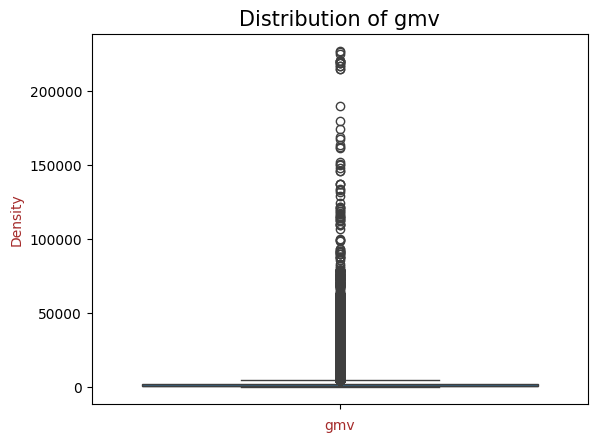

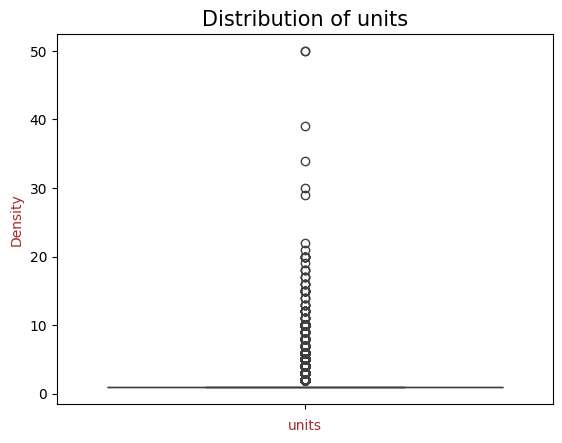

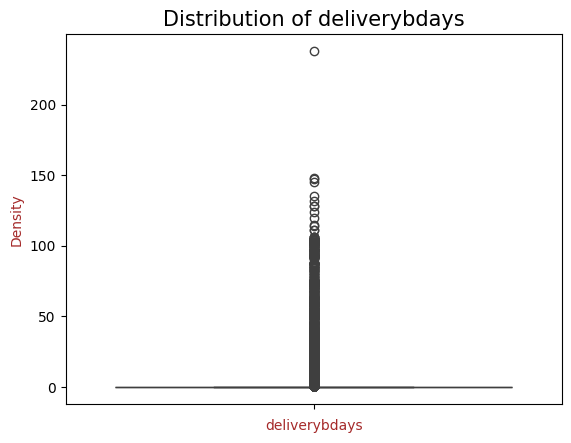

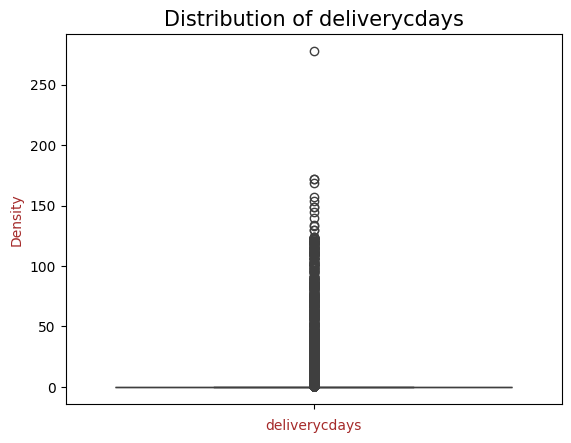

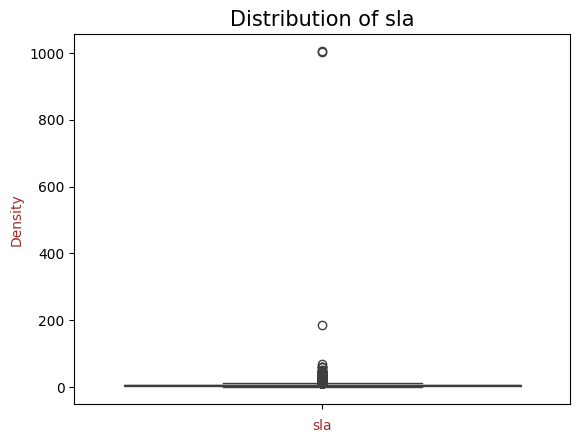

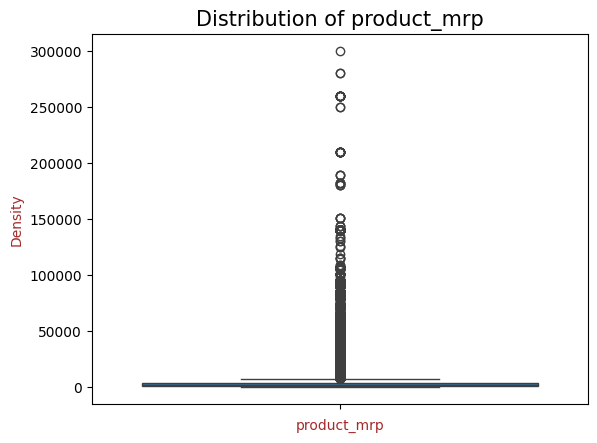

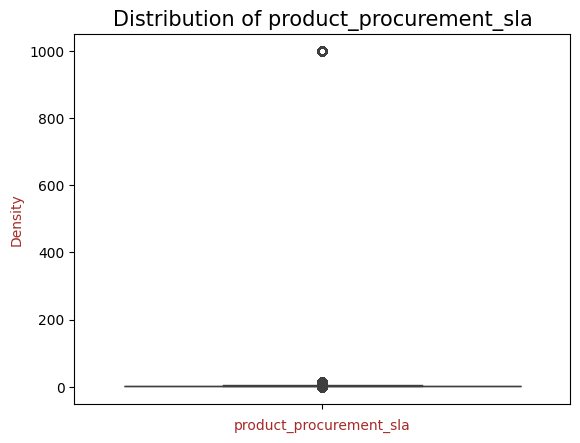

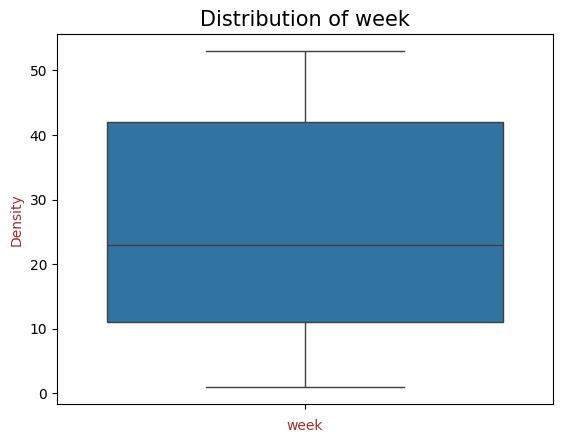

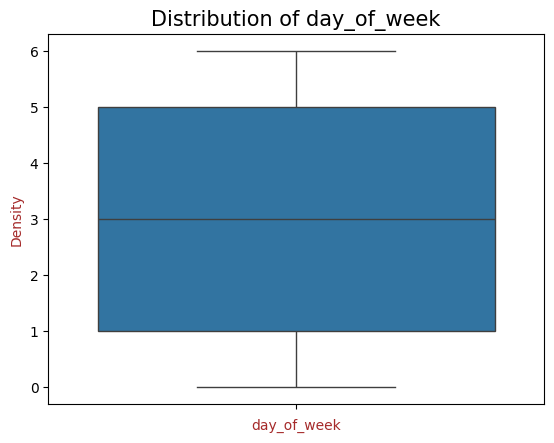

In [ ]:
#Plot a box plot to understand the distribution of these columns

for col in numeric_cols:
  sns.boxplot(consumer_elec_df[col])
  plt.title("Distribution of "+str(col), {"fontsize":15, "fontweight":5, "color":"black"})
  plt.xlabel(col, fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
  plt.ylabel("Density", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
  plt.show()

In [ ]:
#All the columns except discount has outliers. Lets understand the distribution of data further

consumer_elec_df[numeric_cols].describe(percentiles=[.25,.5,.75,.90,.95,.99]).apply(lambda s: s.apply('{0:.5f}'.format))

,gmv,units,deliverybdays,deliverycdays,sla,product_mrp,product_procurement_sla,week,day_of_week
count,1439226.00000,1439226.00000,1439226.00000,1439226.00000,1439226.00000,1439226.00000,1439226.00000,1439226.00000,1439226.00000
mean,2501.91919,1.02128,1.03199,1.20194,5.74860,4271.54866,5.58290,26.08905,2.96475
std,5652.91551,0.25211,2.48135,2.88934,2.99817,8710.14423,53.56984,16.36811,1.92854
min,10.00000,1.00000,0.00000,0.00000,0.00000,49.00000,0.00000,1.00000,0.00000
25%,349.00000,1.00000,0.00000,0.00000,4.00000,895.00000,2.00000,11.00000,1.00000
50%,797.00000,1.00000,0.00000,0.00000,6.00000,1700.00000,2.00000,23.00000,3.00000
75%,1999.00000,1.00000,0.00000,0.00000,7.00000,3499.00000,3.00000,42.00000,5.00000
90%,4399.00000,1.00000,5.00000,5.00000,9.00000,7490.00000,5.00000,49.00000,6.00000
95%,11699.00000,1.00000,6.00000,7.00000,10.00000,18900.00000,5.00000,52.00000,6.00000
99%,30999.00000,2.00000,8.00000,10.00000,13.00000,46500.00000,14.00000,53.00000,6.00000


In [ ]:
#Lets cap the outliers to 1st and 99th percentile to reduce the extent of outliers
for col in numeric_cols:
    percentiles = consumer_elec_df[col].quantile([0.01, 0.99]).values
    consumer_elec_df[col][consumer_elec_df[col] <= percentiles[0]] = percentiles[0]
    consumer_elec_df[col][consumer_elec_df[col] >= percentiles[1]] = percentiles[1]

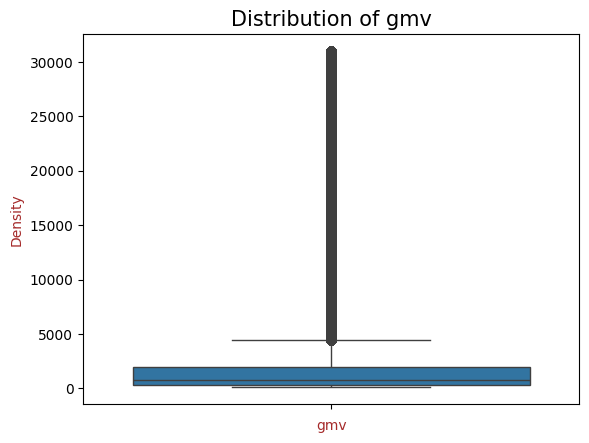

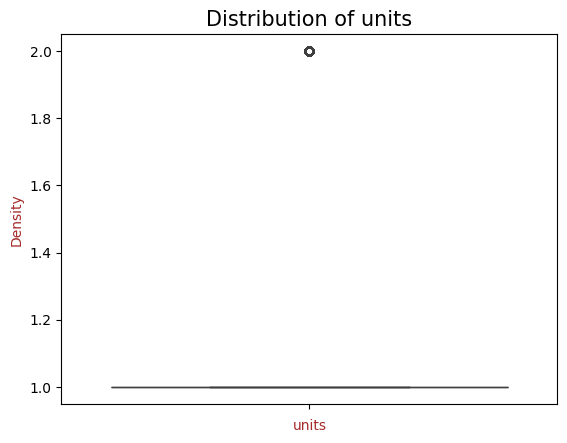

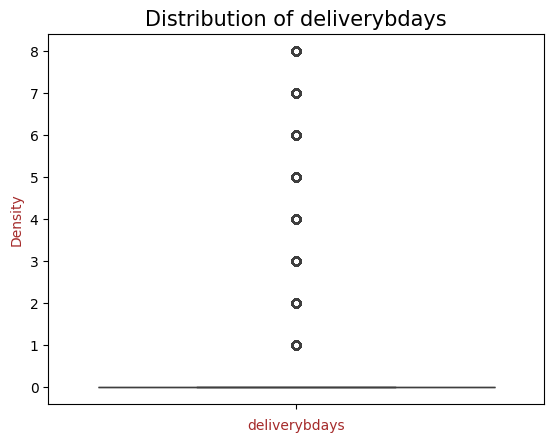

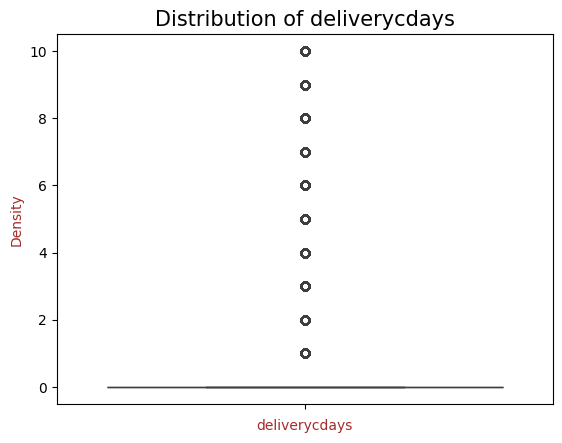

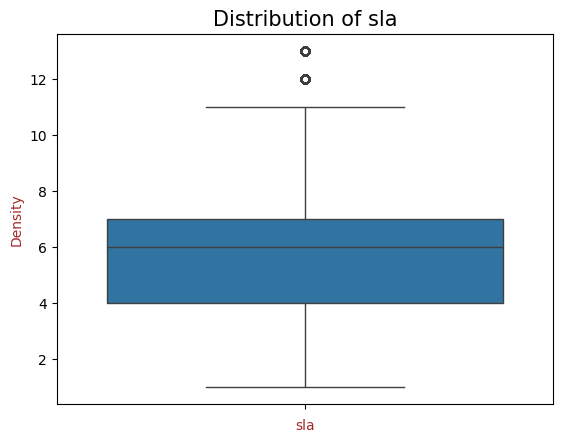

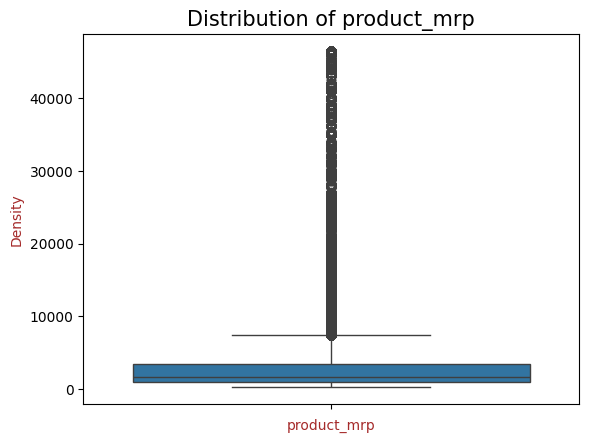

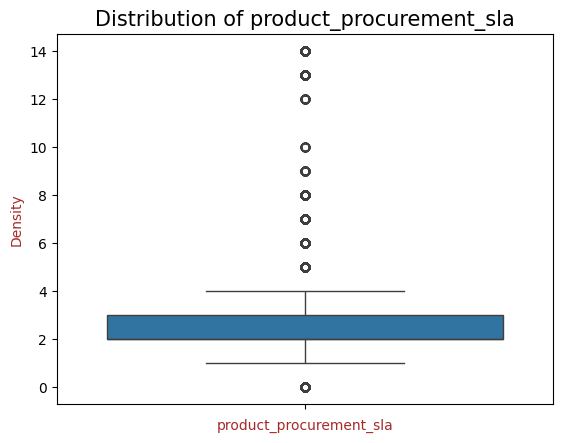

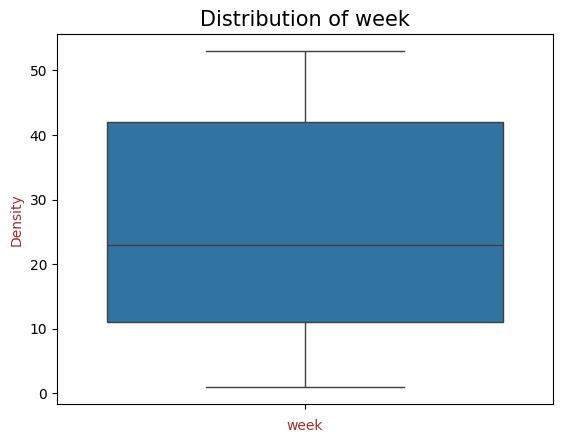

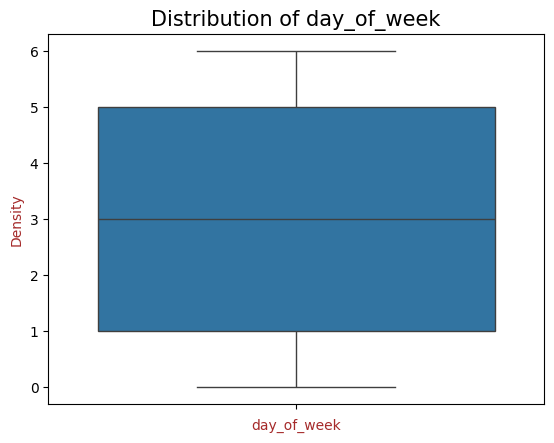

In [ ]:
#Check the boxplot again

for col in numeric_cols:
  sns.boxplot(consumer_elec_df[col])
  plt.title("Distribution of "+str(col), {"fontsize":15, "fontweight":5, "color":"black"})
  plt.xlabel(col, fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
  plt.ylabel("Density", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
  plt.show()

In [ ]:
consumer_elec_df["del_time"] = consumer_elec_df["sla"] - (consumer_elec_df["deliverybdays"] + consumer_elec_df["deliverybdays"] + consumer_elec_df["product_procurement_sla"])

In [ ]:
consumer_elec_df["del_status"] = consumer_elec_df["del_time"].apply(lambda x : "Delayed" if x<0 else ("On Time" if x==0 else "Early"))

In [ ]:
#consumer_elec_df.tail()

In [ ]:
#Create a week function in order to convert monthly data to weekly data to align with the concumer dataset

def WeekFinderFromYear(year):
        """ will return all the week from selected year """

        import datetime

        WEEK = {'MONDAY':0,'TUESDAY':1,'WEDNESDAY':2,'THURSDAY':3,'FRIDAY':4,'SATURDAY':5,'SUNDAY':6}
        MONTH = {'JANUARY':1,'FEBRUARY':2,'MARCH':3,'APRIL':4,'MAY':5,'JUNE':6,'JULY':7,'AUGUST':8,'SEPTEMBER':9,'OCTOBER':10,'NOVEMBER':11,'DECEMBER':12}

        year = int(year)
        month = MONTH['JANUARY']
        day = WEEK['MONDAY']

        dt = datetime.date(year, month, 1)
        dow_lst = []

        while dt.weekday() != day:
            dt = dt + datetime.timedelta(days = 1)

        lst_month = MONTH.values()

        for mont in lst_month:
         while dt.month == mont:
            dow_lst.append(dt)
            dt = dt + datetime.timedelta(days=7)

        month_number_week = {1:[], 2:[], 3:[], 4:[], 5:[], 6:[], 7:[], 8:[], 9:[], 10:[], 11:[], 12:[]}
        month_name_week = {'Jan':[], 'Feb':[], 'Mar':[], 'Apr':[], 'May':[], 'Jun':[], 'Jul':[], 'Aug':[], 'Sep':[], 'Oct':[], 'Nov':[], 'Dec':[]}

        for each in dow_lst:
            month_number_week[each.month].append(each.isocalendar()[1])
            month_name_week[calendar.month_abbr[each.month]].append(each.isocalendar()[1])

        return month_number_week, month_name_week

In [ ]:
dict_number_2015, dict_name_2015 = WeekFinderFromYear(2015)
print(dict_number_2015)
print()
print(dict_name_2015)

print()

dict_number_2016, dict_name_2016 = WeekFinderFromYear(2016)
print(dict_number_2016)
print()
print(dict_name_2016)

{1: [2, 3, 4, 5], 2: [6, 7, 8, 9], 3: [10, 11, 12, 13, 14], 4: [15, 16, 17, 18], 5: [19, 20, 21, 22], 6: [23, 24, 25, 26, 27], 7: [28, 29, 30, 31], 8: [32, 33, 34, 35, 36], 9: [37, 38, 39, 40], 10: [41, 42, 43, 44], 11: [45, 46, 47, 48, 49], 12: [50, 51, 52, 53]}

{'Jan': [2, 3, 4, 5], 'Feb': [6, 7, 8, 9], 'Mar': [10, 11, 12, 13, 14], 'Apr': [15, 16, 17, 18], 'May': [19, 20, 21, 22], 'Jun': [23, 24, 25, 26, 27], 'Jul': [28, 29, 30, 31], 'Aug': [32, 33, 34, 35, 36], 'Sep': [37, 38, 39, 40], 'Oct': [41, 42, 43, 44], 'Nov': [45, 46, 47, 48, 49], 'Dec': [50, 51, 52, 53]}

{1: [1, 2, 3, 4], 2: [5, 6, 7, 8, 9], 3: [10, 11, 12, 13], 4: [14, 15, 16, 17], 5: [18, 19, 20, 21, 22], 6: [23, 24, 25, 26], 7: [27, 28, 29, 30], 8: [31, 32, 33, 34, 35], 9: [36, 37, 38, 39], 10: [40, 41, 42, 43, 44], 11: [45, 46, 47, 48], 12: [49, 50, 51, 52]}

{'Jan': [1, 2, 3, 4], 'Feb': [5, 6, 7, 8, 9], 'Mar': [10, 11, 12, 13], 'Apr': [14, 15, 16, 17], 'May': [18, 19, 20, 21, 22], 'Jun': [23, 24, 25, 26], 'Jul': [27,

In [ ]:
num_weeks_2015 = 0
num_weeks_2016 = 0

for i in dict_number_2015:
    if i >= 7:
        num_weeks_2015 += len(dict_number_2015[i])

for i in dict_number_2016:
    if i <= 6:
        num_weeks_2016 += len(dict_number_2016[i])

total_weeks = num_weeks_2015 + num_weeks_2016
total_weeks

52

In [2]:
#Now that we have cleaned the dataset, lets filter the data containing the required subcategories-Camera Accessory, Home Audio, and Gaming Accessory

In [ ]:
new_df = consumer_elec_df[(consumer_elec_df["product_analytic_sub_category"] == "CameraAccessory") | (consumer_elec_df["product_analytic_sub_category"] == "GamingAccessory") | (consumer_elec_df["product_analytic_sub_category"] == "HomeAudio")]

In [ ]:
#Analyze media investment dataset

In [ ]:
media_inv_df.shape

(16, 12)

In [ ]:
media_inv_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16 entries, 0 to 15
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Year               12 non-null     float64
 1   Month              12 non-null     float64
 2   Total Investment   12 non-null     float64
 3   TV                 13 non-null     float64
 4   Digital            12 non-null     float64
 5   Sponsorship        12 non-null     float64
 6   Content Marketing  12 non-null     float64
 7   Online marketing   12 non-null     float64
 8    Affiliates        12 non-null     float64
 9   SEM                12 non-null     float64
 10  Radio              3 non-null      float64
 11  Other              3 non-null      float64
dtypes: float64(12)
memory usage: 1.6 KB


In [ ]:
#media_inv_df

In [ ]:
#Drop the last 4 rows as these are dummy rows
#Convert year and month datatype to integer

media_inv_df = media_inv_df.iloc[:12]
media_inv_df[["Year", "Month"]] = media_inv_df[["Year", "Month"]].astype("int")

In [ ]:
#Check null values in the dataset

media_inv_df.isnull().sum()

,0
Year,0
Month,0
Total Investment,0
TV,0
Digital,0
Sponsorship,0
Content Marketing,0
Online marketing,0
Affiliates,0
SEM,0


In [ ]:
#Lets impute the null values with zero

media_inv_df[["Radio", "Other"]] = media_inv_df[["Radio", "Other"]].replace(np.nan, 0)

In [ ]:
media_inv_df.isnull().sum()


,0
Year,0
Month,0
Total Investment,0
TV,0
Digital,0
Sponsorship,0
Content Marketing,0
Online marketing,0
Affiliates,0
SEM,0


In [ ]:
#Build a temporary dataframe

temp_media_inv_df = pd.DataFrame(index=range(total_weeks), columns=['Year', 'Month', 'week', 'Total Investment', 'TV', 'Digital', 'Sponsorship', 'Content Marketing', 'Online marketing', 'Affiliates', 'SEM', 'Radio', 'Other'])

In [ ]:
temp_media_inv_df.head(2)

,Year,Month,week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Creating weekly dataset for media investment using the dictionary created for 2015 and 2016

i = 0

for index, row in media_inv_df.iterrows():

    if row.Year == 2015:

        num_weeks = len(dict_number_2015[row.Month])

        for week in dict_number_2015[row.Month]:

            temp_media_inv_df.iloc[i].Year = row.Year
            temp_media_inv_df.iloc[i].Month = row.Month
            temp_media_inv_df.iloc[i]['week'] = week
            temp_media_inv_df.iloc[i]['Total Investment'] = round(row['Total Investment'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['TV'] = round(row['TV'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Digital'] = round(row['Digital'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Sponsorship'] = round(row['Sponsorship'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Content Marketing'] = round(row['Content Marketing'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Online marketing'] = round(row['Online marketing'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Affiliates'] = round(row[' Affiliates'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['SEM'] = round(row['SEM'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Radio'] = round(row['Radio'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Other'] = round(row['Other'] / num_weeks, 3)

            i+=1

    elif row.Year == 2016:

        num_weeks = len(dict_number_2016[row.Month])

        for week in dict_number_2016[row.Month]:

            temp_media_inv_df.iloc[i].Year = row.Year
            temp_media_inv_df.iloc[i].Month = row.Month
            temp_media_inv_df.iloc[i]['week'] = week
            temp_media_inv_df.iloc[i]['Total Investment'] = round(row['Total Investment'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['TV'] = round(row['TV'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Digital'] = round(row['Digital'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Sponsorship'] = round(row['Sponsorship'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Content Marketing'] = round(row['Content Marketing'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Online marketing'] = round(row['Online marketing'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Affiliates'] = round(row[' Affiliates'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['SEM'] = round(row['SEM'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Radio'] = round(row['Radio'] / num_weeks, 3)
            temp_media_inv_df.iloc[i]['Other'] = round(row['Other'] / num_weeks, 3)

            i+=1

temp_media_inv_df.head()

,Year,Month,week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,28,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
1,2015.0,7.0,29,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
2,2015.0,7.0,30,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
3,2015.0,7.0,31,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
4,2015.0,8.0,32,1.013,0.001,0.256,0.213,0.0,0.026,0.015,0.503,0.0,0.0


In [ ]:
# Saving the temp created data in media investment dataset
media_inv_df = temp_media_inv_df

media_inv_df.head()

,Year,Month,week,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,28,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
1,2015.0,7.0,29,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
2,2015.0,7.0,30,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
3,2015.0,7.0,31,4.265,0.054,0.633,1.854,0.0,0.332,0.137,1.256,0.0,0.0
4,2015.0,8.0,32,1.013,0.001,0.256,0.213,0.0,0.026,0.015,0.503,0.0,0.0


In [ ]:
media_inv_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Year               52 non-null     object
 1   Month              52 non-null     object
 2   week               52 non-null     object
 3   Total Investment   52 non-null     object
 4   TV                 52 non-null     object
 5   Digital            52 non-null     object
 6   Sponsorship        52 non-null     object
 7   Content Marketing  52 non-null     object
 8   Online marketing   52 non-null     object
 9   Affiliates         52 non-null     object
 10  SEM                52 non-null     object
 11  Radio              52 non-null     object
 12  Other              52 non-null     object
dtypes: object(13)
memory usage: 5.4+ KB


In [ ]:
#Convert columns to numeric datatype

for col in media_inv_df.columns:
  media_inv_df[col] = media_inv_df[col].astype("float64")

media_inv_df["week"] = media_inv_df["week"].astype("int")
media_inv_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Year               52 non-null     float64
 1   Month              52 non-null     float64
 2   week               52 non-null     int64  
 3   Total Investment   52 non-null     float64
 4   TV                 52 non-null     float64
 5   Digital            52 non-null     float64
 6   Sponsorship        52 non-null     float64
 7   Content Marketing  52 non-null     float64
 8   Online marketing   52 non-null     float64
 9   Affiliates         52 non-null     float64
 10  SEM                52 non-null     float64
 11  Radio              52 non-null     float64
 12  Other              52 non-null     float64
dtypes: float64(12), int64(1)
memory usage: 5.4 KB


In [ ]:
#Clean NPS dataset

Monthly_nps

,Scores,July'15,Aug'15,Sept'15,Oct'15,Nov'15,Dec'15,Jan'16,Feb'16,Mar'16,Apr'16,May'16,June'16
0,NPS,54.599588,59.987101,46.925419,44.398389,47.0,45.8,47.093031,50.327406,49.02055,51.827605,47.306951,50.516687
1,Stock Index,1177.000000,1206.000000,1101.000000,1210.000000,1233.0,1038.0,1052.000000,1222.000000,1015.00000,1242.000000,1228.000000,1194.000000


In [ ]:
#Transpose of monthly nps dataset

Monthly_nps = Monthly_nps.T

In [ ]:
Monthly_nps.reset_index(drop=False, inplace=True)

In [ ]:
#Drop the first row and rename columns

Monthly_nps.drop(Monthly_nps.index[0], inplace=True)

Monthly_nps.columns = ['Month', 'NPS', 'Stock Index']

In [ ]:
Monthly_nps


,Month,NPS,Stock Index
1,July'15,54.599588,1177.0
2,Aug'15,59.987101,1206.0
3,Sept'15,46.925419,1101.0
4,Oct'15,44.398389,1210.0
5,Nov'15,47.0,1233.0
6,Dec'15,45.8,1038.0
7,Jan'16,47.093031,1052.0
8,Feb'16,50.327406,1222.0
9,Mar'16,49.02055,1015.0
10,Apr'16,51.827605,1242.0


In [ ]:
#Create a temporary dataframe to create a weekly dataset for NPS

temp_monthly_nps = pd.DataFrame(index=range(total_weeks), columns=['Year', 'Month', 'week', 'NPS', 'Stock Index'])

temp_monthly_nps.head(1)

,Year,Month,week,NPS,Stock Index
0,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Creating weekly data from NPS using the dictionary for weeks created for 2015 and 2016

i = 0

for index, row in Monthly_nps.iterrows():

    if '15' in row['Month']:

        month = re.split("[']", row['Month'])[0][0:3]

        for week in dict_name_2015[month]:

            temp_monthly_nps.iloc[i].Year = 2015
            temp_monthly_nps.iloc[i].Month = month
            temp_monthly_nps.iloc[i].week = week
            temp_monthly_nps.iloc[i].NPS = row['NPS']
            temp_monthly_nps.iloc[i]['Stock Index'] = row['Stock Index']

            i+=1

    elif '16' in row['Month']:

        month = re.split("[']", row['Month'])[0][0:3]

        for week in dict_name_2016[month]:

            temp_monthly_nps.iloc[i].Year = 2016
            temp_monthly_nps.iloc[i].Month = month
            temp_monthly_nps.iloc[i].week = week
            temp_monthly_nps.iloc[i].NPS = row['NPS']
            temp_monthly_nps.iloc[i]['Stock Index'] = row['Stock Index']

            i+=1

temp_monthly_nps.head()

,Year,Month,week,NPS,Stock Index
0,2015,Jul,28,54.599588,1177.0
1,2015,Jul,29,54.599588,1177.0
2,2015,Jul,30,54.599588,1177.0
3,2015,Jul,31,54.599588,1177.0
4,2015,Aug,32,59.987101,1206.0


In [ ]:
# Storing the temporary data into monthly_nps

Monthly_nps = temp_monthly_nps
Monthly_nps.head()

,Year,Month,week,NPS,Stock Index
0,2015,Jul,28,54.599588,1177.0
1,2015,Jul,29,54.599588,1177.0
2,2015,Jul,30,54.599588,1177.0
3,2015,Jul,31,54.599588,1177.0
4,2015,Aug,32,59.987101,1206.0


In [ ]:
Monthly_nps.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Year         52 non-null     object
 1   Month        52 non-null     object
 2   week         52 non-null     object
 3   NPS          52 non-null     object
 4   Stock Index  52 non-null     object
dtypes: object(5)
memory usage: 2.2+ KB


In [ ]:
# Convert the columns to numeric data type

Monthly_nps.drop(columns=["Year", "Month"], axis=1, inplace=True)

for col in Monthly_nps.columns:
  Monthly_nps[col] = Monthly_nps[col].astype("float64")

Monthly_nps["week"] = Monthly_nps["week"].astype("int")
Monthly_nps.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52 entries, 0 to 51
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   week         52 non-null     int64  
 1   NPS          52 non-null     float64
 2   Stock Index  52 non-null     float64
dtypes: float64(2), int64(1)
memory usage: 1.3 KB


In [ ]:
#Sales Data calendar cleaning

spcl_sale_calendar

,Sale_year,Sales Calendar
0,2015.0,(18-19th July)
1,2015.0,(15-17th Aug)
2,2015.0,(28-30th Aug)
3,2015.0,(15-17th Oct)
4,2015.0,(7-14th Nov)
5,2015.0,(25th Dec'15 - 3rd Jan'16)
6,2016.0,(20-22 Jan)
7,2016.0,(1-2 Feb)
8,2016.0,(20-21 Feb)
9,2016.0,(14-15 Feb)


In [ ]:
# Converting the column year to int

spcl_sale_calendar["Sale_year"] = spcl_sale_calendar["Sale_year"].astype("int")

In [ ]:
# Separating the dataframe for 2015, 2015-2016 and 2016

spcl_sale_calendar_15 = spcl_sale_calendar.iloc[:5]
spcl_sale_calendar_1516 = spcl_sale_calendar.iloc[5]
spcl_sale_calendar_16 = spcl_sale_calendar.iloc[6:]

In [ ]:
# Removing the paranthesis from Sales Calendar column
spcl_sale_calendar_15["Sales Calendar"] = spcl_sale_calendar_15["Sales Calendar"].apply(lambda x: (x.lstrip(" (")).rstrip(")"))

# Storing the start date day
spcl_sale_calendar_15["start_date"] = spcl_sale_calendar_15["Sales Calendar"].apply(lambda x: x.split("-")[0])

# Storing the end date day
spcl_sale_calendar_15["end_date"] = spcl_sale_calendar_15["Sales Calendar"].apply(lambda x: x.split("-")[1][:2])

In [ ]:
spcl_sale_calendar_15

,Sale_year,Sales Calendar,start_date,end_date
0,2015,18-19th July,18,19
1,2015,15-17th Aug,15,17
2,2015,28-30th Aug,28,30
3,2015,15-17th Oct,15,17
4,2015,7-14th Nov,7,14


In [ ]:
# Creating a new column Month
spcl_sale_calendar_15["Month"] = spcl_sale_calendar_15["Sales Calendar"].apply(lambda x: x[-4:].strip())

spcl_sale_calendar_15["Month"] = spcl_sale_calendar_15["Month"].apply(lambda x: list(calendar.month_abbr).index(x[:3]))

In [ ]:
# Creating column start date
spcl_sale_calendar_15["start_date"] = spcl_sale_calendar_15["Sale_year"].astype("str") + "-" + spcl_sale_calendar_15["Month"].astype("str") + "-" + spcl_sale_calendar_15["start_date"].astype("str")

# Creating column end date
spcl_sale_calendar_15["end_date"] = spcl_sale_calendar_15["Sale_year"].astype("str") + "-" + spcl_sale_calendar_15["Month"].astype("str") + "-" + spcl_sale_calendar_15["end_date"].astype("str")

In [ ]:
spcl_sale_calendar_15

,Sale_year,Sales Calendar,start_date,end_date,Month
0,2015,18-19th July,2015-7-18,2015-7-19,7
1,2015,15-17th Aug,2015-8-15,2015-8-17,8
2,2015,28-30th Aug,2015-8-28,2015-8-30,8
3,2015,15-17th Oct,2015-10-15,2015-10-17,10
4,2015,7-14th Nov,2015-11-7,2015-11-14,11


In [ ]:
#Data cleaning for 2016 calendar set

# Removing the paranthesis from Sales Calendar column
spcl_sale_calendar_16["Sales Calendar"] = spcl_sale_calendar_16["Sales Calendar"].apply(lambda x: (x.lstrip(" (")).rstrip(")"))

# Storing the start date day
spcl_sale_calendar_16["start_date"] = spcl_sale_calendar_16["Sales Calendar"].apply(lambda x: x.split("-")[0])

# Storing the end date day
spcl_sale_calendar_16["end_date"] = spcl_sale_calendar_16["Sales Calendar"].apply(lambda x: x.split("-")[1][:2])

In [ ]:
# Creating a new column Month
spcl_sale_calendar_16["Month"] = spcl_sale_calendar_16["Sales Calendar"].apply(lambda x: x[-4:].strip())

spcl_sale_calendar_16["Month"] = spcl_sale_calendar_16["Month"].apply(lambda x: list(calendar.month_abbr).index(x[:3]))

In [ ]:
# Creating column start date
spcl_sale_calendar_16["start_date"] = spcl_sale_calendar_16["Sale_year"].astype("str") + "-" + spcl_sale_calendar_16["Month"].astype("str") + "-" + spcl_sale_calendar_16["start_date"].astype("str")

# Creating column end date
spcl_sale_calendar_16["end_date"] = spcl_sale_calendar_16["Sale_year"].astype("str") + "-" + spcl_sale_calendar_16["Month"].astype("str") + "-" + spcl_sale_calendar_16["end_date"].astype("str")

In [ ]:
# Inserting 2015-2016 row data
spcl_sale_calendar = pd.concat([spcl_sale_calendar_15, spcl_sale_calendar_16], axis = 0)

In [ ]:
# Concatenating the datasets
spcl_sale_calendar = pd.DataFrame(np.insert(spcl_sale_calendar.values, 5, values=[2015, "(25th Dec'15 - 3rd Jan'16)", "2015-12-15", "2016-1-3", 12], axis=0))

In [ ]:
spcl_sale_calendar.columns = ["Sale_year", "Sales Calendar", "start_date", "end_date", "Month"]

In [ ]:
spcl_sale_calendar

,Sale_year,Sales Calendar,start_date,end_date,Month
0,2015,18-19th July,2015-7-18,2015-7-19,7
1,2015,15-17th Aug,2015-8-15,2015-8-17,8
2,2015,28-30th Aug,2015-8-28,2015-8-30,8
3,2015,15-17th Oct,2015-10-15,2015-10-17,10
4,2015,7-14th Nov,2015-11-7,2015-11-14,11
5,2015,(25th Dec'15 - 3rd Jan'16),2015-12-15,2016-1-3,12
6,2016,20-22 Jan,2016-1-20,2016-1-22,1
7,2016,1-2 Feb,2016-2-1,2016-2-2,2
8,2016,20-21 Feb,2016-2-20,2016-2-21,2
9,2016,14-15 Feb,2016-2-14,2016-2-15,2


In [ ]:
spcl_sale_calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Sale_year       12 non-null     object
 1   Sales Calendar  12 non-null     object
 2   start_date      12 non-null     object
 3   end_date        12 non-null     object
 4   Month           12 non-null     object
dtypes: object(5)
memory usage: 612.0+ bytes


In [ ]:
#Convert this dataset to appropriate datatypes

spcl_sale_calendar["start_date"] = pd.to_datetime(spcl_sale_calendar["start_date"])

spcl_sale_calendar["end_date"] = pd.to_datetime(spcl_sale_calendar["end_date"],format='mixed')

In [ ]:
#Create a column for starting week

spcl_sale_calendar["start_week"] = spcl_sale_calendar["start_date"].dt.isocalendar().week

In [ ]:
#Calculate the total number of sales days in each row

spcl_sale_calendar["no_of_days"] = (spcl_sale_calendar["end_date"] - spcl_sale_calendar["start_date"])

spcl_sale_calendar["no_of_days"] = spcl_sale_calendar["no_of_days"].dt.days + 1

In [ ]:
#We need only the week and sale days, hence retaining only these two columns

spcl_sale_calendar = spcl_sale_calendar[["start_week", "no_of_days"]]
spcl_sale_calendar.rename(columns={"start_week":"week", "no_of_days":"sale_days"}, inplace=True)

spcl_sale_calendar

,week,sale_days
0,29,2
1,33,3
2,35,3
3,42,3
4,45,8
5,51,20
6,3,3
7,5,2
8,7,2
9,6,2


In [ ]:
spcl_sale_calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   week       12 non-null     UInt32
 1   sale_days  12 non-null     int64 
dtypes: UInt32(1), int64(1)
memory usage: 288.0 bytes


In [ ]:
#We need to clean climate data for 2015 and 2016

ontario_2015.head()

,Date/Time,Year,Month,Day,Data Quality,Max Temp (°C),Max Temp Flag,Min Temp (°C),Min Temp Flag,Mean Temp (°C),Mean Temp Flag,Heat Deg Days (°C),Heat Deg Days Flag,Cool Deg Days (°C),Cool Deg Days Flag,Total Rain (mm),Total Rain Flag,Total Snow (cm),Total Snow Flag,Total Precip (mm),Total Precip Flag,Snow on Grnd (cm),Snow on Grnd Flag,Dir of Max Gust (10s deg),Dir of Max Gust Flag,Spd of Max Gust (km/h),Spd of Max Gust Flag
0,2015-01-01,2015,1,1,†,0.0,NaN,-8.5,NaN,-4.3,NaN,22.3,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
1,2015-01-02,2015,1,2,†,3.0,NaN,-3.0,NaN,0.0,NaN,18.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
2,2015-01-03,2015,1,3,†,2.5,NaN,-4.0,NaN,-0.8,NaN,18.8,NaN,0.0,NaN,24.0,NaN,0.0,NaN,24.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
3,2015-01-04,2015,1,4,†,2.5,NaN,0.0,NaN,1.3,NaN,16.7,NaN,0.0,NaN,0.0,NaN,1.0,NaN,1.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN
4,2015-01-05,2015,1,5,†,-10.0,NaN,-13.5,NaN,-11.8,NaN,29.8,NaN,0.0,NaN,0.0,NaN,3.0,NaN,3.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN


In [ ]:
ontario_2015.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 27 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date/Time                  365 non-null    datetime64[ns]
 1   Year                       365 non-null    int64         
 2   Month                      365 non-null    int64         
 3   Day                        365 non-null    int64         
 4   Data Quality               229 non-null    object        
 5   Max Temp (°C)              216 non-null    float64       
 6   Max Temp Flag              13 non-null     object        
 7   Min Temp (°C)              190 non-null    float64       
 8   Min Temp Flag              39 non-null     object        
 9   Mean Temp (°C)             190 non-null    float64       
 10  Mean Temp Flag             39 non-null     object        
 11  Heat Deg Days (°C)         190 non-null    float64       
 12  Heat Deg

In [ ]:
#Check if these columns have single values

single_val_cols = []

for col in ontario_2015.columns:
  if ontario_2015[col].nunique() ==1:
    print(ontario_2015[col].value_counts())
    print("---------------------------------------------")
    single_val_cols.append(col)



Year
2015    365
Name: count, dtype: int64
---------------------------------------------
Data Quality
†    229
Name: count, dtype: int64
---------------------------------------------
Max Temp Flag
M    13
Name: count, dtype: int64
---------------------------------------------
Min Temp Flag
M    39
Name: count, dtype: int64
---------------------------------------------
Mean Temp Flag
M    39
Name: count, dtype: int64
---------------------------------------------
Heat Deg Days Flag
M    39
Name: count, dtype: int64
---------------------------------------------
Cool Deg Days Flag
M    39
Name: count, dtype: int64
---------------------------------------------
Total Rain Flag
T    7
Name: count, dtype: int64
---------------------------------------------
Total Snow Flag
T    9
Name: count, dtype: int64
---------------------------------------------
Total Precip Flag
T    12
Name: count, dtype: int64
---------------------------------------------
Snow on Grnd Flag
T    2
Name: count, dtype: int

In [ ]:
single_val_cols.remove("Year")

In [ ]:
#Drop the columns having single value as this would not be helpful for the analysis

ontario_2015.drop(columns=single_val_cols, inplace=True)

In [ ]:
ontario_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date/Time                  365 non-null    datetime64[ns]
 1   Year                       365 non-null    int64         
 2   Month                      365 non-null    int64         
 3   Day                        365 non-null    int64         
 4   Max Temp (°C)              216 non-null    float64       
 5   Min Temp (°C)              190 non-null    float64       
 6   Mean Temp (°C)             190 non-null    float64       
 7   Heat Deg Days (°C)         190 non-null    float64       
 8   Cool Deg Days (°C)         190 non-null    float64       
 9   Total Rain (mm)            229 non-null    float64       
 10  Total Snow (cm)            229 non-null    float64       
 11  Total Precip (mm)          229 non-null    float64       
 12  Snow on 

In [ ]:
#Drop the last 4 columns as it contains 100% null values

ontario_2015.drop(columns=["Dir of Max Gust (10s deg)", "Dir of Max Gust Flag", "Spd of Max Gust (km/h)", "Spd of Max Gust Flag"], inplace=True)

In [ ]:
ontario_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 365 entries, 0 to 364
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date/Time           365 non-null    datetime64[ns]
 1   Year                365 non-null    int64         
 2   Month               365 non-null    int64         
 3   Day                 365 non-null    int64         
 4   Max Temp (°C)       216 non-null    float64       
 5   Min Temp (°C)       190 non-null    float64       
 6   Mean Temp (°C)      190 non-null    float64       
 7   Heat Deg Days (°C)  190 non-null    float64       
 8   Cool Deg Days (°C)  190 non-null    float64       
 9   Total Rain (mm)     229 non-null    float64       
 10  Total Snow (cm)     229 non-null    float64       
 11  Total Precip (mm)   229 non-null    float64       
 12  Snow on Grnd (cm)   229 non-null    float64       
dtypes: datetime64[ns](1), float64(9), int64(3)
memory 

In [ ]:
ontario_2015.shape

(365, 13)

In [ ]:
#Drop rows where all columns have null values

ontario_2015 = ontario_2015.dropna(how="all")

In [ ]:
#Create a new column to extract the week number

ontario_2015["week"] = ontario_2015["Date/Time"].dt.isocalendar().week

In [ ]:
#Filter the data for all months from July-December 2015

ontario_2015 = ontario_2015[ontario_2015["Month"] >= 7]
ontario_2015.reset_index(drop=True, inplace=True)

ontario_2015.head()

,Date/Time,Year,Month,Day,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),week
0,2015-07-01,2015,7,1,24.5,17.0,20.8,0.0,2.8,0.0,0.0,0.0,0.0,27
1,2015-07-02,2015,7,2,24.0,14.0,19.0,0.0,1.0,0.0,0.0,0.0,0.0,27
2,2015-07-03,2015,7,3,25.0,10.0,17.5,0.5,0.0,0.0,0.0,0.0,0.0,27
3,2015-07-04,2015,7,4,26.0,11.0,18.5,0.0,0.5,0.0,0.0,0.0,0.0,27
4,2015-07-05,2015,7,5,28.0,14.0,21.0,0.0,3.0,0.0,0.0,0.0,0.0,27


In [ ]:
print("Min Month : ", ontario_2015["Month"].min())
print("Max Month : ", ontario_2015["Month"].max())

Min Month :  7
Max Month :  12


In [ ]:
# Sorting the values by week

ontario_2015.sort_values(by=['week'], ascending = True, inplace = True)

In [ ]:
#Aggregate the weekly data

ontario_2015 = ontario_2015.groupby(['week']).agg({'Max Temp (°C)':"max", 'Min Temp (°C)':"min", 'Mean Temp (°C)':"mean", 'Heat Deg Days (°C)':"mean", 'Cool Deg Days (°C)':"mean", 'Total Rain (mm)':"mean", 'Total Snow (cm)':"mean", 'Total Precip (mm)':"mean", 'Snow on Grnd (cm)':"mean"}).reset_index(drop=False)

In [ ]:
#We do not need week 27 as it belongs to June

ontario_2015.drop(ontario_2015[ontario_2015['week'] == 27].index, inplace = True)

In [ ]:
#ontario_2015.head()

In [ ]:
#Check null values

round(ontario_2015.isnull().sum()/ ontario_2015.shape[0] * 100, 2)

,0
week,0.0
Max Temp (°C),0.0
Min Temp (°C),0.0
Mean Temp (°C),0.0
Heat Deg Days (°C),0.0
Cool Deg Days (°C),0.0
Total Rain (mm),0.0
Total Snow (cm),0.0
Total Precip (mm),0.0
Snow on Grnd (cm),0.0


##### It can be observed that there are no more null values in this dataset

In [ ]:
#2016 climate data cleaning

In [ ]:
#ontario_2016.head()

In [ ]:
ontario_2016.shape

(366, 27)

In [ ]:
ontario_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 366 entries, 0 to 365
Data columns (total 27 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date/Time                  366 non-null    datetime64[ns]
 1   Year                       366 non-null    int64         
 2   Month                      366 non-null    int64         
 3   Day                        366 non-null    int64         
 4   Data Quality               227 non-null    object        
 5   Max Temp (°C)              226 non-null    float64       
 6   Max Temp Flag              1 non-null      object        
 7   Min Temp (°C)              219 non-null    float64       
 8   Min Temp Flag              8 non-null      object        
 9   Mean Temp (°C)             219 non-null    float64       
 10  Mean Temp Flag             8 non-null      object        
 11  Heat Deg Days (°C)         219 non-null    float64       
 12  Heat Deg

In [ ]:
single_val_cols = []

for col in ontario_2016.columns:
  if ontario_2016[col].nunique() ==1:
    print(ontario_2016[col].value_counts())
    print("---------------------------------------------")
    single_val_cols.append(col)

single_val_cols.remove("Year")

Year
2016    366
Name: count, dtype: int64
---------------------------------------------
Data Quality
†    227
Name: count, dtype: int64
---------------------------------------------
Max Temp Flag
M    1
Name: count, dtype: int64
---------------------------------------------
Min Temp Flag
M    8
Name: count, dtype: int64
---------------------------------------------
Mean Temp Flag
M    8
Name: count, dtype: int64
---------------------------------------------
Heat Deg Days Flag
M    8
Name: count, dtype: int64
---------------------------------------------
Cool Deg Days Flag
M    8
Name: count, dtype: int64
---------------------------------------------
Total Rain Flag
T    3
Name: count, dtype: int64
---------------------------------------------
Total Snow Flag
T    7
Name: count, dtype: int64
---------------------------------------------
Total Precip Flag
T    7
Name: count, dtype: int64
---------------------------------------------
Snow on Grnd Flag
T    6
Name: count, dtype: int64
---

In [ ]:
ontario_2016.drop(columns=single_val_cols, inplace=True)

In [ ]:
#Check null value percentage

round(ontario_2016.isnull().sum()/ ontario_2016.shape[0] * 100, 2)

,0
Date/Time,0.00
Year,0.00
Month,0.00
Day,0.00
Max Temp (°C),38.25
Min Temp (°C),40.16
Mean Temp (°C),40.16
Heat Deg Days (°C),40.16
Cool Deg Days (°C),40.16
Total Rain (mm),37.98


In [ ]:
#Drop columns having all null values
#Drop rows having all null values

ontario_2016.drop(columns=["Dir of Max Gust (10s deg)", "Dir of Max Gust Flag", "Spd of Max Gust (km/h)", "Spd of Max Gust Flag"], inplace=True)

ontario_2016 = ontario_2016.dropna(how="all")

In [ ]:
ontario_2016.shape


(366, 13)

In [ ]:
round(ontario_2016.isnull().sum()/ ontario_2016.shape[0] * 100, 2)

,0
Date/Time,0.00
Year,0.00
Month,0.00
Day,0.00
Max Temp (°C),38.25
Min Temp (°C),40.16
Mean Temp (°C),40.16
Heat Deg Days (°C),40.16
Cool Deg Days (°C),40.16
Total Rain (mm),37.98


In [ ]:
ontario_2016.dropna(inplace=True)

In [ ]:
round(ontario_2016.isnull().sum()/ ontario_2016.shape[0] * 100, 2)


,0
Date/Time,0.0
Year,0.0
Month,0.0
Day,0.0
Max Temp (°C),0.0
Min Temp (°C),0.0
Mean Temp (°C),0.0
Heat Deg Days (°C),0.0
Cool Deg Days (°C),0.0
Total Rain (mm),0.0


In [ ]:
ontario_2016.shape


(219, 13)

In [ ]:
#Create a new column to record the week

ontario_2016["week"] = ontario_2016["Date/Time"].dt.isocalendar().week

In [ ]:
#Filter data for months from January 2016 - June 2016

ontario_2016 = ontario_2016[ontario_2016["Month"] <= 6]
ontario_2016.reset_index(drop=True, inplace=True)

ontario_2016.head()

,Date/Time,Year,Month,Day,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),week
0,2016-01-08,2016,1,8,7.0,-14.0,-3.5,21.5,0.0,9.0,0.0,9.0,0.0,1
1,2016-01-09,2016,1,9,11.0,3.0,7.0,11.0,0.0,14.6,0.0,14.6,0.0,1
2,2016-01-10,2016,1,10,-1.5,-5.0,-3.3,21.3,0.0,0.0,7.0,7.0,0.0,1
3,2016-01-12,2016,1,12,-5.0,-12.0,-8.5,26.5,0.0,0.0,0.0,0.0,12.0,2
4,2016-01-14,2016,1,14,2.5,-10.5,-4.0,22.0,0.0,0.0,0.0,0.0,11.0,2


In [ ]:
print("Min Month : ", ontario_2016["Month"].min())
print("Max Month : ", ontario_2016["Month"].max())

Min Month :  1
Max Month :  6


In [ ]:
ontario_2016.sort_values(by=['week'], ascending = True, inplace = True)

In [ ]:
#Create weekly aggregates

ontario_2016 = ontario_2016.groupby(['week']).agg({'Max Temp (°C)':"max", 'Min Temp (°C)':"min", 'Mean Temp (°C)':"mean", 'Heat Deg Days (°C)':"mean", 'Cool Deg Days (°C)':"mean", 'Total Rain (mm)':"mean", 'Total Snow (cm)':"mean", 'Total Precip (mm)':"mean", 'Snow on Grnd (cm)':"mean"}).reset_index(drop=False)

ontario_2016.head()

,week,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
0,1,11.0,-14.0,0.066667,17.933333,0.0,7.866667,2.333333,10.200000,0.000000
1,2,4.5,-12.0,-3.733333,21.733333,0.0,2.533333,0.000000,2.533333,10.333333
2,4,5.5,-9.0,-1.800000,19.800000,0.0,0.000000,0.000000,0.000000,0.000000
3,5,13.0,-5.5,3.200000,14.800000,0.0,3.400000,0.000000,3.400000,0.000000
4,6,5.0,-18.0,-7.266667,25.266667,0.0,0.000000,2.666667,2.666667,2.000000


In [ ]:
ontario_2016.shape

(25, 10)

In [ ]:
#Concatenate 2015 and 2016 datasets

climate_2015_2016 = pd.concat([ontario_2015, ontario_2016], axis =0)

In [ ]:
climate_2015_2016.head()

,week,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm)
1,28,28.0,12.5,20.100000,0.283333,2.383333,4.416667,0.0,4.416667,0.0
2,29,33.0,11.0,23.183333,0.000000,5.183333,1.400000,0.0,1.400000,0.0
3,30,31.5,14.5,23.060000,0.000000,5.060000,0.900000,0.0,0.900000,0.0
4,31,33.5,16.0,24.566667,0.000000,6.566667,4.633333,0.0,4.633333,0.0
5,32,28.5,15.0,21.650000,0.000000,3.650000,0.280000,0.0,0.280000,0.0


In [ ]:
climate_2015_2016.shape

(51, 10)

In [ ]:
#Data Preparation for analysis

#Drop these columns as these are not relevant for analysis

consumer_elec_df.drop(columns=["fsn_id", "order_id", "order_item_id", "cust_id"], inplace=True)


In [ ]:
# Create a binary variable from order_payment_type and drop this column

consumer_elec_df["ord_payment_type"].value_counts()


,count
ord_payment_type,
COD,1036252
Prepaid,402974


In [ ]:
consumer_elec_df["cod"] = consumer_elec_df["ord_payment_type"].apply(lambda x: 1 if x == "COD" else 0)

In [ ]:
consumer_elec_df.drop(columns="ord_payment_type", axis=1, inplace=True)

In [ ]:
#Execute dummy encoding on certain categorical variables

prod_vertical_df = pd.get_dummies(consumer_elec_df[['product_analytic_vertical']], prefix='product_vertical', drop_first=True)
prod_vertical_df.head()

,product_vertical_AudioMP3Player,product_vertical_Binoculars,product_vertical_BoomBox,product_vertical_Camcorders,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_CodeInTheBoxGame,product_vertical_CoolingPad,product_vertical_DJController,product_vertical_DSLR,product_vertical_Dock,product_vertical_DockingStation,product_vertical_ExtensionTube,product_vertical_FMRadio,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GameValueCards,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingConsole,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_HandheldGamingConsole,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_Instant Cameras,product_vertical_JoystickGamingWheel,product_vertical_KaraokePlayer,product_vertical_LaptopSpeaker,product_vertical_Lens,product_vertical_Microphone,product_vertical_MicrophoneAccessory,product_vertical_MobileSpeaker,product_vertical_MotionController,product_vertical_PhysicalGame,product_vertical_Point & Shoot,product_vertical_ReflectorUmbrella,product_vertical_RemoteControl,product_vertical_SelectorBox,product_vertical_SlingBox,product_vertical_Softbox,product_vertical_SoundMixer,product_vertical_SportsAndAction,product_vertical_Strap,product_vertical_TVOutCableAccessory,product_vertical_Teleconverter,product_vertical_Telescope,product_vertical_VideoGlasses,product_vertical_VideoPlayer,product_vertical_VoiceRecorder,product_vertical_\N
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,Fa

In [ ]:
del_status_df = pd.get_dummies(consumer_elec_df[['del_status']], prefix='del_status', drop_first=True)

In [ ]:
del_status_df.head()


,del_status_Early,del_status_On Time
0,True,False
1,True,False
2,True,False
3,True,False
4,True,False


In [ ]:
#Concatenate the dummy variables with dataset

consumer_elec_df = pd.concat([consumer_elec_df, prod_vertical_df, del_status_df], axis=1)

In [ ]:
consumer_elec_df.drop(columns = ["product_analytic_vertical", "del_status"], axis=1, inplace=True)

In [ ]:
consumer_elec_df["product_analytic_sub_category"].value_counts()

,count
product_analytic_sub_category,
Speaker,461168
CameraAccessory,212100
GamingAccessory,182353
TVVideoSmall,131970
HomeAudio,106134
AudioMP3Player,102731
Game,95572
Camera,87163
GamingConsole,26336


In [ ]:
#Create new dataframes for cameraaccessory, gamingaccessory and homeaudio

camera_accessory = consumer_elec_df.loc[consumer_elec_df['product_analytic_sub_category']=='CameraAccessory']
gaming_accessory = consumer_elec_df.loc[consumer_elec_df['product_analytic_sub_category']=='GamingAccessory']
home_audio = consumer_elec_df.loc[consumer_elec_df['product_analytic_sub_category']=='HomeAudio']


In [ ]:
cat_cols = ["product_analytic_category",	"product_analytic_sub_category"]

for col in cat_cols:
  print("camera_accessory")
  print(camera_accessory[col].value_counts())
  print("-----------------------------------")

for col in cat_cols:
  print("gaming_accessory")
  print(gaming_accessory[col].value_counts())
  print("-----------------------------------")

for col in cat_cols:
  print("home_audio")
  print(home_audio[col].value_counts())
  print("-----------------------------------")

camera_accessory
product_analytic_category
CameraAccessory    212100
Name: count, dtype: int64
-----------------------------------
camera_accessory
product_analytic_sub_category
CameraAccessory    212100
Name: count, dtype: int64
-----------------------------------
gaming_accessory
product_analytic_category
GamingHardware    182353
Name: count, dtype: int64
-----------------------------------
gaming_accessory
product_analytic_sub_category
GamingAccessory    182353
Name: count, dtype: int64
-----------------------------------
home_audio
product_analytic_category
EntertainmentSmall    106134
Name: count, dtype: int64
-----------------------------------
home_audio
product_analytic_sub_category
HomeAudio    106134
Name: count, dtype: int64
-----------------------------------


In [ ]:
#Drop columns that are insignificant

drop_columns = ["product_analytic_category", "product_analytic_sub_category"]

camera_accessory.drop(drop_columns, axis=1, inplace=True)
gaming_accessory.drop(drop_columns, axis=1, inplace=True)
home_audio.drop(drop_columns, axis=1, inplace=True)

In [ ]:
#Create weekly data for all the 3 datasets

camera_accessory_df = camera_accessory.groupby(['week']).agg({'gmv':"sum",'units':"sum",'sale_price':"mean",'discount':'mean','product_mrp':"mean",\
                                          'deliverybdays': "mean",'deliverycdays':'mean','sla':'mean', 'product_procurement_sla':'mean', \
                                          'pay_date':'sum','holiday':'sum','premium_product':'sum', 'del_time':'sum', \
                                          'cod':"sum",
                                          'product_vertical_CameraAccessory':'sum', 'product_vertical_CameraBag':'sum','product_vertical_CameraBattery':'sum',\
                                          'product_vertical_CameraBatteryCharger':'sum','product_vertical_CameraBatteryGrip':'sum', \
                                          'product_vertical_CameraEyeCup':'sum','product_vertical_CameraFilmRolls':'sum','product_vertical_CameraHousing':'sum', \
                                          'product_vertical_CameraMicrophone':'sum','product_vertical_CameraMount':'sum','product_vertical_CameraRemoteControl':'sum', \
                                          'product_vertical_CameraStorageMemoryCard':'sum', 'product_vertical_CameraTripod':'sum','product_vertical_DSLR':'sum', \
                                          'product_vertical_ExtensionTube':'sum','product_vertical_Filter':'sum','product_vertical_Flash':'sum','product_vertical_FlashShoeAdapter':'sum', \
                                          'product_vertical_Instant Cameras':'sum','product_vertical_Lens':'sum','product_vertical_ReflectorUmbrella':'sum',\
                                          'product_vertical_Softbox':'sum','product_vertical_Strap':'sum','product_vertical_Teleconverter':'sum','product_vertical_Teleconverter':'sum',\
                                          'product_vertical_Telescope':'sum','del_status_Early':'sum','del_status_On Time':'sum'}).reset_index(drop=False)
camera_accessory_df.shape

(51, 42)

In [ ]:
gaming_accessory_df = gaming_accessory.groupby(['week']).agg({'gmv':"sum",'units':"sum",'sale_price':"mean",'discount':'mean','product_mrp':"mean",\
                                          'deliverybdays': "mean",'deliverycdays':'mean','sla':'mean', 'product_procurement_sla':'mean', \
                                          'pay_date':'sum','holiday':'sum','premium_product':'sum', 'del_time':'sum', \
                                          'cod':"sum",
                                          'product_vertical_GameControlMount':'sum','product_vertical_GamePad':'sum','product_vertical_GameValueCards':'sum','product_vertical_GamingAccessoryKit':'sum', \
                                          'product_vertical_GamingAdapter':'sum','product_vertical_GamingChargingStation':'sum','product_vertical_GamingConsole':'sum','product_vertical_GamingHeadset':'sum',\
                                          'product_vertical_GamingKeyboard':'sum','product_vertical_GamingMemoryCard':'sum','product_vertical_GamingMouse':'sum','product_vertical_GamingMousePad':'sum',\
                                          'product_vertical_GamingSpeaker':'sum','product_vertical_HandheldGamingConsole':'sum','product_vertical_JoystickGamingWheel':'sum','product_vertical_PhysicalGame':'sum',\
                                          'del_status_Early':'sum','del_status_On Time':'sum'}).reset_index(drop=False)
gaming_accessory_df.shape

(52, 33)

In [ ]:
home_audio_df = home_audio.groupby(['week']).agg({'gmv':"sum",'units':"sum",'sale_price':"mean",'discount':'mean','product_mrp':"mean",\
                                          'deliverybdays': "mean",'deliverycdays':'mean','sla':'mean', 'product_procurement_sla':'mean', \
                                          'pay_date':'sum','holiday':'sum','premium_product':'sum', 'del_time':'sum', \
                                          'cod':"sum",\
                                          'product_vertical_AudioMP3Player':'sum','product_vertical_BoomBox':'sum','product_vertical_Dock':'sum',\
                                          'product_vertical_DockingStation':'sum','product_vertical_FMRadio':'sum','product_vertical_HiFiSystem':'sum',\
                                          'product_vertical_HomeAudioSpeaker':'sum','product_vertical_HomeTheatre':'sum','product_vertical_KaraokePlayer':'sum',\
                                          'product_vertical_SlingBox':'sum','product_vertical_SoundMixer':'sum','product_vertical_VoiceRecorder':'sum',\
                                          'del_status_Early':'sum','del_status_On Time':'sum'}).reset_index(drop=False)
home_audio_df.shape

(49, 29)

In [ ]:
#Create columns to identify payday week and holiday weeks

camera_accessory_df['pay_date_week'] = camera_accessory_df['pay_date'].apply(lambda x:1 if x > 0 else 0)
gaming_accessory_df['pay_date_week'] = gaming_accessory_df['pay_date'].apply(lambda x:1 if x > 0 else 0)
home_audio_df['pay_date_week'] = home_audio_df['pay_date'].apply(lambda x:1 if x > 0 else 0)

camera_accessory_df['holiday_week'] = camera_accessory_df['holiday'].apply(lambda x:1 if x > 0 else 0)
gaming_accessory_df['holiday_week'] = gaming_accessory_df['holiday'].apply(lambda x:1 if x > 0 else 0)
home_audio_df['holiday_week'] = home_audio_df['holiday'].apply(lambda x:1 if x > 0 else 0)

In [ ]:
#We can now drop the columns for pay date and holiday

drop_columns = ['pay_date','holiday']

camera_accessory_df.drop(drop_columns, axis=1, inplace=True)
gaming_accessory_df.drop(drop_columns, axis=1, inplace=True)
home_audio_df.drop(drop_columns, axis=1, inplace=True)

In [ ]:
#Lets understand the size of these dataframes

print('Shape of camera accessory: {}'.format(camera_accessory_df.shape))
print('Shape of gaming accessory: {}'.format(gaming_accessory_df.shape))
print('Shape of home audio: {}'.format(home_audio_df.shape))

Shape of camera accessory: (51, 42)
Shape of gaming accessory: (52, 33)
Shape of home audio: (49, 29)


In [ ]:
#Merge these 3 dataframes with media investment dataset on column 'week'

camera_accessory_df = pd.merge(camera_accessory_df, media_inv_df, how='left', on='week')
gaming_accessory_df = pd.merge(gaming_accessory_df, media_inv_df, how='left', on='week')
home_audio_df = pd.merge(home_audio_df, media_inv_df, how='left', on='week')

In [ ]:
#Merge these 3 dataframes with nps column dataset on column 'week'

camera_accessory_df = pd.merge(camera_accessory_df, Monthly_nps, how='left', on='week')
gaming_accessory_df = pd.merge(gaming_accessory_df, Monthly_nps, how='left', on='week')
home_audio_df = pd.merge(home_audio_df, Monthly_nps, how='left', on='week')

In [ ]:
#Merge these 3 dataframes with climate dataset on column 'week'

camera_accessory_df = pd.merge(camera_accessory_df, climate_2015_2016, how='left', on='week')
gaming_accessory_df = pd.merge(gaming_accessory_df, climate_2015_2016, how='left', on='week')
home_audio_df = pd.merge(home_audio_df, climate_2015_2016, how='left', on='week')

In [ ]:
print('Any null values in camera accessory: {}'.format(camera_accessory_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(home_audio_df.isnull().values.any()))

Any null values in camera accessory: True
Any null values in gaming accessory: True
Any null values in home audio: True


In [ ]:
camera_accessory_df.isnull().sum()

,0
week,0
gmv,0
units,0
sale_price,0
discount,0
product_mrp,0
deliverybdays,0
deliverycdays,0
sla,0
product_procurement_sla,0


In [ ]:
#Lets delete these rows having null values

camera_accessory_df.dropna(how="any", inplace=True)
gaming_accessory_df.dropna(how="any", inplace=True)
home_audio_df.dropna(how="any", inplace=True)

In [ ]:
#Merge these 3 dataframes with spc_sale_calendar dataset on column 'week'

camera_accessory_df = pd.merge(camera_accessory_df, spcl_sale_calendar, how='left', on='week')
gaming_accessory_df = pd.merge(gaming_accessory_df, spcl_sale_calendar, how='left', on='week')
home_audio_df = pd.merge(home_audio_df, spcl_sale_calendar, how='left', on='week')

In [ ]:
print('Any null values in camera accessory: {}'.format(camera_accessory_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(home_audio_df.isnull().values.any()))

Any null values in camera accessory: True
Any null values in gaming accessory: True
Any null values in home audio: True


In [ ]:
gaming_accessory_df.isnull().sum()

,0
week,0
gmv,0
units,0
sale_price,0
discount,0
product_mrp,0
deliverybdays,0
deliverycdays,0
sla,0
product_procurement_sla,0


In [ ]:
#Impute sale days rows with zero as there are 40 rows

camera_accessory_df["sale_days"].fillna(value=0, inplace=True)
gaming_accessory_df["sale_days"].fillna(value=0, inplace=True)
home_audio_df["sale_days"].fillna(value=0, inplace=True)

In [ ]:
#Check if there are any null values

print('Any null values in camera accessory: {}'.format(camera_accessory_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gaming_accessory_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(home_audio_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


In [ ]:
#Convert the week column to numeric and sort the data in chronological order (July 2015-June 2016)

camera_accessory_df['week'] = pd.to_numeric(camera_accessory_df['week'])
gaming_accessory_df['week'] = pd.to_numeric(gaming_accessory_df['week'])
home_audio_df['week'] = pd.to_numeric(home_audio_df['week'])

camera_accessory_2015 = camera_accessory_df[camera_accessory_df["week"] >= 28]
camera_accessory_2016 = camera_accessory_df[camera_accessory_df["week"] < 28]
camera_accessory_df = pd.concat([camera_accessory_2015,camera_accessory_2016])

gaming_accessory_2015 = gaming_accessory_df[gaming_accessory_df["week"] >= 28]
gaming_accessory_2016 = gaming_accessory_df[gaming_accessory_df["week"] < 28]
gaming_accessory_df = pd.concat([gaming_accessory_2015,gaming_accessory_2016])

home_audio_2015 = home_audio_df[home_audio_df["week"] >= 28]
home_audio_2016 = home_audio_df[home_audio_df["week"] < 28]
home_audio_df = pd.concat([home_audio_2015,home_audio_2016])

## Exploratory data analysis


In [ ]:
#Check the no:of values in each category in the new cleaned dataset

new_df["product_analytic_sub_category"].value_counts()

,count
product_analytic_sub_category,
CameraAccessory,212100
GamingAccessory,182353
HomeAudio,106134


In [ ]:
new_df.columns

Index(['fsn_id', 'Year', 'Month', 'order_id', 'order_item_id', 'gmv', 'units',
       'deliverybdays', 'deliverycdays', 'ord_payment_type', 'sla', 'cust_id',
       'pincode', 'product_analytic_category', 'product_analytic_sub_category',
       'product_analytic_vertical', 'product_mrp', 'product_procurement_sla',
       'ord_date', 'ord_time', 'week', 'day_of_week', 'day', 'pay_date',
       'holiday', 'premium_product', 'sale_price', 'discount', 'del_time',
       'del_status'],
      dtype='object')

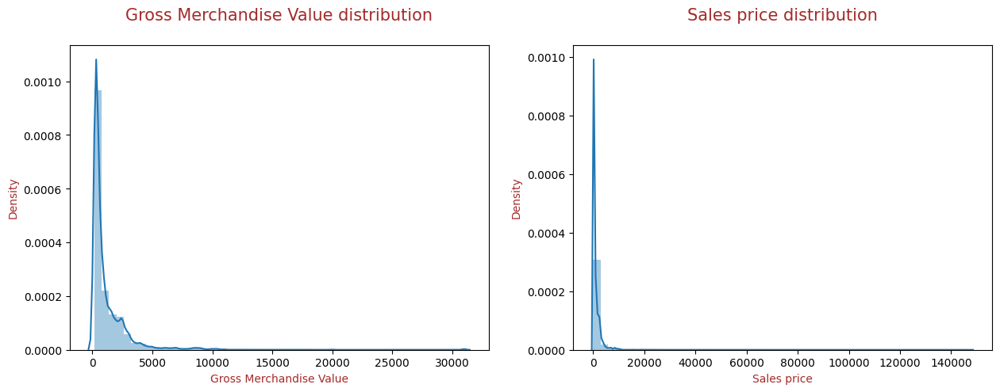

In [ ]:
# Plot histogram of gmv and sales_price

plt.figure(figsize=[15,5])

plt.subplot(1,2,1)
sns.distplot(new_df.gmv)
plt.title("Gross Merchandise Value distribution\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.xlabel("Gross Merchandise Value", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Density", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.subplot(1,2,2)
sns.distplot(new_df.sale_price)
plt.title("Sales price distribution\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.xlabel("Sales price", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Density", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.show()

#### Both these variables seem to be skewed between 0 to 5000

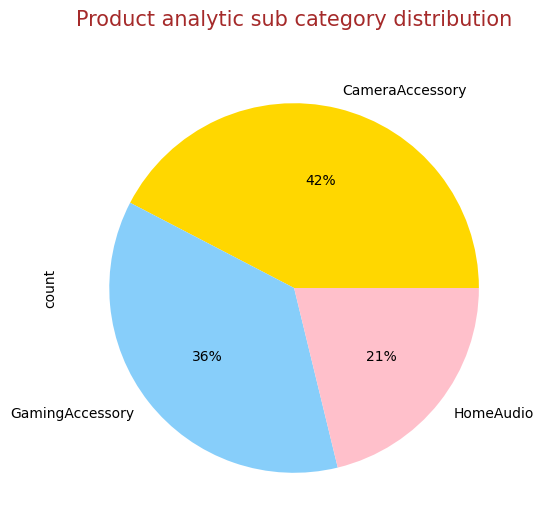

In [ ]:
#Plot pie chart of product categories

plt.figure(figsize=[10,6])

new_df.product_analytic_sub_category.value_counts().plot.pie(autopct = "%1.0f%%", colors=['gold','lightskyblue','pink'])
plt.title("Product analytic sub category distribution\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.show()



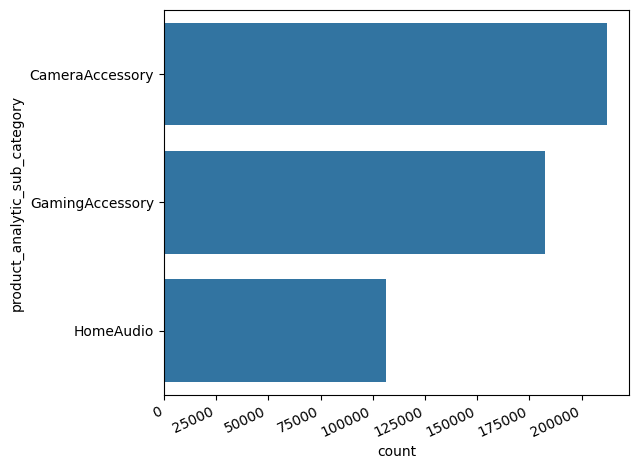

In [ ]:
plt.figure(figsize = (6,5))
ax = sns.countplot(new_df['product_analytic_sub_category'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=25, ha="right")
sns.set_context(font_scale = 3)

##### It can be seen here that Camery accessories are ordered the most, followed by gaming accessories and home audio

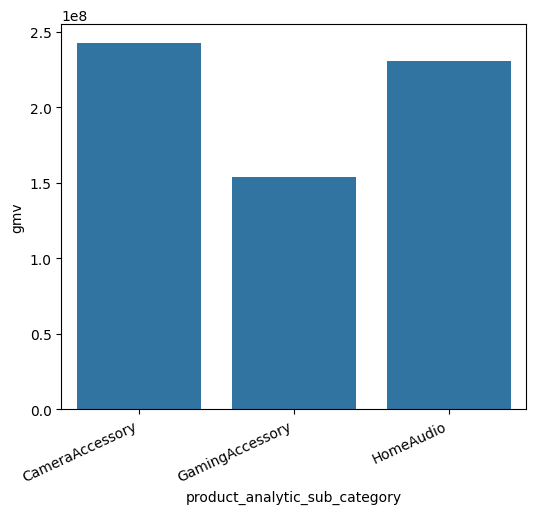

In [ ]:
# Plot to visualize the revenue across each category
total_revenue= new_df.groupby('product_analytic_sub_category')['gmv'].sum().reset_index()
plt.figure(figsize = (6,5))
ax = sns.barplot(x='product_analytic_sub_category', y='gmv', data=total_revenue)
ax.set_xticklabels(ax.get_xticklabels(), rotation=25, ha="right")
sns.set_context(font_scale = 2.5)

##### Revenue earned from gakming accessories are lesser than home audio segment although the latter receives lesser orders

In [ ]:
#Monthly analysis of gmv data

gmv_df = new_df.groupby(by=["Year", "Month"], sort=["Year","Month"] , as_index=False).agg({"gmv":"sum"})
gmv_df["Month"] = gmv_df["Month"].apply(lambda x: calendar.month_name[x])
gmv_df["Date"] = gmv_df["Month"].astype("str") + " " +gmv_df["Year"].astype("str")
#gmv_df

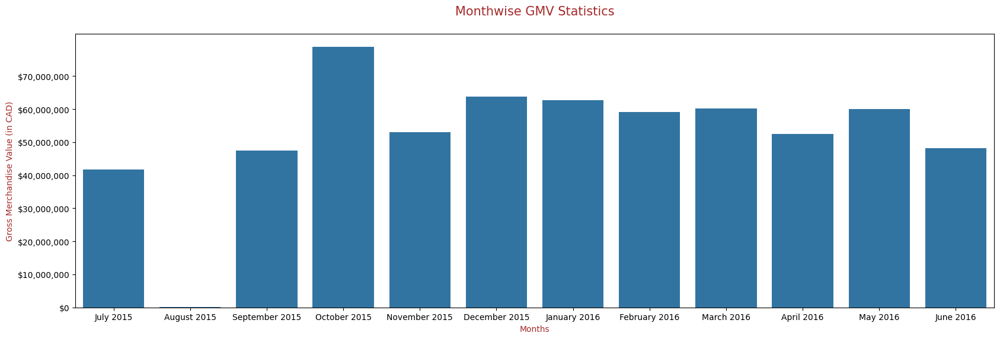

In [ ]:
# Plotting barplot for months vs gmv
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=[20,6])

sns.barplot(x=gmv_df["Date"],y= gmv_df["gmv"])
plt.title("Monthwise GMV Statistics\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Gross Merchandise Value (in CAD)", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Months", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

ytick_values = np.arange(0,80000000,10000000)
ytick_label = ["${:,}".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.show()

##### October and December recorded the highest gmv as these months contain a lot of festivals and holidays
##### Least gmv is observed in August

In [ ]:
# Monthly analysis of product quantity

unit_df = new_df.groupby(by=["Year", "Month"], sort=["Year","Month"] , as_index=False).agg({"units":"sum"})
unit_df["Month"] = unit_df["Month"].apply(lambda x: calendar.month_name[x])
unit_df["Date"] = unit_df["Month"].astype("str") + " " +unit_df["Year"].astype("str")
# unit_df

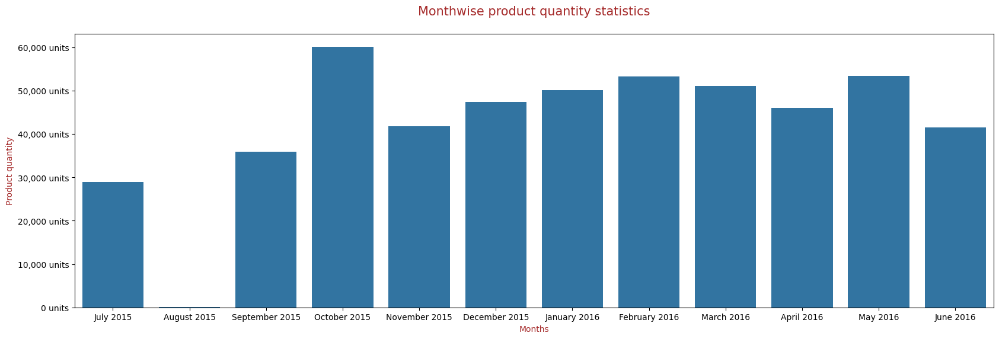

In [ ]:
# Plotting barplot for months vs product quantity

plt.figure(figsize=[20,6])

sns.barplot(x=unit_df["Date"], y=unit_df["units"])
plt.title("Monthwise product quantity statistics\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Product quantity", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Months", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

ytick_values = np.arange(0,70000,10000)
ytick_label = ["{:,} units".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.show()

##### Maximum sales is recorded in October, followed by May
##### No sales in August

In [ ]:
## Month-wise analysis of discount

discount_df = new_df.groupby(by=["Year", "Month"], sort=["Year","Month"] , as_index=False).agg({"discount":"mean"})
discount_df["Month"] = discount_df["Month"].apply(lambda x: calendar.month_name[x])
discount_df["Date"] = discount_df["Month"].astype("str") + " " +discount_df["Year"].astype("str")
discount_df

,Year,Month,discount,Date
0,2015,July,40.618072,July 2015
1,2015,August,40.814231,August 2015
2,2015,September,43.480101,September 2015
3,2015,October,46.549027,October 2015
4,2015,November,44.054823,November 2015
5,2015,December,46.338727,December 2015
6,2016,January,45.947723,January 2016
7,2016,February,47.828908,February 2016
8,2016,March,46.100692,March 2016
9,2016,April,48.027916,April 2016


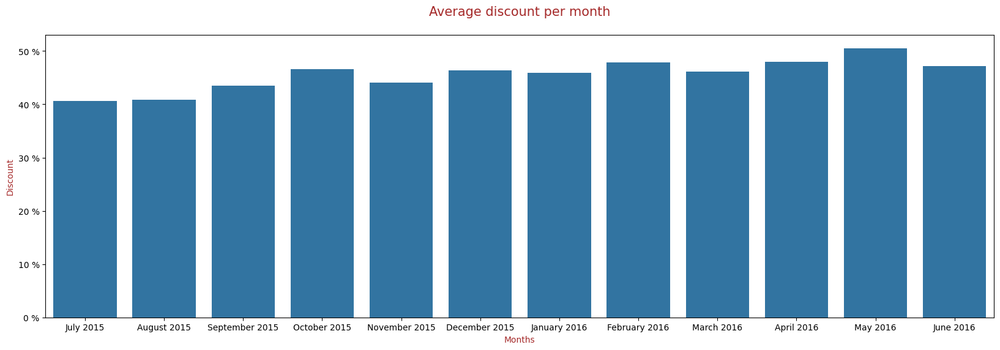

In [ ]:
# Plotting barplot for months vs product quantity

plt.figure(figsize=[20,6])

sns.barplot(x=discount_df["Date"], y=discount_df["discount"])
plt.title("Average discount per month\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Discount", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Months", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

ytick_values = np.arange(0,60,10)
ytick_label = ["{:,} %".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.show()

##### Discounts offered is in the range of 40-60% and maximum is observed in May

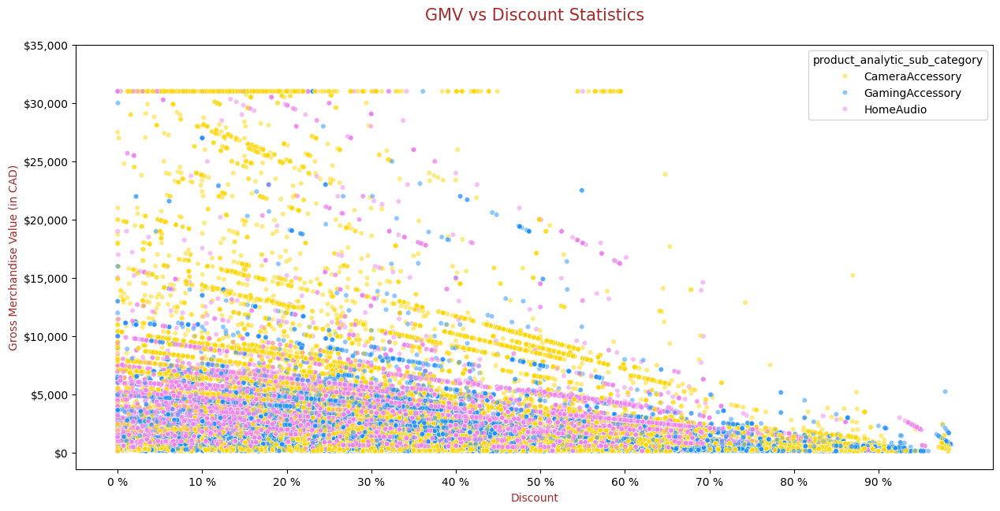

In [ ]:
#Discount vs GMV

plt.figure(figsize=[15,7])

sns.scatterplot(x=new_df["discount"], y=new_df["gmv"], color="pink", hue=new_df["product_analytic_sub_category"], alpha=0.5, s=20, palette=['gold','dodgerblue','violet'])
plt.title("GMV vs Discount Statistics\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Gross Merchandise Value (in CAD)", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Discount", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

ytick_values = np.arange(0,40000,5000)
ytick_label = ["${:,}".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

xtick_values = np.arange(0,100,10)
xtick_label = ["{:,} %".format(j) for j in xtick_values]
plt.xticks(xtick_values, xtick_label)

plt.show()

##### Revenue tends to be high for discount percentage renging from 0 to 60%
##### Post 60% discount, revenue starts declining

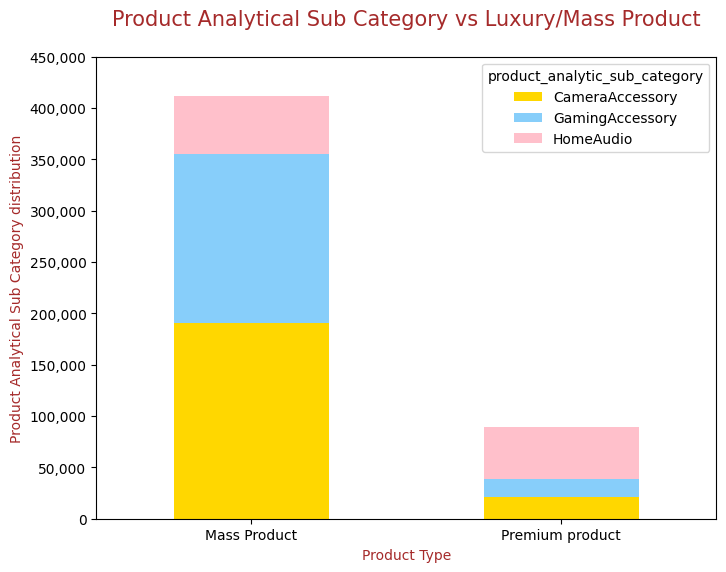

In [ ]:
new_df.groupby(["premium_product", "product_analytic_sub_category"]).size().unstack().plot(kind='bar', stacked=True, figsize=(8,6), fontsize = 10, color=['gold','lightskyblue','pink'])

plt.title("Product Analytical Sub Category vs Luxury/Mass Product\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Product Analytical Sub Category distribution", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Product Type", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

ytick_values = np.arange(0,500000,50000)
ytick_label = ["{:,}".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.xticks([0,1], ["Mass Product", "Premium product"], rotation=0)

plt.show()

##### Orders for mass products are much higher than that of premium products.
##### Among mass products, camery accesories were sold the most, whereas among premium products, homeaudio products were sold the most

In [ ]:
# Creating monthwise number of orders

cprod_demand_df = new_df.groupby(by=["Year", "Month", "product_analytic_sub_category"], sort=["Year","Month"] , as_index=False).agg({"order_id":"count"})
cprod_demand_df["Month"] = cprod_demand_df["Month"].apply(lambda x: calendar.month_name[x])
cprod_demand_df["Date"] = cprod_demand_df["Month"].astype("str") + " " +cprod_demand_df["Year"].astype("str")
#cprod_demand_df

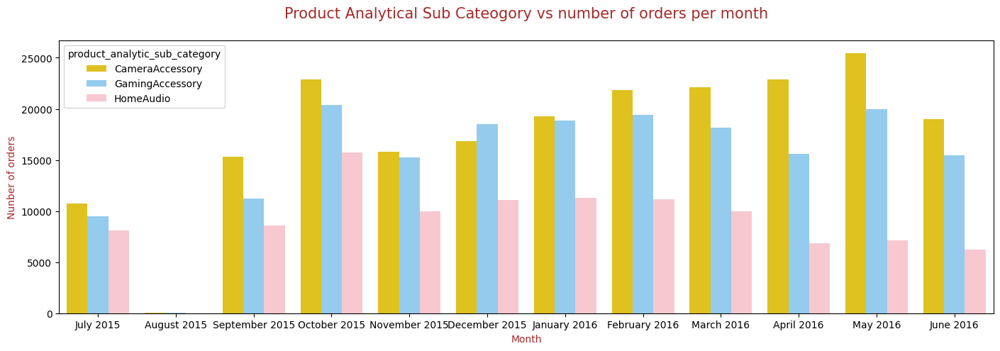

In [ ]:
# Plotting monthwise number of orders

plt.figure(figsize=(17, 5))
sns.barplot(x=cprod_demand_df["Date"], y=cprod_demand_df["order_id"], hue=cprod_demand_df["product_analytic_sub_category"], palette=['gold','lightskyblue','pink'])
plt.title("Product Analytical Sub Cateogory vs number of orders per month\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Nunber of orders", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Month", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.show()

##### Maximum orders for cameryand gaming accessories are placed in October and May
##### Home audio products are least ordered in April, May and June

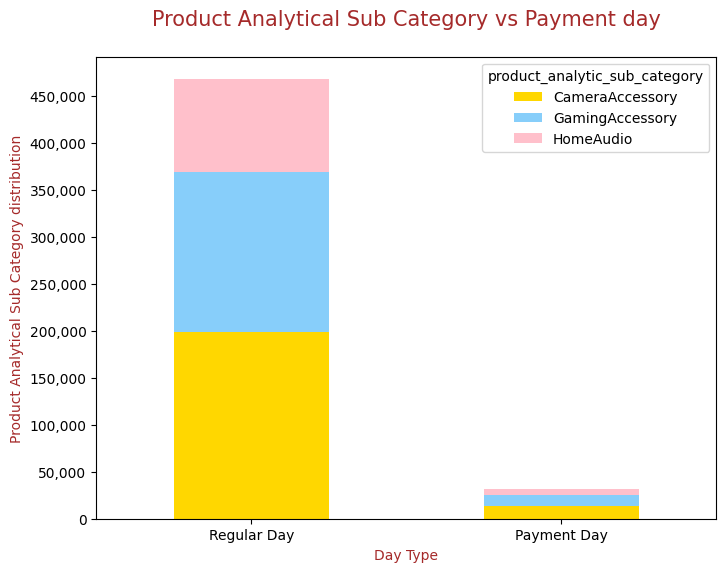

In [ ]:
#Plot GMV for paydays

new_df.groupby(["pay_date", "product_analytic_sub_category"]).size().unstack().plot(kind='bar', stacked=True, figsize=(8,6), fontsize = 10, color=['gold','lightskyblue','pink'])

plt.title("Product Analytical Sub Category vs Payment day\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Product Analytical Sub Category distribution", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Day Type", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

ytick_values = np.arange(0,500000,50000)
ytick_label = ["{:,}".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.xticks([0,1], ["Regular Day", "Payment Day"], rotation=0)

plt.show()

##### Orders for all the categories are much higher on regular days than on payment days

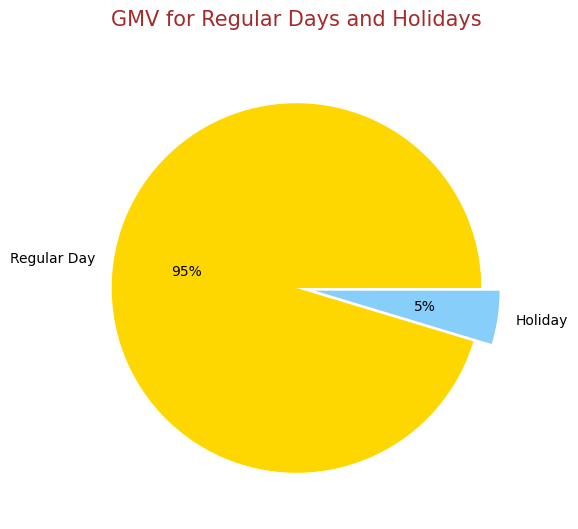

In [ ]:
#Plot GMV for regular days and holidays

holiday_df = new_df.groupby(["holiday"]).agg({"gmv":"sum"})

plt.figure(figsize=[10,6])

plt.pie(holiday_df["gmv"], autopct = "%1.0f%%", explode = (0.0,0.1), colors = ["gold", "lightskyblue"], labels = ["Regular Day", "Holiday"])
plt.title("GMV for Regular Days and Holidays\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.show()



##### 95% of the orders are placed during normal days

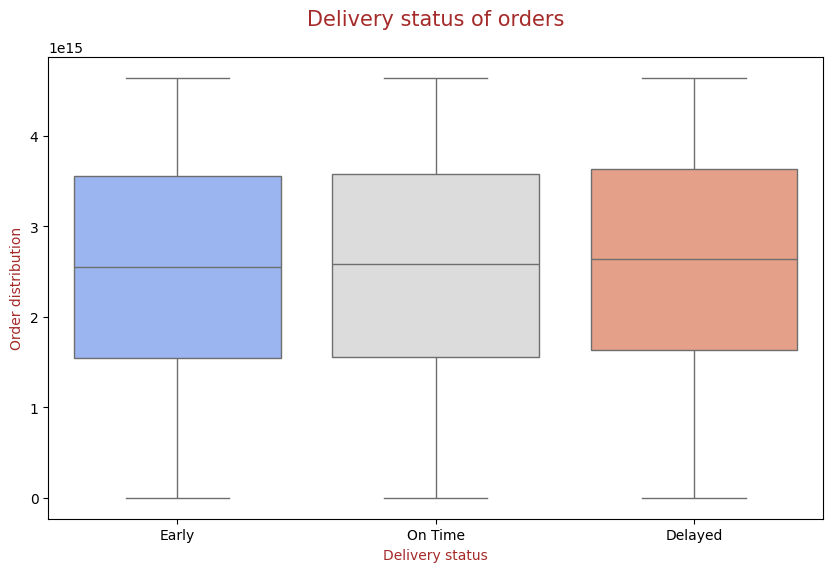

In [ ]:
# Plotting Delivery status vs orders

plt.figure(figsize=[10,6])
sns.boxplot(x=new_df["del_status"], y=new_df["order_id"], palette='coolwarm')
plt.title("Delivery status of orders\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Order distribution", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Delivery status", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.show()

##### Average number of orders of delayed orders are marginally higher than the other two categories

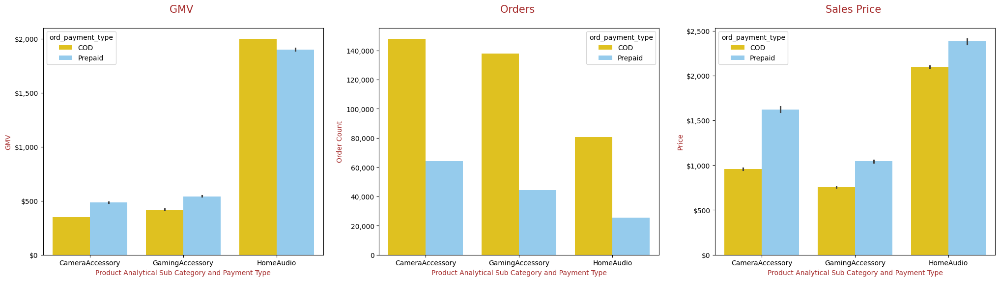

In [ ]:
plt.figure(figsize=[25,6])

plt.subplot(1,3,1)
sns.barplot(x = new_df["product_analytic_sub_category"], y =new_df["gmv"], hue =new_df["ord_payment_type"], palette = ["gold", "lightskyblue"], estimator=np.median)
plt.title("GMV \n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("GMV", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Product Analytical Sub Category and Payment Type", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

ytick_values = np.arange(0,2500,500)
ytick_label = ["${:,}".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.subplot(1,3,2)
sns.countplot(x=new_df["product_analytic_sub_category"], hue = new_df["ord_payment_type"], palette = ["gold", "lightskyblue"])
plt.title("Orders \n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Order Count", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Product Analytical Sub Category and Payment Type", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
ytick_values = np.arange(0,160000,20000)
ytick_label = ["{:,}".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.subplot(1,3,3)
sns.barplot(x=new_df["product_analytic_sub_category"], y=new_df["sale_price"], hue = new_df["ord_payment_type"], palette = ["gold", "lightskyblue"])
plt.title("Sales Price \n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Price", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Product Analytical Sub Category and Payment Type", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

ytick_values = np.arange(0,3000,500)
ytick_label = ["${:,}".format(j) for j in ytick_values]
plt.yticks(ytick_values, ytick_label)

plt.show()


##### Highest revenue is generated from homeaudio products
##### Highest number of orders are placed for camera accessories. Products are ordered more on COD than prepaid
##### Sales price for HomeAudio products are higher than the other 2 categories. Sales generated from prepaid orders are more than COD


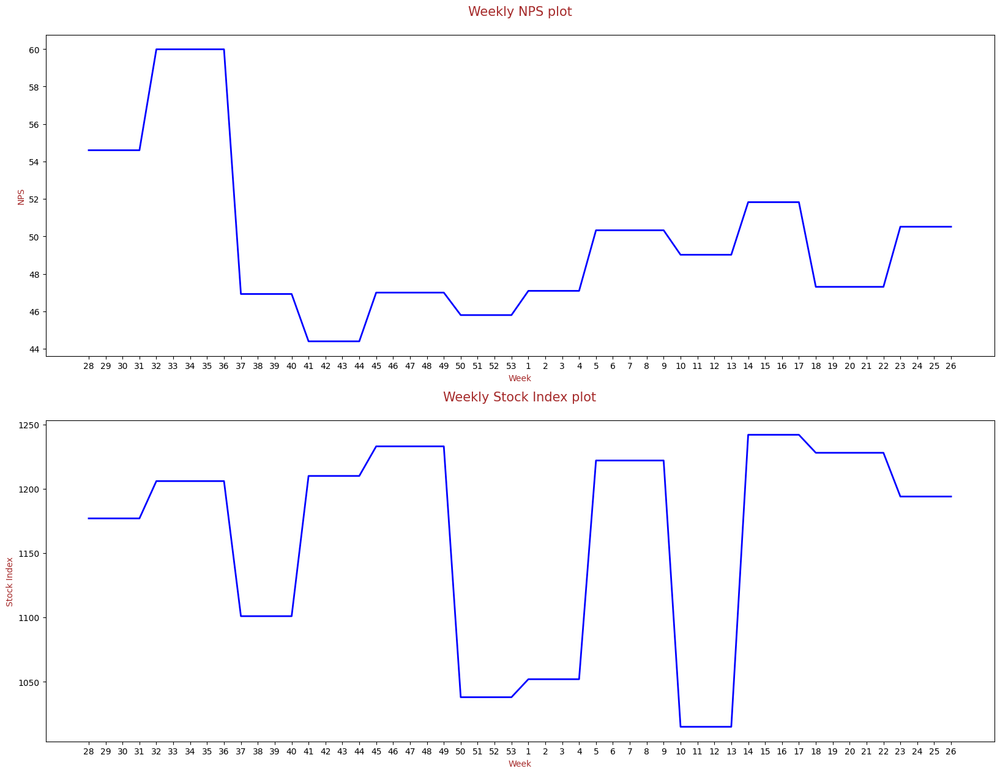

In [ ]:
# Plotting NPS and Stock index
nps_plot = Monthly_nps.copy()
nps_plot["week"] = nps_plot["week"].astype("str")

plt.figure(figsize=(20, 15))

plt.subplot(2,1,1)
plt.plot(nps_plot.iloc[:,0], nps_plot.iloc[:,1], 'b-', linewidth=2)
plt.title("Weekly NPS plot\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("NPS", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Week", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.subplot(2,1,2)
plt.plot(nps_plot["week"], nps_plot["Stock Index"], 'b-', linewidth=2)
plt.title("Weekly Stock Index plot\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Stock Index", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Week", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.show()

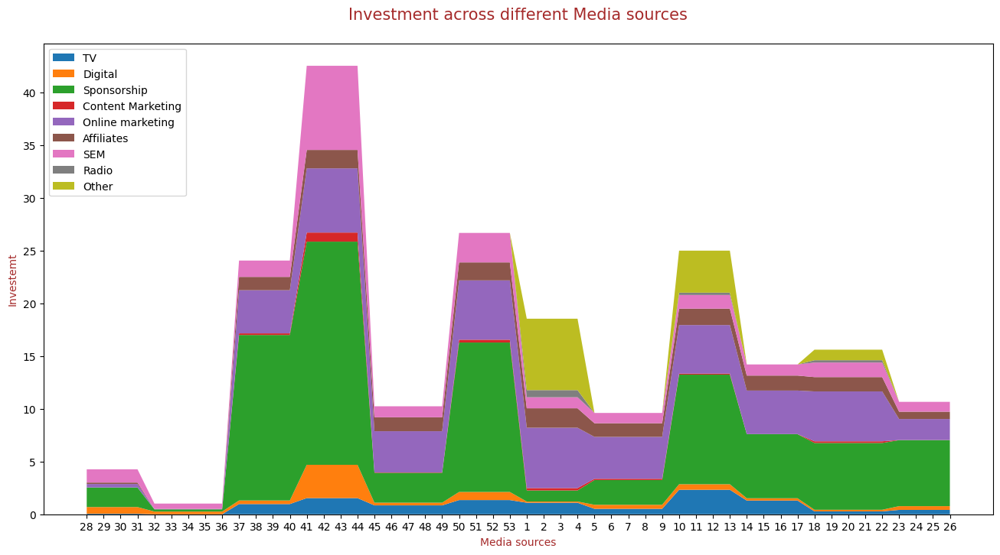

In [ ]:
# Investment across different Media sources

media_plot = media_inv_df.copy()
media_plot["week"] = media_plot["week"].astype("str")

plt.figure(figsize=(16, 8))

#Basic stacked area chart
plt.stackplot(media_plot["week"], media_plot["TV"], media_plot["Digital"], media_plot["Sponsorship"], media_plot["Content Marketing"], media_plot["Online marketing"], media_plot["Affiliates"], media_plot["SEM"], media_plot["Radio"], media_plot["Other"],
              labels=["TV","Digital","Sponsorship","Content Marketing","Online marketing","Affiliates","SEM","Radio","Other"])
plt.title("Investment across different Media sources\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Investemt", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Media sources", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.legend(loc='upper left')
plt.show()

## Model Building

### 1. Additive model

In [ ]:
# Copying the datasets for preparing model data

cameraaccessory_model_df = camera_accessory_df.copy()
gamingaccessory_model_df = gaming_accessory_df.copy()
homeaudio_model_df = home_audio_df.copy()

In [ ]:
#Check if there are any null values in these datasets

print('Any null values in camera accessory: {}'.format(cameraaccessory_model_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


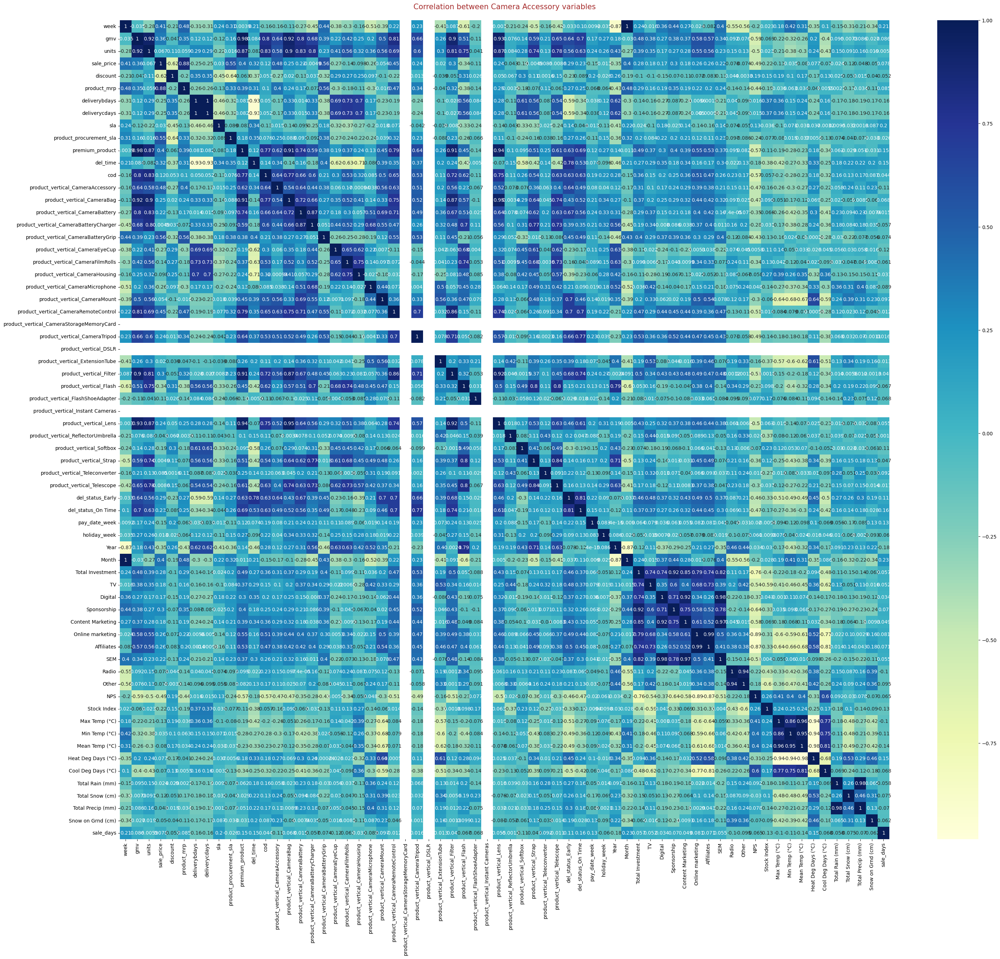

In [ ]:
# Plotting heatmap of correlation between camera accessory
plt.figure(figsize=[35,30])
sns.heatmap(cameraaccessory_model_df.corr(), cmap="YlGnBu", annot=True)
plt.title("Correlation between Camera Accessory variables\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.show()

In [ ]:
# Drop columns having high correlation

cameraaccessory_model_df.drop(columns = ["premium_product","Total Precip (mm)", "Max Temp (°C)", "Other", "Affiliates", "Content Marketing", "Sponsorship", "product_vertical_CameraStorageMemoryCard", "product_vertical_DSLR", "product_vertical_Instant Cameras","product_vertical_Telescope", "units"], axis=1, inplace=True)

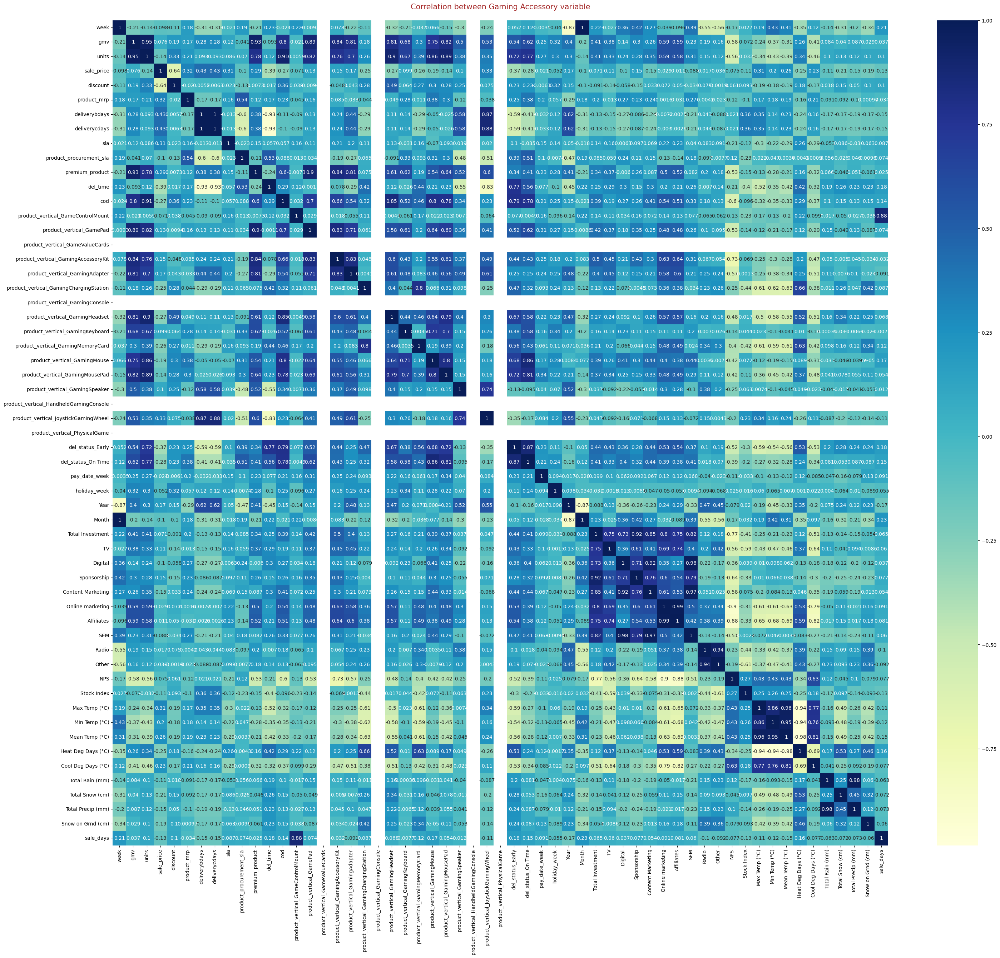

In [ ]:
# Plotting heatmap of correlation between gaming accessory
plt.figure(figsize=[35,30])
sns.heatmap(gamingaccessory_model_df.corr(), cmap="YlGnBu", annot=True)
plt.title("Correlation between Gaming Accessory variable\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.show()

In [ ]:
# Drop columns having high correlation

gamingaccessory_model_df.drop(columns = ["premium_product","product_vertical_GameValueCards","product_vertical_GamingConsole","product_vertical_HandheldGamingConsole","product_vertical_PhysicalGame","product_vertical_GameControlMount","Total Investment","Digital","Content Marketing","Radio","Total Precip (mm)","units"], axis=1, inplace=True)

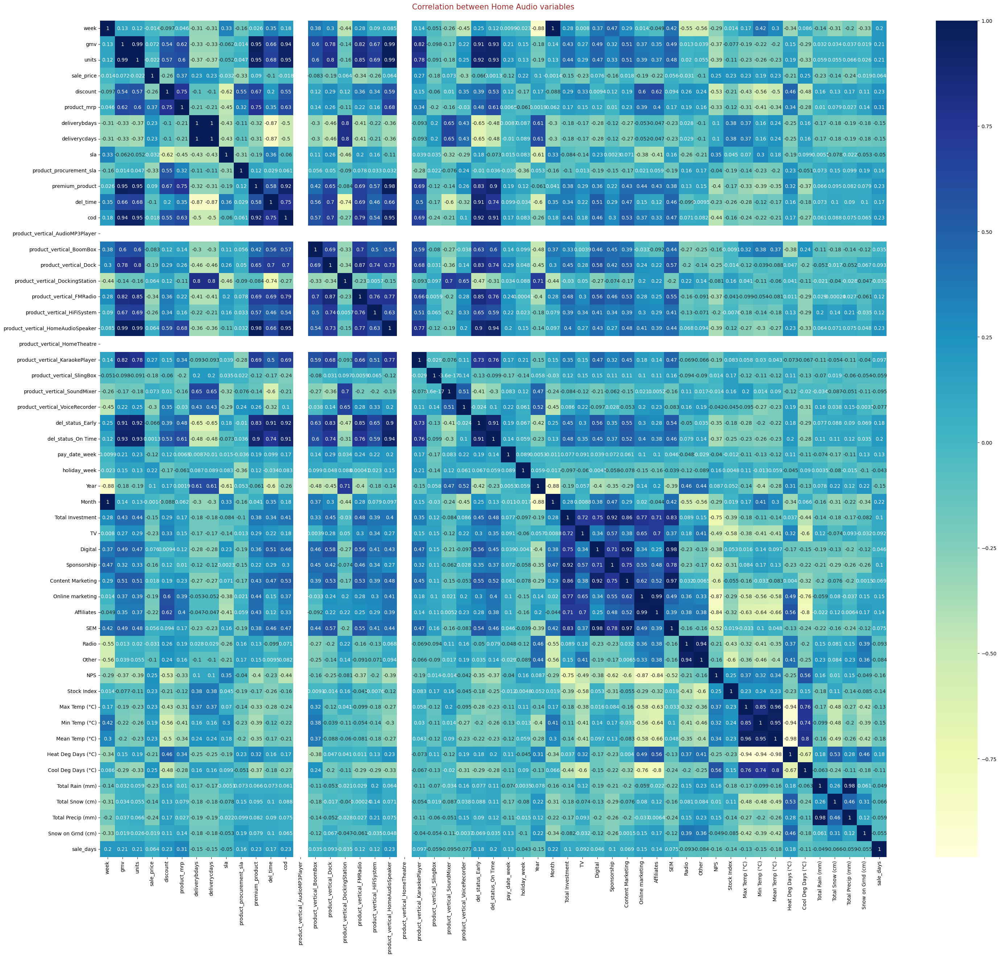

In [ ]:
# Plotting heatmap of correlation between homeaudio
plt.figure(figsize=[35,30])
sns.heatmap(homeaudio_model_df.corr(), cmap="YlGnBu", annot=True)
plt.title("Correlation between Home Audio variables\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})


plt.show()

In [ ]:
homeaudio_model_df.drop(columns=["premium_product","del_status_Early","product_vertical_AudioMP3Player","product_vertical_HomeTheatre","Total Investment","Digital","Content Marketing","Radio","Max Temp (°C)","Min Temp (°C)","Total Precip (mm)","units"], axis=1, inplace=True)

In [ ]:
# Train test split

cameraaccessory_model1_train, cameraaccessory_model1_test = train_test_split(cameraaccessory_model_df, train_size = 0.7, test_size = 0.3, random_state = 100)
gamingaccessory_model1_train, gamingaccessory_model1_test = train_test_split(gamingaccessory_model_df, train_size = 0.7, test_size = 0.3, random_state = 100)
homeaudio_model1_train, homeaudio_model1_test = train_test_split(homeaudio_model_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [ ]:
# Separating X and y train sets(Dependent and target variables)

y_cameraaccessory_model1_train = cameraaccessory_model1_train.pop('gmv')
X_cameraaccessory_model1_train = cameraaccessory_model1_train

y_gamingaccessory_model1_train = gamingaccessory_model1_train.pop('gmv')
X_gamingaccessory_model1_train = gamingaccessory_model1_train

y_homeaudio_model1_train = homeaudio_model1_train.pop('gmv')
X_homeaudio_model1_train = homeaudio_model1_train

In [ ]:
# Separating X and y test sets(Dependent and target variables)

y_cameraaccessory_model1_test = cameraaccessory_model1_test.pop('gmv')
X_cameraaccessory_model1_test = cameraaccessory_model1_test

y_gamingaccessory_model1_test = gamingaccessory_model1_test.pop('gmv')
X_gamingaccessory_model1_test = gamingaccessory_model1_test

y_homeaudio_model1_test = homeaudio_model1_test.pop('gmv')
X_homeaudio_model1_test = homeaudio_model1_test

In [ ]:
#Rescaling the features using standard scaler

# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_cameraaccessory_model1_train[X_cameraaccessory_model1_train.columns]=scaler.fit_transform(X_cameraaccessory_model1_train[X_cameraaccessory_model1_train.columns])
# Transform on test data
X_cameraaccessory_model1_test[X_cameraaccessory_model1_test.columns]=scaler.transform(X_cameraaccessory_model1_test[X_cameraaccessory_model1_test.columns])

In [ ]:
X_cameraaccessory_model1_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,week,sale_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,del_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraTripod,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,del_status_Early,del_status_On Time,pay_date_week,holiday_week,Year,Month,Total Investment,TV,Digital,Online marketing,SEM,Radio,NPS,Stock Index,Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Snow on Grnd (cm),sale_days
count,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000
mean,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000
std,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460
min,-1.69011,-2.35048,-1.41719,-2.37100,-0.50992,-0.51005,-3.12786,-1.36658,-2.54688,-2.28239,-2.99075,-2.28778,-2.54902,-2.01621,-1.81638,-0.68055,-1.36943,-0.39223,-0.50568,-1.54342,-2.38841,-1.72219,-0.94387,-1.77053,-1.22647,-0.24618,-1.91543,-0.17150,-0.38633,-2.46887,0.00000,-1.84164,-1.55226,-0.81650,-0.81650,-0.91766,-1.59021,-1.46334,-1.48984,-0.65359,-2.09003,-0.72065,-0.42708,-1.19279,-1.80674,-2.29706,-2.09707,-1.01609,-0.66918,-0.72130,-0.35691,-0.30085,-0.31934
25%,-0.88571,-0.86558,-0.87117,-0.71704,-0.50992,-0.51005,-0.38668,-0.66487,0.10498,-0.53195,-0.58954,-0.33644,-0.41374,-0.49261,-0.82305,-0.68055,-0.54444,-0.39223,-0.50568,-0.60000,-0.53617,-0.40410,-0.94387,-0.37773,-0.91662,-0.24618,-0.41248,-0.17150,-0.38633,-0.64218,0.00000,-0.36103,-0.52636,-0.81650,-0.81650,-0.91766,-0.90478,-0.69615,-0.80312,-0.49720,-0.01566,-0.48998,-0.42708,-0.54496,-1.03018,-0.65965,-0.70613,-0.98771,-0.66918,-0.66108,-0.35691,-0.30085,-0.31934
50%,0.10431,0.09574,-0.10969,0.11228,-0.50904,-0.50915,0.22565,0.13080,0.37398,-0.11592,-0.06047,-0.19072,-0.19910,-0.37770,0.17029,-0.35426,-0.08164,-0.39223,-0.50568,-0.07587,-0.01754,-0.15840,-0.37429,-0.13939,-0.25691,-0.24618,-0.22275,-0.17150,-0.38633,-0.08623,0.00000,0.00358,-0.24900,-0.81650,-0.81650,-0.91766,0.05483,-0.20689,0.11361,-0.38628,0.08202,-0.37772,-0.42708,-0.44715,0.45349,0.10448,0.00266,-0.20402,-0.66918,-0.46922,-0.35691,-0.30085,-0.31934
75%,0.87776,0.88436,0.89267,0.85563,-0.47622,-0.47617,0.55943,0.39822,0.52872,0.54612,0.55001,0.04032,0.16912,0.23397,0.66695,0.29832,0.22019,-0.39223,0.12642,0.48319,0.51167,0.34929,0.76486,0.08

In [ ]:
#Build a linear regression model for camera accessory

cameraaccessory_model1 = LinearRegression().fit(X_cameraaccessory_model1_train, y_cameraaccessory_model1_train)
y_cameraaccessory_model1_test_pred = cameraaccessory_model1.predict(X_cameraaccessory_model1_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_model1_test, y_cameraaccessory_model1_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model1_test, y_cameraaccessory_model1_test_pred)))

R2 Score: 0.8765855688512916
Mean Squared Error: 477006929304.2764


In [ ]:
# Min and Max of GMV
Ymax = camera_accessory_df.gmv.max()
Ymin = camera_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  12709353.76009569
Minimumn Y :  299.0


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model1_test, y_cameraaccessory_model1_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.05434368609688752

In [ ]:
#Building Linear Regression model for cameraaccessory using K-fold Cross Validation

In [ ]:
cameraaccessory_model1_cvdf = cameraaccessory_model_df.copy()

y_cameraaccessory_model1_cvdf = cameraaccessory_model1_cvdf.pop('gmv')
X_cameraaccessory_model1_cvdf = cameraaccessory_model1_cvdf

In [ ]:
cameraaccessory_model1_cv = LinearRegression().fit(X_cameraaccessory_model1_cvdf, y_cameraaccessory_model1_cvdf)
cameraaccessory_predictions_cv = cross_val_predict(cameraaccessory_model1_cv, X_cameraaccessory_model1_cvdf, y_cameraaccessory_model1_cvdf, cv=11)
accuracy = metrics.r2_score(y_cameraaccessory_model1_cvdf, cameraaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model1_cvdf, cameraaccessory_predictions_cv)))

Cross-Predicted Accuracy: -0.2910250266402652
Mean Squared Error: 5103230044993.284


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model1_cvdf, cameraaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.17774988239134187

In [ ]:
#Determining Feature Importance for cameraaccessory from model without cv

# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
cameraaccessory_lr_model_parameters = list(cameraaccessory_model1.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_model1.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_model1_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))

In [ ]:
# Creating a dataframe of the parameters and coefficients

cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
#cameraaccessory_lr_coef_df

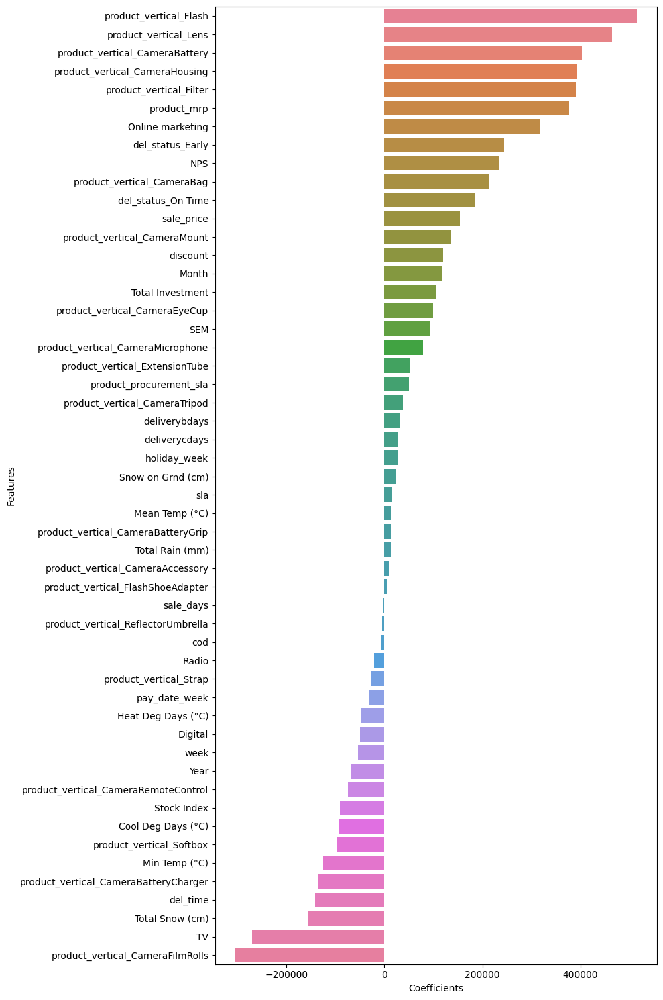

In [ ]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

In [3]:
#Gaming accessory

In [ ]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_gamingaccessory_model1_train[X_gamingaccessory_model1_train.columns]=scaler.fit_transform(X_gamingaccessory_model1_train[X_gamingaccessory_model1_train.columns])
# Transform on test data
X_gamingaccessory_model1_test[X_gamingaccessory_model1_test.columns]=scaler.transform(X_gamingaccessory_model1_test[X_gamingaccessory_model1_test.columns])

In [ ]:
X_gamingaccessory_model1_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,week,sale_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,del_time,cod,product_vertical_GamePad,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_JoystickGamingWheel,del_status_Early,del_status_On Time,pay_date_week,holiday_week,Year,Month,TV,Sponsorship,Online marketing,Affiliates,SEM,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Snow on Grnd (cm),sale_days
count,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000
mean,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000
std,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460
min,-1.82915,-2.25937,-1.49667,-1.20151,-0.64339,-0.64366,-2.54570,-1.74806,-2.08536,-1.73165,-2.57962,-2.61248,-2.21876,-0.56972,-1.50096,-1.53305,-0.84913,-1.06569,-1.56484,-0.69882,-0.97066,-1.38831,-1.19248,-0.91766,-0.67700,-0.91766,-1.81828,-1.35338,-1.16025,-1.92880,-2.02096,-0.70054,-0.41311,-1.17090,-2.02826,-2.07185,-2.61674,-2.36746,-0.90625,-0.74768,-0.80402,-0.24605,-0.22888,-0.36591
25%,-0.77462,-0.69079,-0.59617,-0.42545,-0.64339,-0.64366,-0.52150,-0.66492,-0.95762,-0.46113,-0.41357,-0.43062,-0.48384,-0.56972,-0.89588,-0.47514,-0.61091,-0.34729,-0.66780,-0.66357,-0.66853,-0.83552,-0.62879,-0.91766,-0.67700,-0.91766,-0.74742,-0.92066,-0.84134,-0.42465,-0.35996,-0.45449,-0.41311,-0.58157,-0.89307,-0.77291,-0.76741,-0.57613,-0.87611,-0.74768,-0.71022,-0.24605,-0.22888,-0.36591
50%,0.07581,-0.04375,0.02223,-0.31736,-0.64207,-0.64218,-0.01834,0.02103,0.35627,0.09463,-0.07103,0.09550,-0.06897,-0.56972,0.07334,-0.20421,-0.39734,-0.20270,-0.11961,-0.34639,-0.51746,-0.12517,-0.13002,-0.91766,-0.67700,-0.91766,0.01748,-0.01716,-0.25544,0.18004,0.30376,-0.35808,-0.41311,-0.49260,0.49292,0.13070,0.02516,0.07254,-0.32469,-0.74768,-0.44823,-0.24605,-0.22888,-0.36591
75%,0.85821,0.76658,0.24024,-0.06071,1.38042,1.37841,0.40366,0.38281,0.79289,0.41363,0.49819,0.60614,0.72306,0.16880,0.43265,0.35055,0.02159,0.02970,0.35383,0.11177,0.27983,0.65101,0.25364,1.08972,1.47710,1.08972,0.93536,0.74526,0.92834,0.71920,0.77129,-0.22391,-0.41311,0.40880,0.78332,0.86488,0.72967,0.88793,0.47141,0.74399,0.34744,-0.24605,-0.22888,-0.08750
max,1.57257,1.73545,3.90456,4.04817,1.70567,1.71766,3.49125,3.03191,1.29346,3.85944,2.47031,2.27735,2.30713,3.12289,3.02257,4.51767,4.00556,5.21745,4.34070,3.45984,2.18495,3.53004,4.71007,1.08972,1.47710,1.08972,1.54728,2.33033,1.97421,1.18948,1.13685,2.70095,3.42641,2.46452,0.96812,1.37316,1.55159,1.29869,2.67768,2.17629,3.33608,4.19868,5.64891,5.20229


In [ ]:
#Linear Regression model for gamingaccessory


gamingaccessory_model1 = LinearRegression().fit(X_gamingaccessory_model1_train , y_gamingaccessory_model1_train)
y_gamingaccessory_model1_test_pred = gamingaccessory_model1.predict(X_gamingaccessory_model1_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_model1_test, y_gamingaccessory_model1_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model1_test, y_gamingaccessory_model1_test_pred)))

R2 Score: 0.7222434499047494
Mean Squared Error: 369981943068.66174


In [ ]:
# Min and Max of GMV
Ymax = gaming_accessory_df.gmv.max()
Ymin = gaming_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  7209730.620678344
Minimumn Y :  598.0


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model1_test, y_gamingaccessory_model1_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.08437373012085933

In [ ]:
#LR model using K-fold cross validation

gamingaccessory_model1_cvdf = gamingaccessory_model_df.copy()

y_gamingaccessory_model1_cvdf = gamingaccessory_model1_cvdf.pop('gmv')
X_gamingaccessory_model1_cvdf = gamingaccessory_model1_cvdf

In [ ]:
gamingaccessory_model1_cv = LinearRegression().fit(X_gamingaccessory_model1_cvdf, y_gamingaccessory_model1_cvdf)
gamingaccessory_predictions_cv = cross_val_predict(gamingaccessory_model1_cv, X_gamingaccessory_model1_cvdf, y_gamingaccessory_model1_cvdf, cv=11)
accuracy = metrics.r2_score(y_gamingaccessory_model1_cvdf, gamingaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model1_cvdf, gamingaccessory_predictions_cv)))

Cross-Predicted Accuracy: -0.060547597817531607
Mean Squared Error: 1776451234181.1638


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model1_cvdf, gamingaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.1848815740785925

In [ ]:
#Determining Feature Importance for gamingaccessory from model without cv

In [ ]:
#Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
gamingaccessory_lr_model_parameters = list(gamingaccessory_model1.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_model1.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_model1_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))

In [ ]:
# Creating a dataframe of the parameters and coefficients

gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
#gamingaccessory_lr_coef_df

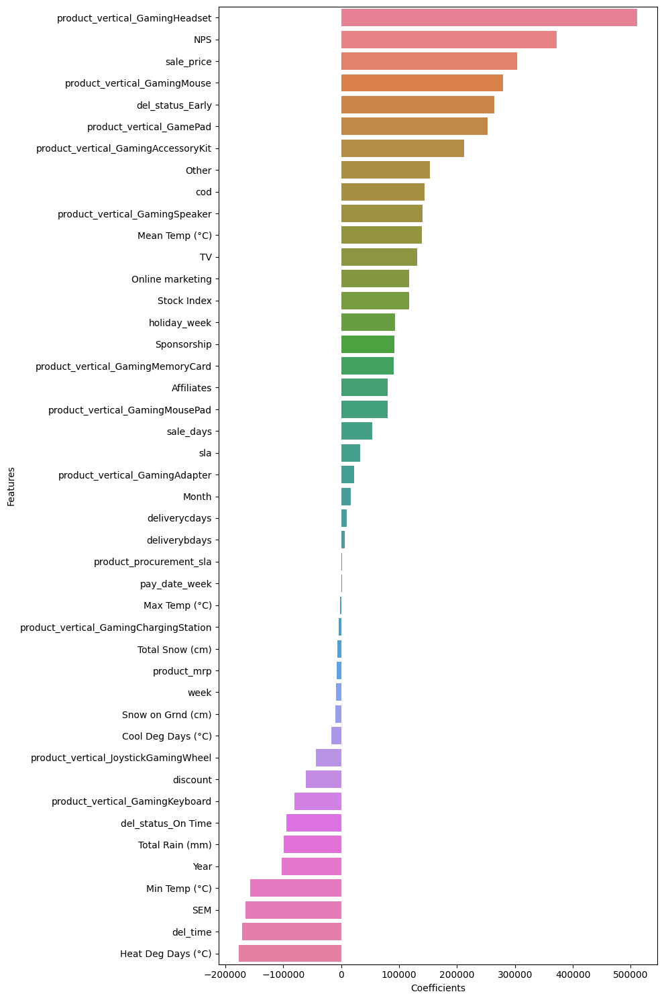

In [ ]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

In [ ]:
#HomeAudio

# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_homeaudio_model1_train[X_homeaudio_model1_train.columns]=scaler.fit_transform(X_homeaudio_model1_train[X_homeaudio_model1_train.columns])
# Transform on test data
X_homeaudio_model1_test[X_homeaudio_model1_test.columns]=scaler.transform(X_homeaudio_model1_test[X_homeaudio_model1_test.columns])

In [ ]:
X_homeaudio_model1_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,week,sale_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,del_time,cod,product_vertical_BoomBox,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,del_status_On Time,pay_date_week,holiday_week,Year,Month,TV,Sponsorship,Online marketing,Affiliates,SEM,Other,NPS,Stock Index,Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Snow on Grnd (cm),sale_days
count,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000
mean,-0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000
std,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,0.00000,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550
min,-1.67252,-1.85898,-4.12561,-1.57692,-0.60878,-0.60932,-1.72232,-3.91560,-2.24188,-2.34815,-2.10624,-2.03124,-1.09251,-2.89303,-2.37420,-2.61892,0.00000,-0.24019,-0.59830,-2.20990,-1.88880,-0.75593,-0.80623,-0.97014,-1.57108,-1.57580,-1.19488,-2.25130,-2.38325,-0.73047,-0.43995,-1.30015,-1.73351,-1.99283,-1.06599,-0.63977,-0.77433,-0.45838,-0.31632,-0.28919
25%,-0.86723,-0.53696,-0.37883,-0.65571,-0.60878,-0.60932,-0.65433,-0.62745,-0.74143,-0.45180,-0.64062,-0.83717,-0.57747,-0.35020,-0.54246,-0.62384,0.00000,-0.24019,-0.59830,-0.67950,-0.78573,-0.75593,-0.80623,-0.97014,-0.74813,-0.87424,-0.86548,-0.04950,-0.01258,-0.45870,-0.43995,-0.57131,-1.27754,-0.95842,-1.01071,-0.63977,-0.68983,-0.45838,-0.31632,-0.28919
50%,0.06195,-0.13034,-0.04527,-0.16035,-0.60790,-0.60832,-0.05309,0.12448,0.45410,0.18031,-0.32973,0.24835,-0.23411,-0.06077,0.04037,-0.07267,0.00000,-0.24019,-0.59830,-0.04738,0.00413,-0.75593,-0.80623,-0.97014,0.07481,0.06229,-0.26030,0.07345,0.17784,-0.35220,-0.43995,-0.46127,0.47240,-0.02852,-0.14258,-0.63977,-0.44236,-0.45838,-0.31632,-0.28919
75%,0.92918,0.28599,0.44612,0.56063,0.60044,0.60566,0.53838,0.63900,0.64857,0.47310,0.95824,0.68256,0.62429,0.69037,0.62320,0.46586,0.00000,-0.24019,0.44085,0.45166,0.48076,1.32288,1.24035,1.03078,0.89776,0.70299,0.96242,0.92165,0.83858,-0.20400,-0.43995,0.46448,0.81746,1.01491,0.97592,0.55975,0.22157,-0.45838,-0.31632,-0.28919
max,1.54863,2.92203,2.08083,2.54771,2.18803,2.19399,3.48667,1.90355,1.25777,1.90549,2.02415,2.36512,3.02780,1.75849,2.45494,2.27479,0.00000,5.04404,3.03871,3.51245,3.19078,1.32288,1.24035,1.03078,1.44639,2.35292,2.04270,1.18625,1.09564,3.02664,2.80698,3.19592,1.06393,1.44922,2.22014,2.44920,3.08853,2.80021,5.14522,5.16405


In [ ]:
#Build LR model for homeaudio

homeaudio_model1 = LinearRegression().fit(X_homeaudio_model1_train, y_homeaudio_model1_train)
y_homeaudio_model1_test_pred = homeaudio_model1.predict(X_homeaudio_model1_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_model1_test, y_homeaudio_model1_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model1_test, y_homeaudio_model1_test_pred)))

R2 Score: 0.9762507237211392
Mean Squared Error: 376768499445.616


In [ ]:
# Min and Max of GMV
Ymax = home_audio_df.gmv.max()
Ymin = home_audio_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  19173248.0
Minimumn Y :  2599.0


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model1_test, y_homeaudio_model1_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.03201846275546351

In [ ]:
#Build LR model for homeaudio using K-fold Cross Validation

homeaudio_model1_cvdf = homeaudio_model_df.copy()

y_homeaudio_model1_cvdf = homeaudio_model1_cvdf.pop('gmv')
X_homeaudio_model1_cvdf = homeaudio_model1_cvdf

In [ ]:
homeaudio_model1_cv = LinearRegression().fit(X_homeaudio_model1_cvdf, y_homeaudio_model1_cvdf)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model1_cv, X_homeaudio_model1_cvdf, y_homeaudio_model1_cvdf, cv=11)
accuracy = metrics.r2_score(y_homeaudio_model1_cvdf, homeaudio_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model1_cvdf, homeaudio_predictions_cv)))

Cross-Predicted Accuracy: 0.7606514612198227
Mean Squared Error: 1575479424629.596


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model1_cvdf, homeaudio_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.06547410223891047

In [ ]:
#Determining Feature Importance for homeaudio with model without cv

In [ ]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
homeaudio_adlr_model_parameters = list(homeaudio_model1.coef_)
homeaudio_adlr_model_parameters.insert(0, homeaudio_model1.intercept_)
homeaudio_adlr_model_parameters = [round(x, 3) for x in homeaudio_adlr_model_parameters]
cols = X_homeaudio_model1_test.columns
cols = cols.insert(0, "constant")
homeaudio_adlr_coef = list(zip(cols, homeaudio_adlr_model_parameters))

In [ ]:
# Creating a dataframe of the parameters and coefficients

homeaudio_adlr_coef_df = pd.DataFrame(homeaudio_adlr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_adlr_coef_df = homeaudio_adlr_coef_df.rename(columns=col_rename)
homeaudio_adlr_coef_df = homeaudio_adlr_coef_df.iloc[1:,:]
homeaudio_adlr_coef_df = homeaudio_adlr_coef_df.loc[homeaudio_adlr_coef_df['Coefficients']!=0.0]
homeaudio_adlr_coef_df = homeaudio_adlr_coef_df.sort_values(by=['Coefficients'], ascending = False)
#homeaudio_adlr_coef_df

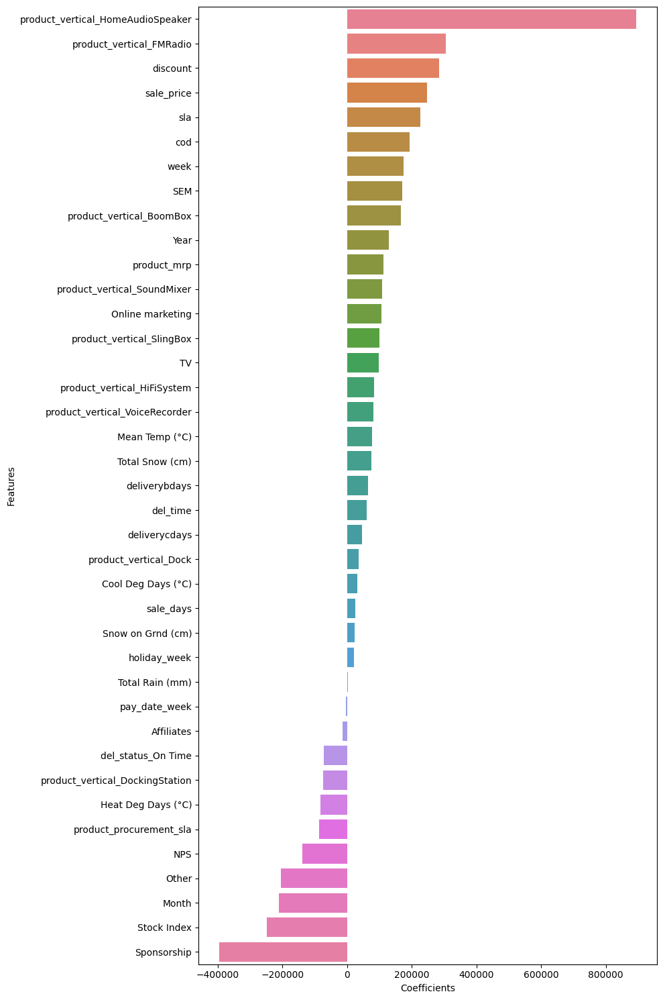

In [ ]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_adlr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

### Model 2: Multiplicative Model

In [ ]:
# Copying the data for model 2

cameraaccessory_model2_df = camera_accessory_df.drop(columns="week")
gamingaccessory_model2_df = gaming_accessory_df.drop(columns="week")
#gamingaccessory_model2_df = gamingaccessory_model_df.copy()
homeaudio_model2_df = home_audio_df.drop(columns="week")


In [ ]:
# Taking the log of all the features of the three categories

cameraaccessory_model2_df = cameraaccessory_model2_df.applymap(lambda x: np.log(x))
cameraaccessory_model2_df = cameraaccessory_model2_df.replace([np.inf, -np.inf], 0)
cameraaccessory_model2_df = cameraaccessory_model2_df.replace(np.nan, 0)

gamingaccessory_model2_df = gamingaccessory_model2_df.applymap(lambda x: np.log(x))
gamingaccessory_model2_df = gamingaccessory_model2_df.replace([np.inf, -np.inf], 0)
gamingaccessory_model2_df = gamingaccessory_model2_df.replace(np.nan, 0)

homeaudio_model2_df = homeaudio_model2_df.applymap(lambda x: np.log(x))
homeaudio_model2_df = homeaudio_model2_df.replace([np.inf, -np.inf], 0)
homeaudio_model2_df = homeaudio_model2_df.replace(np.nan, 0)

In [ ]:
cameraaccessory_model2_df.head()

,gmv,units,sale_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,premium_product,del_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,del_status_Early,del_status_On Time,pay_date_week,holiday_week,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
25,15.133,7.965,7.204,3.810,7.799,0.000,0.000,1.938,1.022,5.832,9.361,7.534,3.738,5.799,6.479,5.398,2.398,0.000,0.000,0.000,0.000,1.386,4.949,0.000,6.068,0.000,0.000,5.389,3.258,0.000,0.000,6.176,0.000,0.000,2.565,0.000,2.773,7.754,5.136,0.000,0.000,7.608,1.946,1.450,-2.919,-0.457,0.617,0.000,-1.103,-1.988,0.228,0.000,0.000,4.000,7.071,3.332,2.526,3.001,-1.261,0.869,1.485,0.000,1.485,0.000,0.000
26,15.255,8.031,7.251,3.819,7.821,0.000,0.000,1.850,1.033,5.964,9.272,7.595,3.401,5.855,6.560,5.398,1.792,0.000,0.000,0.000,0.000,2.398,4.942,0.000,6.198,0.000,0.000,5.220,3.296,0.000,0.000,6.252,0.000,0.000,3.178,0.000,3.091,7.782,5.398,0.000,0.000,7.608,1.946,1.450,-2.919,-0.457,0.617,0.000,-1.103,-1.988,0.228,0.000,0.000,4.000,7.071,3.497,2.398,3.143,0.000,1.645,0.336,0.000,0.336,0.000,0.693
27,15.246,8.023,7.258,3.801,7.828,0.000,0.000,1.855,1.054,5.889,9.255,7.605,3.738,5.663,6.605,5.580,2.197,0.000,0.000,0.000,0.000,1.946,4.682,0.000,6.129,0.000,0.000,5.226,3.434,0.000,0.000,6.328,0.000,0.000,3.135,0.000,3.401,7.798,5.273,0.000,0.000,7.608,1.946,1.450,-2.919,-0.457,0.617,0.000,-1.103,-1.988,0.228,0.000,0.000,4.000,7.071,3.450,2.674,3.138,0.000,1.621,-0.105,0.000,-0.105,0.000,0.000
28,14.812,7.612,7.225,3.786,7.775,0.000,0.000,1.849,1.040,5.517,8.842,7.226,3.689,5.215,6.131,5.176,2.197,0.000,0.000,0.000,0.000,0.693,4.407,0.000,5.881,0.000,0.000,4.691,3.332,0.000,0.000,5.778,0.000,0.000,3.135,0.000,2.565,7.383,4.977,0.000,0.000,7.608,1.946,1.450,-2.919,-0.457,0.617,0.000,-1.103,-1.988,0.228,0.000,0.000,4.000,7.071,3.512,2.773,3.201,0.000,1.882,1.533,0.000,1.533,0.000,0.000
29,6.550,0.000,6.550,3.947,7.279,0.000,0.000,1.609,1.386,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,7.608,2.079,0.013,-6.908,-1.363,-1.546,0.000,-3.650,-4.200,-0.687,0.000,0.000,4.094,7.095,3.350,2.708,3.075,0.000,1.295,-1.273,0.000,-1.273,0.000,0.000


In [ ]:
# Train test split

cameraaccessory_model2_train, cameraaccessory_model2_test = train_test_split(cameraaccessory_model2_df, train_size = 0.7, test_size = 0.3, random_state = 100)
gamingaccessory_model2_train, gamingaccessory_model2_test = train_test_split(gamingaccessory_model2_df, train_size = 0.7, test_size = 0.3, random_state = 100)
homeaudio_model2_train, homeaudio_model2_test = train_test_split(homeaudio_model2_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [ ]:
# Separating X and y train sets(Dependent and target variables)

y_cameraaccessory_model2_train = cameraaccessory_model2_train.pop('gmv')
X_cameraaccessory_model2_train = cameraaccessory_model2_train

y_gamingaccessory_model2_train = gamingaccessory_model2_train.pop('gmv')
X_gamingaccessory_model2_train = gamingaccessory_model2_train

y_homeaudio_model2_train = homeaudio_model2_train.pop('gmv')
X_homeaudio_model2_train = homeaudio_model2_train

In [ ]:
# Separating X and y test sets(Dependent and target variables)

y_cameraaccessory_model2_test = cameraaccessory_model2_test.pop('gmv')
X_cameraaccessory_model2_test = cameraaccessory_model2_test

y_gamingaccessory_model2_test = gamingaccessory_model2_test.pop('gmv')
X_gamingaccessory_model2_test = gamingaccessory_model2_test

y_homeaudio_model2_test = homeaudio_model2_test.pop('gmv')
X_homeaudio_model2_test = homeaudio_model2_test

In [ ]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_cameraaccessory_model2_train[X_cameraaccessory_model2_train.columns]=scaler.fit_transform(X_cameraaccessory_model2_train[X_cameraaccessory_model2_train.columns])
# Transform on test data
X_cameraaccessory_model2_test[X_cameraaccessory_model2_test.columns]=scaler.transform(X_cameraaccessory_model2_test[X_cameraaccessory_model2_test.columns])

In [ ]:
X_cameraaccessory_model2_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,units,sale_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,premium_product,del_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,del_status_Early,del_status_On Time,pay_date_week,holiday_week,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
count,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000
mean,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
std,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,0.00000,1.01460,1.01460,1.01460,0.00000,0.00000,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,1.01460,1.01460,0.00000,0.00000,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460
min,-5.66884,-2.79976,-1.48684,-2.71645,-1.74396,-1.75524,-3.32291,-1.52892,-5.58344,-1.83327,-5.29613,-5.18180,-5.57320,-5.61144,-5.41130,-2.62626,-0.74978,-2.50278,-0.37205,-0.42184,-3.05158,-5.34833,0.00000,-5.33820,0.00000,-0.82898,-5.46677,-3.78962,0.00000,0.00000,-5.54954,-0.17150,-0.17150,-5.00950,0.00000,-4.52251,-5.20801,-5.18417,0.00000,0.00000,-0.91766,-2.22493,-2.92591,-3.44612,-1.49350,-2.55193,-1.92098,-3.35519,-3.34178,-1.54016,-2.72120,-0.40746,-1.26633,-1.84442,-3.79378,-1.11221,-3.53551,-1.81392,-1.86236,-2.07059,-0.35673,-2.08307,-0.33631,-0.41292
25%,-0.01232,-0.80375,-0.87789,-0.65798,-1.20966,-1.21398,-0.33519,-0.68620,0.02945,0.41699,0.03607,-0.15044,0.02894,0.02757,-0.07017,-0.60253,-0.74978,-0.05735,-0.37205,-0.42184,-0.22233,-0.10456,0.00000,-0.00007,0.00000,-0.82898,-0.04167,-0.43863,0.00000,0.00000,-0.01300,-0.17150,-0.17150,-0.26248,0.00000,-0.22059,0.09982,-0.16391,0.00000,0.00000,-0.91766,-0.59248,-0.35113,-0.08078,-0.58959,-0.57053,-0.33223,0.29231,0.29574,-0.56160,0.42855,-0.40248,-0.54118,-1.01000,-0.30445,-1.11221,-0.24433,-1.13565,-0.61701,-0.45571,-0.35673,-0.51041,-

In [ ]:
cameraaccessory_model2 = LinearRegression().fit(X_cameraaccessory_model2_train, y_cameraaccessory_model2_train)
y_cameraaccessory_model2_test_pred = cameraaccessory_model2.predict(X_cameraaccessory_model2_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_model2_test, y_cameraaccessory_model2_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model2_test, y_cameraaccessory_model2_test_pred)))

R2 Score: 0.9635527801889557
Mean Squared Error: 0.3433238699924991


In [ ]:
# Min and Max of GMV
Ymax = camera_accessory_df.gmv.max()
Ymin = camera_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  12709353.76009569
Minimumn Y :  299.0


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model2_test, y_cameraaccessory_model2_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000005


In [ ]:
#Building Linear Regression Model for cameraccesory using K-fold Cross Validation

cameraaccessory_model2_cvdf = cameraaccessory_model2_df.copy()

y_cameraaccessory_model2_cvdf = cameraaccessory_model2_cvdf.pop('gmv')
X_cameraaccessory_model2_cvdf = cameraaccessory_model2_cvdf

In [ ]:
cameraaccessory_model2_cv = LinearRegression().fit(X_cameraaccessory_model2_cvdf, y_cameraaccessory_model2_cvdf)
cameraaccessory_predictions_mcv = cross_val_predict(cameraaccessory_model2_cv, X_cameraaccessory_model2_cvdf, y_cameraaccessory_model2_cvdf, cv=11)
accuracy = metrics.r2_score(y_cameraaccessory_model2_cvdf, cameraaccessory_predictions_mcv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model2_cvdf, cameraaccessory_predictions_mcv)))

Cross-Predicted Accuracy: 0.9857461432662609
Mean Squared Error: 0.06563080971054348


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model2_cvdf, cameraaccessory_predictions_mcv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000002


In [ ]:
#Determining Feature Importance for cameraaccessory from model with cv

In [ ]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
cameraaccessory_mul_lr_model_parameters = list(cameraaccessory_model2_cv.coef_)
cameraaccessory_mul_lr_model_parameters.insert(0, cameraaccessory_model2_cv.intercept_)
cameraaccessory_mul_lr_model_parameters = [round(x, 3) for x in cameraaccessory_mul_lr_model_parameters]
cols = X_cameraaccessory_model2_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_mul_lr_coef = list(zip(cols, cameraaccessory_mul_lr_model_parameters))

In [ ]:
# Creating a dataframe of parameter coefficients

cameraaccessory_mul_lr_coef_df = pd.DataFrame(cameraaccessory_mul_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.rename(columns=col_rename)
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.iloc[1:,:]
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.loc[cameraaccessory_mul_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_mul_lr_coef_df = cameraaccessory_mul_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_mul_lr_coef_df

,Features,Coefficients
1,units,0.951
2,sale_price,0.787
6,deliverycdays,0.234
32,product_vertical_ReflectorUmbrella,0.203
4,product_mrp,0.142
50,SEM,0.104
9,premium_product,0.079
37,del_status_Early,0.071
20,product_vertical_CameraMicrophone,0.059
43,Total Investment,0.058


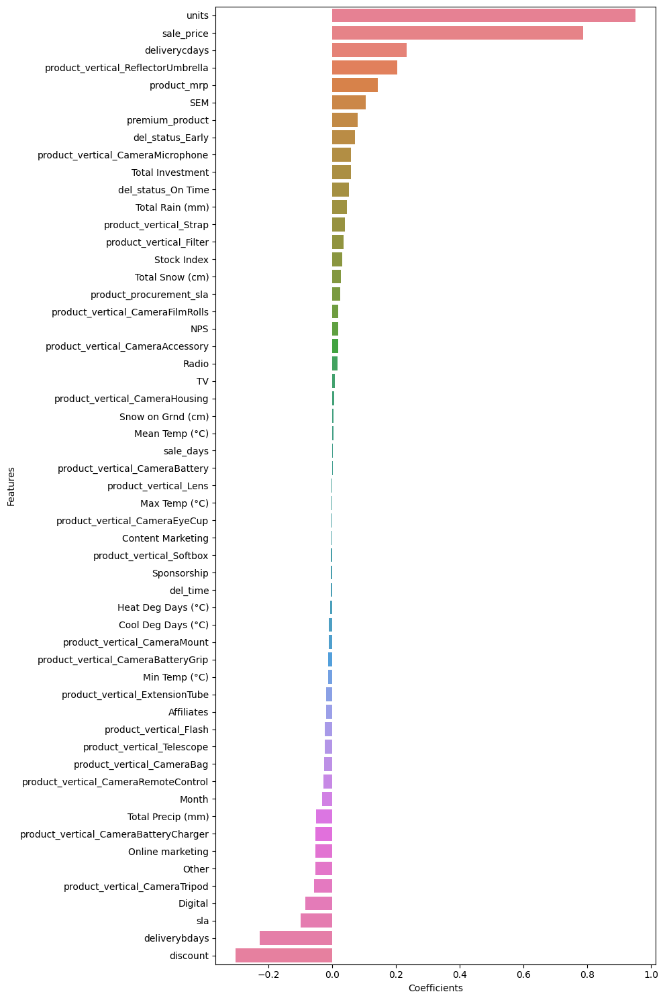

In [ ]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_mul_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

In [ ]:
#Gaming accessory

In [ ]:
#Re-scalling the features using Standard scaler

# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_gamingaccessory_model2_train[X_gamingaccessory_model2_train.columns]=scaler.fit_transform(X_gamingaccessory_model2_train[X_gamingaccessory_model2_train.columns])
# Transform on test data
X_gamingaccessory_model2_test[X_gamingaccessory_model2_test.columns]=scaler.transform(X_gamingaccessory_model2_test[X_gamingaccessory_model2_test.columns])

In [ ]:
X_gamingaccessory_model2_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,units,sale_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,premium_product,del_time,cod,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GameValueCards,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingConsole,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_HandheldGamingConsole,product_vertical_JoystickGamingWheel,product_vertical_PhysicalGame,del_status_Early,del_status_On Time,pay_date_week,holiday_week,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
count,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000
mean,-0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000
std,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,0.00000,1.01460,1.01460,1.01460,0.00000,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,0.00000,1.01460,1.01460,0.00000,0.00000,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460
min,-3.96073,-2.51711,-1.67493,-2.05125,-1.70115,-1.72372,-2.83785,-1.97917,-3.98571,-1.47388,-3.65965,0.00000,-4.12745,0.00000,-3.94339,-3.76877,-0.50549,0.00000,-3.74994,-3.78966,-2.90201,-3.86689,-3.66925,-1.14214,0.00000,-2.77879,0.00000,-3.59303,-3.66838,0.00000,0.00000,-0.91766,-2.72675,-2.58424,-2.88353,-1.40605,-2.41769,-1.77180,-2.84552,-2.83801,-1.48193,-2.18108,-0.35900,-1.24510,-2.06932,-2.72771,-1.23723,-2.28155,-1.71950,-3.35584,-2.25512,-0.24603,-2.26423,-0.25012,-0.49179
25%,0.03815,-0.61986,-0.60353,-0.46406,-1.19436,-1.19032,-0.50172,-0.65784,0.10065,-1.47388,0.12080,0.00000,0.10614,0.00000,0.07997,-0.00094,-0.50549,0.00000,-0.21506,-0.04194,-0.43555,0.05281,-0.25217,-1.14214,0.00000,-0.46080,0.00000,-0.23901,-0.24099,0.00000,0.00000,-0.91766,-0.42414,-0.21121,-0.15783,-0.59855,-0.53259,-0.60642,0.13891,0.14465,-0.46732,0.49669,-0.35335,-0.57968,-0.85652,-0.43173,-1.23723,-0.18141,-1.01977,-0.48832,-0.51231,-0.24603,-0.54650,-0.25012,-0.49179
50%,0.24951,0.02986,0.07342,-0.29076,0.53126,0.50202,0.01976,0.08320,0.23855,0.62499,0.33199,0.00000,0.20873,0.00000,0.25562,0.21031,-0.50549,0.00000,0.33987,0.15204,0.03326,0.16946,0.20261,0.08621,0.00000,-0.13422,0.00000,0.27620,0.23607,0.00000,0.00000,-0.91766,0.26463,0.22098,0.38847,-0.19505,0.23930,0.05067,0.38855,0.41613,-0.21045,0.49669,-0.35335,-0.48234,0.50182,0.30215,0.12147,0.33409,0.13409,-0.48832,-0.35141,-0.24603,-0.16080,-0.25012,-0.49179
75%,0.34098,0.76378,0.30185,0.08919,0.91030,0.93564,0.44165,0.44829,0.35309,0.76560,0.42568,0.00000,0.35120,0.00000,0.39606,0.51892,-0.50549,0.00000,0.45674,0.4

In [ ]:
gamingaccessory_model2 = LinearRegression().fit(X_gamingaccessory_model2_train, y_gamingaccessory_model2_train)
y_gamingaccessory_model2_test_pred = gamingaccessory_model2.predict(X_gamingaccessory_model2_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_model2_test, y_gamingaccessory_model2_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model2_test, y_gamingaccessory_model2_test_pred)))

R2 Score: 0.9857378701526095
Mean Squared Error: 0.08991306961434774


In [ ]:
# Min and Max of GMV
Ymax = gaming_accessory_df.gmv.max()
Ymin = gaming_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  7209730.620678344
Minimumn Y :  598.0


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model2_test, y_gamingaccessory_model2_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000004


In [ ]:
#Building Linear Regression model for gamingaccessory using K-fold Cross Validation

gamingaccessory_model2_cvdf = gamingaccessory_model2_df.copy()

y_gamingaccessory_model2_cvdf = gamingaccessory_model2_cvdf.pop('gmv')
X_gamingaccessory_model2_cvdf = gamingaccessory_model2_cvdf

In [ ]:
gamingaccessory_model2_cv = LinearRegression().fit(X_gamingaccessory_model2_cvdf, y_gamingaccessory_model2_cvdf)
gamingaccessory_predictions_cv = cross_val_predict(gamingaccessory_model2_cv, X_gamingaccessory_model2_cvdf, y_gamingaccessory_model2_cvdf, cv=11)
accuracy = metrics.r2_score(y_gamingaccessory_model2_cvdf, gamingaccessory_predictions_cv)

print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model2_cvdf, gamingaccessory_predictions_cv)))

Cross-Predicted Accuracy: 0.9350351725718644
Mean Squared Error: 0.2599607014219325


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model2_cvdf, gamingaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.7f}".format(NRMSE))

0.0000001


In [ ]:
#Determining Feature Importance for gamingaccessory with model without cv

In [ ]:
# Fromatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# Linear regression model parameter
gamingaccessory_mul_lr_model_parameters = list(gamingaccessory_model2.coef_)
gamingaccessory_mul_lr_model_parameters.insert(0, gamingaccessory_model2.intercept_)
gamingaccessory_mul_lr_model_parameters = [round(x, 3) for x in gamingaccessory_mul_lr_model_parameters]
cols = X_gamingaccessory_model2_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_mul_lr_coef = list(zip(cols, gamingaccessory_mul_lr_model_parameters))

In [ ]:
# Creating dataframe with parameters and coeffiecients

gamingaccessory_mul_lr_coef_df = pd.DataFrame(gamingaccessory_mul_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.rename(columns=col_rename)
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.iloc[1:,:]
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.loc[gamingaccessory_mul_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_mul_lr_coef_df = gamingaccessory_mul_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
gamingaccessory_mul_lr_coef_df

,Features,Coefficients
13,product_vertical_GamePad,0.423
1,units,0.327
19,product_vertical_GamingHeadset,0.252
9,premium_product,0.198
16,product_vertical_GamingAdapter,0.151
28,del_status_Early,0.149
32,Year,0.111
2,sale_price,0.101
29,del_status_On Time,0.088
41,SEM,0.086


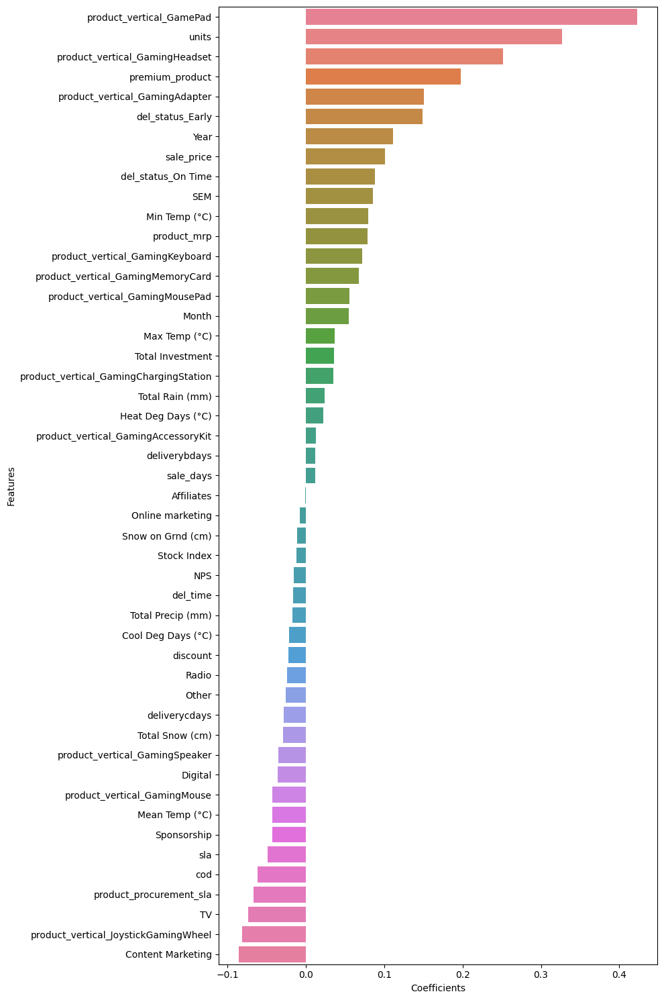

In [ ]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_mul_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

In [ ]:
#HomeAudio

# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_homeaudio_model2_train[X_homeaudio_model2_train.columns]=scaler.fit_transform(X_homeaudio_model2_train[X_homeaudio_model2_train.columns])
# Transform on test data
X_homeaudio_model2_test[X_homeaudio_model2_test.columns]=scaler.transform(X_homeaudio_model2_test[X_homeaudio_model2_test.columns])

In [ ]:
X_homeaudio_model2_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,units,sale_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,premium_product,del_time,cod,product_vertical_AudioMP3Player,product_vertical_BoomBox,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,del_status_Early,del_status_On Time,pay_date_week,holiday_week,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
count,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000
mean,-0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
std,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,0.00000,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,0.00000,0.00000,1.01550,1.01550,1.01550,1.01550,1.01550,0.00000,0.00000,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550
min,-5.51635,-1.99819,-4.82950,-1.72858,-2.49359,-2.34682,-2.02180,-4.19680,-5.45414,-1.55852,-4.67060,0.00000,-4.71163,-4.09547,-1.48838,-5.31524,-4.49182,-5.45193,0.00000,0.00000,-0.17678,-0.56280,-5.05305,-4.59934,-4.79195,0.00000,0.00000,-0.97014,-2.22873,-3.46921,-4.27811,-1.49205,-2.91731,-1.73911,-4.10602,-4.07790,-1.67987,-2.63177,-0.42140,-1.37479,-1.77097,-3.70388,-1.01403,-3.32957,-1.84807,-0.65572,-2.31263,-1.87694,-2.31600,-0.36163,-0.35511
25%,0.03979,-0.52475,-0.24140,-0.64622,0.12436,0.15253,-0.64351,-0.57026,-0.04002,-1.55852,0.10685,0.00000,-0.23554,-0.38145,-0.35415,0.07423,-0.14911,-0.01952,0.00000,0.00000,-0.17678,-0.56280,-0.25323,-0.20389,-0.30145,0.00000,0.00000,-0.97014,-0.39426,-0.43880,-0.21854,-0.54516,-0.70711,-0.86210,0.24886,0.24874,-0.54459,0.44383,-0.41654,-0.56775,-1.27266,-0.47412,-1.01403,-0.77317,-1.17905,-0.65572,-0.47724,-0.27641,-0.55829,-0.36163,-0.35511
50%,0.21115,-0.09953,0.03564,-0.11215,0.41692,0.38852,0.02193,0.14867,0.12480,0.62554,0.29931,0.00000,0.01072,0.39550,0.17323,0.17252,0.23900,0.16943,0.00000,0.00000,-0.17678,-0.56280,0.18021,0.40502,0.25038,0.00000,0.00000,-0.97014,0.34628,0.11311,0.35136,-0.15603,0.19790,0.13033,0.29576,0.32332,-0.25716,0.44383,-0.41654,-0.44969,0.48954,0.38371,0.09346,0.35009,0.35348,-0.65572,-0.38503,-0.27641,-0.05582,-0.36163,-0.35511
75%,0.28932,0.32353,0.42139,0.61447,0.60640,0.64389,0.61692,0.62142,0.32070,0.66962,0.37261,0.00000,0.70870,0.60499,0.88885,0.38701,0.54278,0.31806,0.00000,0.00000,-0.17678,0.57667,0.44052,0.53968,0.47987,0.00000,0.00000,1.03078,0.81827,0.73020,0.57338,0.52421,0.95073,0.49773,0.56447,0.54523,0.07083,0.44383,-0.41654,0.50737,0.81215,0.67879,0.97619,0.80788,0.97394,0.73966,0.67784,-0.27641,0.65889,-0.36163,-0.35511
max,0.53139,2.75355,1.54838,2.36658,0.90761,0.95257,2.97566,1.72359,0.75581,0.77203,0.64730,0.00000,1.09082,1.18465,1.79270

In [ ]:
homeaudio_model2 = LinearRegression().fit(X_homeaudio_model2_train, y_homeaudio_model2_train)
y_homeaudio_model2_test_pred = homeaudio_model2.predict(X_homeaudio_model2_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_model2_test, y_homeaudio_model2_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model2_test, y_homeaudio_model2_test_pred)))

R2 Score: 0.905070676443516
Mean Squared Error: 0.02703821139031359


In [ ]:
# Min and Max of GMV
Ymax = home_audio_df.gmv.max()
Ymin = home_audio_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  19173248.0
Minimumn Y :  2599.0


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model2_test, y_homeaudio_model2_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000001


In [ ]:
#Building Linear Regression model for homeaudio using K-fold Cross Validation

homeaudio_model2_cvdf = homeaudio_model2_df.copy()

y_homeaudio_model2_cvdf = homeaudio_model2_cvdf.pop('gmv')
X_homeaudio_model2_cvdf = homeaudio_model2_cvdf

In [ ]:
homeaudio_model2_cv = LinearRegression().fit(X_homeaudio_model2_cvdf, y_homeaudio_model2_cvdf)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model2_cv, X_homeaudio_model2_cvdf, y_homeaudio_model2_cvdf, cv=11)
accuracy = metrics.r2_score(y_homeaudio_model2_cvdf, homeaudio_predictions_cv)

print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model2_cvdf, homeaudio_predictions_cv)))

Cross-Predicted Accuracy: 0.9302315778644581
Mean Squared Error: 0.08880083657059785


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model2_cvdf, homeaudio_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

1.5544319453414268e-08

In [ ]:
#Determining Feature Importance for homeaudio with model without cv

# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# Linear regression model parameters
homeaudio_mul_lr_model_parameters = list(homeaudio_model2.coef_)
homeaudio_mul_lr_model_parameters.insert(0, homeaudio_model2.intercept_)
homeaudio_mul_lr_model_parameters = [round(x, 3) for x in homeaudio_mul_lr_model_parameters]
cols = X_homeaudio_model2_test.columns
cols = cols.insert(0, "constant")
homeaudio_mul_lr_coef = list(zip(cols, homeaudio_mul_lr_model_parameters))

In [ ]:
# Creating a dataframe of parameters and coefficients

homeaudio_mul_lr_coef_df = pd.DataFrame(homeaudio_mul_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.rename(columns=col_rename)
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.iloc[1:,:]
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.loc[homeaudio_mul_lr_coef_df['Coefficients']!=0.0]
homeaudio_mul_lr_coef_df = homeaudio_mul_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
#homeaudio_mul_lr_coef_df

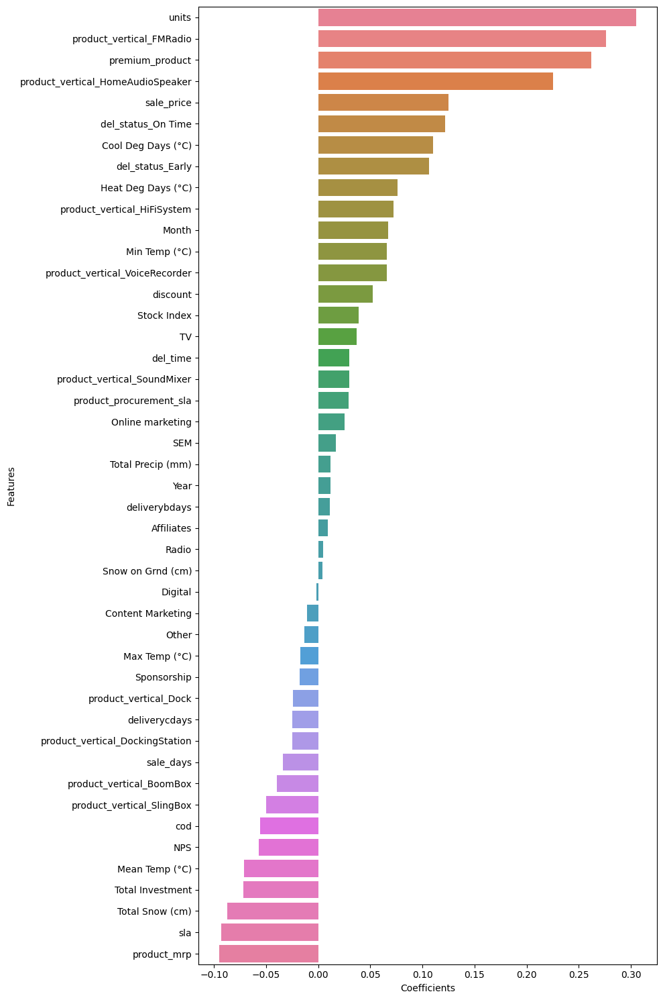

In [ ]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_mul_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

### Model 3: Koyck Model

In [ ]:
# Copying the datasets for preparing model data

cameraaccessory_model3_df = camera_accessory_df.drop(columns="week")
gamingaccessory_model3_df = gaming_accessory_df.drop(columns="week")
homeaudio_model3_df = home_audio_df.drop(columns="week")

In [ ]:
# Creating a function lag_variables that return a column gmv lag
GMV_Lag = ['gmv']
def lag_variables(df,var,n):
    for i in var:
        loc_index = df.columns.get_loc(i) + 1
        df.insert(loc=loc_index,column= i+'_lag'+str(n),value=df[i].shift(n))
    return df

In [ ]:
# Calling above function

cameraaccessory_model3_df = lag_variables(cameraaccessory_model3_df,GMV_Lag,1)
gamingaccessory_model3_df = lag_variables(gamingaccessory_model3_df,GMV_Lag,1)
homeaudio_model3_df = lag_variables(homeaudio_model3_df,GMV_Lag,1)

In [ ]:
# Imputing the null value with 0

cameraaccessory_model3_df.fillna(value=0, inplace=True)
gamingaccessory_model3_df.fillna(value=0, inplace=True)
homeaudio_model3_df.fillna(value=0, inplace=True)

In [ ]:
print('Any null values in camera accessory: {}'.format(cameraaccessory_model3_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model3_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model3_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


In [ ]:
# Train test split

cameraaccessory_model3_train, cameraaccessory_model3_test = train_test_split(cameraaccessory_model3_df, train_size = 0.7, test_size = 0.3, random_state = 100)
gamingaccessory_model3_train, gamingaccessory_model3_test = train_test_split(gamingaccessory_model3_df, train_size = 0.7, test_size = 0.3, random_state = 100)
homeaudio_model3_train, homeaudio_model3_test = train_test_split(homeaudio_model3_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [ ]:
# Separating X and y train sets(Dependent and target variables)

y_cameraaccessory_model3_train = cameraaccessory_model3_train.pop('gmv')
X_cameraaccessory_model3_train = cameraaccessory_model3_train

y_gamingaccessory_model3_train = gamingaccessory_model3_train.pop('gmv')
X_gamingaccessory_model3_train = gamingaccessory_model3_train

y_homeaudio_model3_train = homeaudio_model3_train.pop('gmv')
X_homeaudio_model3_train = homeaudio_model3_train

In [ ]:
# Separating X and y test sets(Dependent and target variables)

y_cameraaccessory_model3_test = cameraaccessory_model3_test.pop('gmv')
X_cameraaccessory_model3_test = cameraaccessory_model3_test

y_gamingaccessory_model3_test = gamingaccessory_model3_test.pop('gmv')
X_gamingaccessory_model3_test = gamingaccessory_model3_test

y_homeaudio_model3_test = homeaudio_model3_test.pop('gmv')
X_homeaudio_model3_test = homeaudio_model3_test

In [ ]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_cameraaccessory_model3_train[X_cameraaccessory_model3_train.columns]=scaler.fit_transform(X_cameraaccessory_model3_train[X_cameraaccessory_model3_train.columns])
# Transform on test data
X_cameraaccessory_model3_test[X_cameraaccessory_model3_test.columns]=scaler.transform(X_cameraaccessory_model3_test[X_cameraaccessory_model3_test.columns])

In [ ]:
X_cameraaccessory_model3_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,gmv_lag1,units,sale_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,premium_product,del_time,cod,product_vertical_CameraAccessory,product_vertical_CameraBag,product_vertical_CameraBattery,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryGrip,product_vertical_CameraEyeCup,product_vertical_CameraFilmRolls,product_vertical_CameraHousing,product_vertical_CameraMicrophone,product_vertical_CameraMount,product_vertical_CameraRemoteControl,product_vertical_CameraStorageMemoryCard,product_vertical_CameraTripod,product_vertical_DSLR,product_vertical_ExtensionTube,product_vertical_Filter,product_vertical_Flash,product_vertical_FlashShoeAdapter,product_vertical_Instant Cameras,product_vertical_Lens,product_vertical_ReflectorUmbrella,product_vertical_Softbox,product_vertical_Strap,product_vertical_Teleconverter,product_vertical_Telescope,del_status_Early,del_status_On Time,pay_date_week,holiday_week,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
count,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000
mean,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000
std,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,0.00000,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460
min,-2.52482,-2.33226,-2.35048,-1.41719,-2.37100,-0.50992,-0.51005,-3.12786,-1.36658,-2.34761,-2.54688,-2.28239,-2.99075,-2.28778,-2.54902,-2.01621,-1.81638,-0.68055,-1.36943,-0.39223,-0.50568,-1.54342,-2.38841,0.00000,-1.72219,0.00000,-0.94387,-1.77053,-1.22647,-0.24618,0.00000,-1.91543,-0.17150,-0.38633,-2.46887,0.00000,-2.02233,-1.84164,-1.55226,-0.81650,-0.81650,-0.91766,-1.59021,-1.46334,-1.48984,-0.65359,-1.13545,-0.75728,-2.09003,-2.20173,-0.72065,-0.42708,-0.42485,-1.19279,-1.80674,-2.01255,-2.29706,-2.09707,-1.01609,-0.66918,-0.72130,-0.35691,-0.73458,-0.30085,-0.31934
25%,-0.37869,-0.58480,-0.86558,-0.87117,-0.71704,-0.50992,-0.51005,-0.38668,-0.66487,-0.35822,0.10498,-0.53195,-0.58954,-0.33644,-0.41374,-0.49261,-0.82305,-0.68055,-0.54444,-0.39223,-0.50568,-0.60000,-0.53617,0.00000,-0.40410,0.00000,-0.94387,-0.37773,-0.91662,-0.24618,0.00000,-0.41248,-0.17150,-0.38633,-0.64218,0.00000,-0.58440,-0.36103,-0.52636,-0.81650,-0.81650,-0.91766,-0.90478,-0.69615,-0.80312,-0.49720,-0.82446,-0.71426,-0.01566,0.03459,-0.48998,-0.42708,-0.42485,-0.54496,-1.03018,-0.71284,

In [ ]:
cameraaccessory_model3 = LinearRegression().fit(X_cameraaccessory_model3_train, y_cameraaccessory_model3_train)
y_cameraaccessory_model3_test_pred = cameraaccessory_model3.predict(X_cameraaccessory_model3_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_model3_test, y_cameraaccessory_model3_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model3_test, y_cameraaccessory_model3_test_pred)))

R2 Score: 0.9215713532597944
Mean Squared Error: 303133171727.3555


In [ ]:
# Min and Max of GMV
Ymax = camera_accessory_df.gmv.max()
Ymin = camera_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  12709353.76009569
Minimumn Y :  299.0


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model3_test, y_cameraaccessory_model3_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.043321499526292724

In [ ]:
#Building Linear Regression model for cameraaccessory using K-fold Cross Validation

In [ ]:
cameraaccessory_model3_cvdf = cameraaccessory_model3_df.copy()

y_cameraaccessory_model3_cvdf = cameraaccessory_model3_cvdf.pop('gmv')
X_cameraaccessory_model3_cvdf = cameraaccessory_model3_cvdf

In [ ]:
cameraaccessory_model3_cv = LinearRegression().fit(X_cameraaccessory_model3_cvdf, y_cameraaccessory_model3_cvdf)
cameraaccessory_predictions_cv = cross_val_predict(cameraaccessory_model3_cv, X_cameraaccessory_model3_cvdf, y_cameraaccessory_model3_cvdf, cv=11)
accuracy = metrics.r2_score(y_cameraaccessory_model3_cvdf, cameraaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model3_cvdf, cameraaccessory_predictions_cv)))

Cross-Predicted Accuracy: 0.9194150494209361
Mean Squared Error: 318540332281.2331


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model3_cvdf, cameraaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.04440879237581958

In [ ]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
cameraaccessory_lr_model_parameters = list(cameraaccessory_model3.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_model3.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_model3_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))

In [ ]:
# Creating a dataframe of the parameters and coefficients

cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
#cameraaccessory_lr_coef_df

In [ ]:
#Total Effect of KPIs from Koyck model

In [ ]:
# Calculating the coefficient of lag variable

cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Features'] == 'gmv_lag1'].Coefficients

,Coefficients
1,-62452.052


In [ ]:
cameraaccessory_lr_coef_df['Total Effect'] = cameraaccessory_lr_coef_df['Coefficients']/(1-(-62452.052))
#cameraaccessory_lr_coef_df

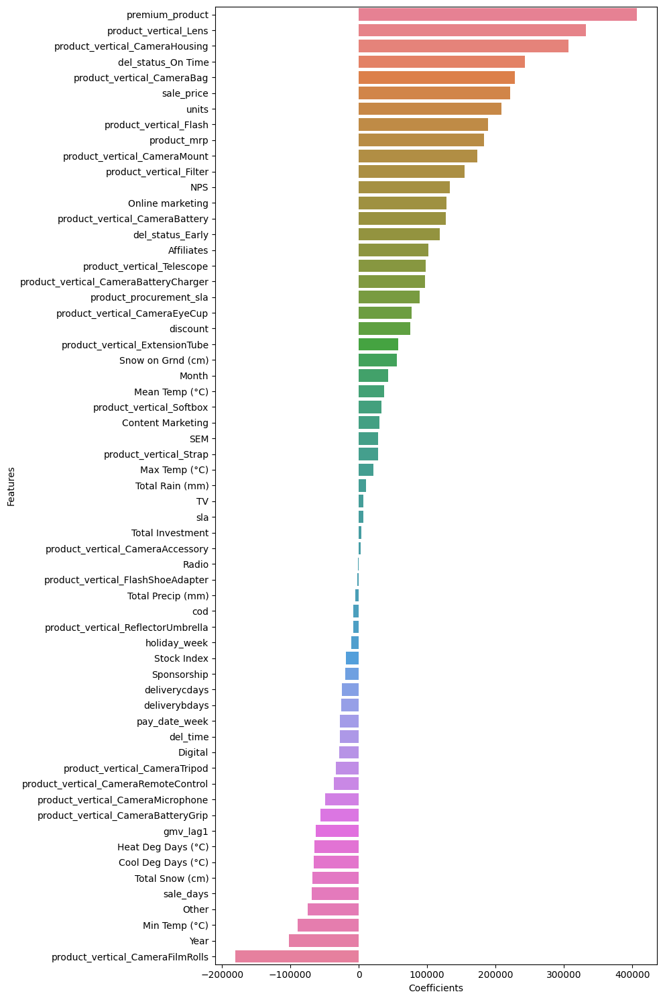

In [ ]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

In [ ]:
#Gaming accessory

In [ ]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_gamingaccessory_model3_train[X_gamingaccessory_model3_train.columns]=scaler.fit_transform(X_gamingaccessory_model3_train[X_gamingaccessory_model3_train.columns])
# Transform on test data
X_gamingaccessory_model3_test[X_gamingaccessory_model3_test.columns]=scaler.transform(X_gamingaccessory_model3_test[X_gamingaccessory_model3_test.columns])

In [ ]:
X_gamingaccessory_model3_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,gmv_lag1,units,sale_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,premium_product,del_time,cod,product_vertical_GameControlMount,product_vertical_GamePad,product_vertical_GameValueCards,product_vertical_GamingAccessoryKit,product_vertical_GamingAdapter,product_vertical_GamingChargingStation,product_vertical_GamingConsole,product_vertical_GamingHeadset,product_vertical_GamingKeyboard,product_vertical_GamingMemoryCard,product_vertical_GamingMouse,product_vertical_GamingMousePad,product_vertical_GamingSpeaker,product_vertical_HandheldGamingConsole,product_vertical_JoystickGamingWheel,product_vertical_PhysicalGame,del_status_Early,del_status_On Time,pay_date_week,holiday_week,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
count,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000,35.00000
mean,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000,-0.00000,0.00000,0.00000
std,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,1.01460,1.01460,0.00000,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,0.00000,1.01460,0.00000,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460,1.01460
min,-2.28401,-1.91774,-2.25937,-1.49667,-1.20151,-0.64339,-0.64366,-2.54570,-1.74806,-2.57417,-2.08536,-1.73165,-0.17150,-2.57962,0.00000,-2.61248,-2.21876,-0.56972,0.00000,-1.50096,-1.53305,-0.84913,-1.06569,-1.56484,-0.69882,0.00000,-0.97066,0.00000,-1.38831,-1.19248,-0.91766,-0.67700,-0.91766,-1.81828,-1.40587,-1.35338,-0.62119,-1.16025,-0.70408,-1.92880,-2.02096,-0.70054,-0.45135,-0.41311,-1.17090,-2.02826,-2.07185,-2.61674,-2.36746,-0.90625,-0.74768,-0.80402,-0.24605,-0.84746,-0.22888,-0.36591
25%,-0.44743,-0.55685,-0.69079,-0.59617,-0.42545,-0.64339,-0.64366,-0.52150,-0.66492,-0.41610,-0.95762,-0.46113,-0.17150,-0.41357,0.00000,-0.43062,-0.48384,-0.56972,0.00000,-0.89588,-0.47514,-0.61091,-0.34729,-0.66780,-0.66357,0.00000,-0.66853,0.00000,-0.83552,-0.62879,-0.91766,-0.67700,-0.91766,-0.74742,-0.61882,-0.92066,-0.48641,-0.84134,-0.66541,-0.42465,-0.35996,-0.45449,-0.45135,-0.41311,-0.58157,-0.89307,-0.77291,-0.76741,-0.57613,-0.87611,-0.74768,-0.71022,-0.24605,-0.74019,-0.22888,-0.36591
50%,-0.02228,-0.00130,-0.04375,0.02223,-0.31736,-0.64207,-0.64218,-0.01834,0.02103,0.04014,0.35627,0.09463,-0.17150,-0.07103,0.00000,0.09550,-0.06897,-0.56972,0.00000,0.07334,-0.20421,-0.39734,-0.20270,-0.11961,-0.34639,0.00000,-0.51746,0.00000,-0.12517,-0.13002,-0.91766,-0.67700,-0.91766,0.01748,-0.16109,-0.01716,-0.37363,-0.25544,-0.24387,0.18004,0.30376,-0.35808,-0.45135,-0.41311,-0.49260,0.49292,0.13070,0.02516,0.07254,-0.32469,-0.74768,-0.44823,-0.24605,-0.39693,-0.22888,-0.36591
75%,0.36317,0.30473,0.76658,0.24024,-0.06071,1.38042,1.3784

In [ ]:
gamingaccessory_model3 = LinearRegression().fit(X_gamingaccessory_model3_train , y_gamingaccessory_model3_train)
y_gamingaccessory_model3_test_pred = gamingaccessory_model3.predict(X_gamingaccessory_model3_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_model3_test, y_gamingaccessory_model3_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model3_test, y_gamingaccessory_model3_test_pred)))

R2 Score: 0.8911850697383602
Mean Squared Error: 144945490283.76215


In [ ]:
# Min and Max of GMV
Ymax = gaming_accessory_df.gmv.max()
Ymin = gaming_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  7209730.620678344
Minimumn Y :  598.0


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model3_test, y_gamingaccessory_model3_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.05281038563629511

In [ ]:
#Building Linear Regression model for gamingaccessory using K-fold Cross Validation

gamingaccessory_model3_cvdf = gamingaccessory_model3_df.copy()

y_gamingaccessory_model3_cvdf = gamingaccessory_model3_cvdf.pop('gmv')
X_gamingaccessory_model3_cvdf = gamingaccessory_model3_cvdf

In [ ]:
gamingaccessory_model3_cv = LinearRegression().fit(X_gamingaccessory_model3_cvdf, y_gamingaccessory_model3_cvdf)
gamingaccessory_predictions_cv = cross_val_predict(gamingaccessory_model3_cv, X_gamingaccessory_model3_cvdf, y_gamingaccessory_model3_cvdf, cv=11)
accuracy = metrics.r2_score(y_gamingaccessory_model3_cvdf, gamingaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model3_cvdf, gamingaccessory_predictions_cv)))

Cross-Predicted Accuracy: -1.4415924394998174
Mean Squared Error: 4089745628996.3696


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model3_cvdf, gamingaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.28052084180750914

In [ ]:
#Determining Feature Importance for gamingaccessory from model without cv

#Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
gamingaccessory_lr_model_parameters = list(gamingaccessory_model3.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_model3.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_model3_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))

In [ ]:
# Creating a dataframe of the parameters and coefficients

gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
#gamingaccessory_lr_coef_df

In [ ]:
#Total Effect of KPIs from Koyck model

# Calculating the coefficient of lag variable
gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Features'] == 'gmv_lag1'].Coefficients


,Coefficients
1,-724.832


In [ ]:
gamingaccessory_lr_coef_df['Total Effect'] = gamingaccessory_lr_coef_df['Coefficients']/(1-(-724.832))


In [ ]:
gamingaccessory_lr_coef_df

,Features,Coefficients,Total Effect
20,product_vertical_GamingHeadset,338250.836,466.018
10,premium_product,272960.115,376.065
45,NPS,246173.885,339.161
2,units,229682.213,316.440
36,TV,140187.673,193.141
25,product_vertical_GamingSpeaker,136201.021,187.648
24,product_vertical_GamingMousePad,129418.836,178.304
22,product_vertical_GamingMemoryCard,127364.514,175.474
49,Mean Temp (°C),124916.296,172.101
3,sale_price,118111.200,162.725


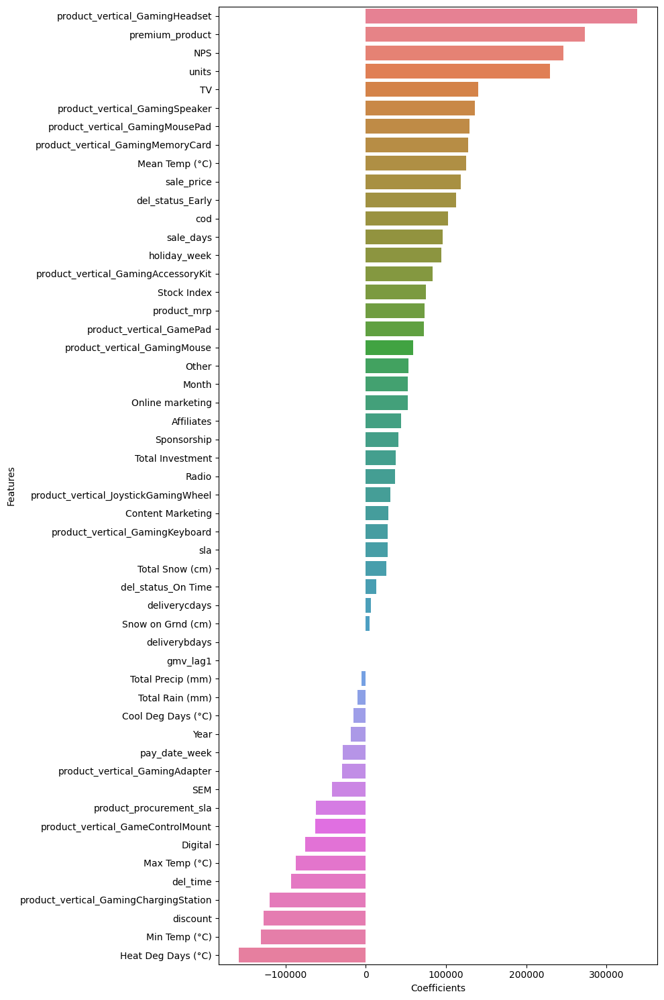

In [ ]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

In [ ]:
#HomeAudio

In [ ]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_homeaudio_model3_train[X_homeaudio_model3_train.columns]=scaler.fit_transform(X_homeaudio_model3_train[X_homeaudio_model3_train.columns])
# Transform on test data
X_homeaudio_model3_test[X_homeaudio_model3_test.columns]=scaler.transform(X_homeaudio_model3_test[X_homeaudio_model3_test.columns])

In [ ]:
X_homeaudio_model3_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,gmv_lag1,units,sale_price,discount,product_mrp,deliverybdays,deliverycdays,sla,product_procurement_sla,premium_product,del_time,cod,product_vertical_AudioMP3Player,product_vertical_BoomBox,product_vertical_Dock,product_vertical_DockingStation,product_vertical_FMRadio,product_vertical_HiFiSystem,product_vertical_HomeAudioSpeaker,product_vertical_HomeTheatre,product_vertical_KaraokePlayer,product_vertical_SlingBox,product_vertical_SoundMixer,product_vertical_VoiceRecorder,del_status_Early,del_status_On Time,pay_date_week,holiday_week,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other,NPS,Stock Index,Max Temp (°C),Min Temp (°C),Mean Temp (°C),Heat Deg Days (°C),Cool Deg Days (°C),Total Rain (mm),Total Snow (cm),Total Precip (mm),Snow on Grnd (cm),sale_days
count,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000,33.00000
mean,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,0.00000,-0.00000,-0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,-0.00000,-0.00000,0.00000,-0.00000,-0.00000,-0.00000,0.00000,0.00000,-0.00000
std,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,0.00000,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,0.00000,0.00000,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550,1.01550
min,-1.21177,-3.08179,-1.85898,-4.12561,-1.57692,-0.60878,-0.60932,-1.72232,-3.91560,-2.56222,-2.24188,-2.34815,0.00000,-2.10624,-2.03124,-1.09251,-2.89303,-2.37420,-2.61892,0.00000,0.00000,-0.24019,-0.59830,-2.20990,-1.85063,-1.88880,-0.75593,-0.80623,-0.97014,-1.57108,-1.58079,-1.57580,-0.63791,-1.19488,-0.74846,-2.25130,-2.38325,-0.73047,-0.44228,-0.43995,-1.30015,-1.73351,-1.95646,-2.25260,-1.99283,-1.06599,-0.63977,-0.77433,-0.45838,-0.80150,-0.31632,-0.28919
25%,-0.57506,-0.52839,-0.53696,-0.37883,-0.65571,-0.60878,-0.60932,-0.65433,-0.62745,-0.62629,-0.74143,-0.45180,0.00000,-0.64062,-0.83717,-0.57747,-0.35020,-0.54246,-0.62384,0.00000,0.00000,-0.24019,-0.59830,-0.67950,-0.96380,-0.78573,-0.75593,-0.80623,-0.97014,-0.74813,-0.71811,-0.87424,-0.46609,-0.86548,-0.70166,-0.04950,-0.01258,-0.45870,-0.44228,-0.43995,-0.57131,-1.27754,-0.87784,-0.70163,-0.95842,-1.01071,-0.63977,-0.68983,-0.45838,-0.70314,-0.31632,-0.28919
50%,-0.19527,0.13151,-0.13034,-0.04527,-0.16035,-0.60790,-0.60832,-0.05309,0.12448,-0.19549,0.45410,0.18031,0.00000,-0.32973,0.24835,-0.23411,-0.06077,0.04037,-0.07267,0.00000,0.00000,-0.24019,-0.59830,-0.04738,0.31874,0.00413,-0.75593,-0.80623,-0.97014,0.07481,-0.21639,0.06229,-0.34423,-0.26030,-0.24222,0.07345,0.17784,-0.35220,-0.44228,-0.43995,-0.46127,0.47240,0.20078,0.12925,-0.02852,-0.14258,-0.63977,-0.44236,-0.45838,-0.34010,-0.31632,-0.28919
75%,0.23776,0.48673,0.28599,0.44612,0.56063,0.60044,0.60566,0.53838,0.63900,0.44272,0.64857,0.47310,0.00000,0.95824,0.68256,0.62429,0.69037,0.62320,0.46586,0.00000,0.00000,-0.24019,0.44085,0.45166,0.79303,0.48076,1.32288,1.24035,1.03078,0.89776,0.66171,0.70299,-0.00547,0.96242,0.20871,0.92165,0.83858,-0.20400,-0.44228,-0.43995,0.46448,0.81746,0.76578,0.79395,1.01491,0.97592,0.55975,0.22157,-0.45838,0.19641,-0.31632,-0.28919
max,4.97700,1.

In [ ]:
homeaudio_model3 = LinearRegression().fit(X_homeaudio_model3_train, y_homeaudio_model3_train)
y_homeaudio_model3_test_pred = homeaudio_model3.predict(X_homeaudio_model3_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_model3_test, y_homeaudio_model3_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model3_test, y_homeaudio_model3_test_pred)))

R2 Score: 0.9700448921412557
Mean Squared Error: 475220419609.85815


In [ ]:
# Min and Max of GMV
Ymax = home_audio_df.gmv.max()
Ymin = home_audio_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  19173248.0
Minimumn Y :  2599.0


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model3_test, y_homeaudio_model3_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.03595925877364444

In [ ]:
#Building Linear Regression model for homeaudio using K-fold Cross Validation

homeaudio_model3_cvdf = homeaudio_model3_df.copy()

y_homeaudio_model3_cvdf = homeaudio_model3_cvdf.pop('gmv')
X_homeaudio_model3_cvdf = homeaudio_model3_cvdf

In [ ]:
homeaudio_model3_cv = LinearRegression().fit(X_homeaudio_model3_cvdf, y_homeaudio_model3_cvdf)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model3_cv, X_homeaudio_model3_cvdf, y_homeaudio_model3_cvdf, cv=11)
accuracy = metrics.r2_score(y_homeaudio_model3_cvdf, homeaudio_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model3_cvdf, homeaudio_predictions_cv)))

Cross-Predicted Accuracy: 0.7448072335264835
Mean Squared Error: 1679771913137.0286


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model1_cvdf, homeaudio_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.06760648271622842

In [ ]:
#Determining Feature Importance for homeaudio with model without cv

In [ ]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
homeaudio_lr_model_parameters = list(homeaudio_model3.coef_)
homeaudio_lr_model_parameters.insert(0, homeaudio_model3.intercept_)
homeaudio_lr_model_parameters = [round(x, 3) for x in homeaudio_lr_model_parameters]
cols = X_homeaudio_model3_test.columns
cols = cols.insert(0, "constant")
homeaudio_lr_coef = list(zip(cols, homeaudio_lr_model_parameters))

In [ ]:
homeaudio_lr_coef_df = pd.DataFrame(homeaudio_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_lr_coef_df = homeaudio_lr_coef_df.rename(columns=col_rename)
homeaudio_lr_coef_df = homeaudio_lr_coef_df.iloc[1:,:]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Coefficients']!=0.0]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
homeaudio_lr_coef_df

,Features,Coefficients
19,product_vertical_HomeAudioSpeaker,387382.508
2,units,353943.835
10,premium_product,201889.210
5,product_mrp,189998.480
25,del_status_Early,178939.987
17,product_vertical_FMRadio,159113.203
4,discount,141691.955
12,cod,135140.339
24,product_vertical_VoiceRecorder,122875.575
44,Min Temp (°C),107951.601


In [ ]:
#Determining Total Effect of KPIs from Koyck model

In [ ]:
# Calculating the coefficient of lag variable

homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Features'] == 'gmv_lag1'].Coefficients

,Coefficients
1,85477.400


In [ ]:
homeaudio_lr_coef_df['Total Effect'] = homeaudio_lr_coef_df['Coefficients']/(1-(85477.40))
homeaudio_lr_coef_df

,Features,Coefficients,Total Effect
19,product_vertical_HomeAudioSpeaker,387382.508,-4.532
2,units,353943.835,-4.141
10,premium_product,201889.210,-2.362
5,product_mrp,189998.480,-2.223
25,del_status_Early,178939.987,-2.093
17,product_vertical_FMRadio,159113.203,-1.861
4,discount,141691.955,-1.658
12,cod,135140.339,-1.581
24,product_vertical_VoiceRecorder,122875.575,-1.438
44,Min Temp (°C),107951.601,-1.263


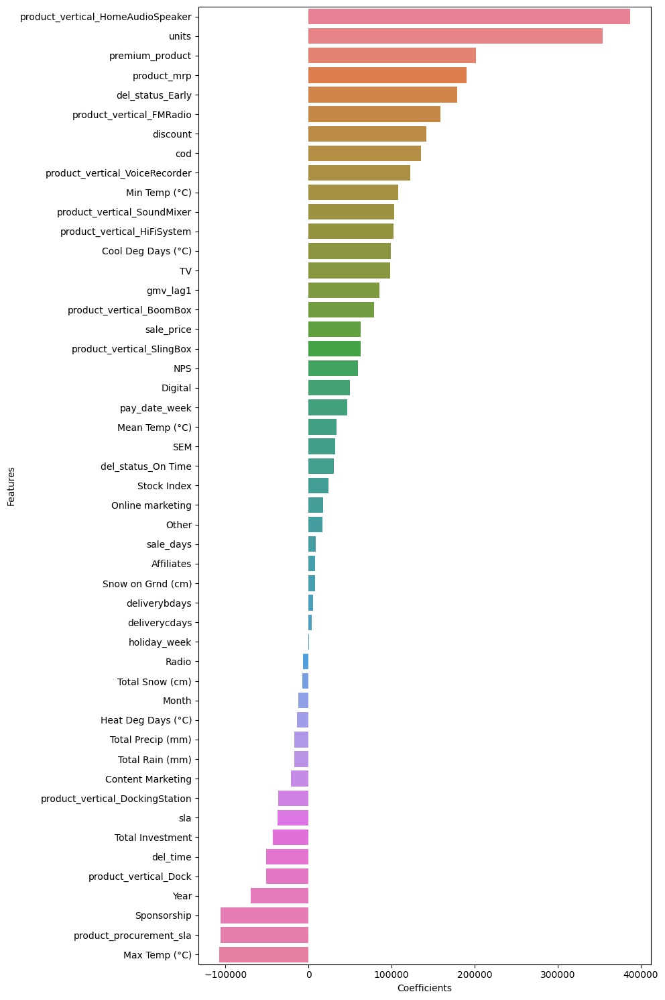

In [ ]:
# Plotting the feature importance

plt.figure(figsize=(10, 15), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

### Model 4: Distributive Lag Model (Additive)

In [ ]:
# Copying the datasets for preparing model data

cameraaccessory_model4_df = camera_accessory_df.drop(columns="week")
gamingaccessory_model4_df = gaming_accessory_df.drop(columns="week")
homeaudio_model4_df = home_audio_df.drop(columns="week")

In [ ]:
print('Any null values in camera accessory: {}'.format(cameraaccessory_model4_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model4_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model4_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


In [ ]:
#Creating new lag(Lag of 3 weeks) variables for the dependent variable (GMV) as well as independent variables

cameraaccessory_model4_df_columns = cameraaccessory_model4_df.columns
gamingaccessory_model4_df_columns = gamingaccessory_model4_df.columns
homeaudio_model4_df_columns = homeaudio_model4_df.columns

In [ ]:
# Caling the user defined function lag_variables

cameraaccessory_model4_df = lag_variables(cameraaccessory_model4_df,cameraaccessory_model4_df_columns,3)
gamingaccessory_model4_df = lag_variables(gamingaccessory_model4_df,gamingaccessory_model4_df_columns,3)
homeaudio_model4_df = lag_variables(homeaudio_model4_df,homeaudio_model4_df_columns,3)

In [ ]:
cameraaccessory_model4_df.head()

,gmv,gmv_lag3,units,units_lag3,sale_price,sale_price_lag3,discount,discount_lag3,product_mrp,product_mrp_lag3,deliverybdays,deliverybdays_lag3,deliverycdays,deliverycdays_lag3,sla,sla_lag3,product_procurement_sla,product_procurement_sla_lag3,premium_product,premium_product_lag3,del_time,del_time_lag3,cod,cod_lag3,product_vertical_CameraAccessory,product_vertical_CameraAccessory_lag3,product_vertical_CameraBag,product_vertical_CameraBag_lag3,product_vertical_CameraBattery,product_vertical_CameraBattery_lag3,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryCharger_lag3,product_vertical_CameraBatteryGrip,product_vertical_CameraBatteryGrip_lag3,product_vertical_CameraEyeCup,product_vertical_CameraEyeCup_lag3,product_vertical_CameraFilmRolls,product_vertical_CameraFilmRolls_lag3,product_vertical_CameraHousing,product_vertical_CameraHousing_lag3,product_vertical_CameraMicrophone,product_vertical_CameraMicrophone_lag3,product_vertical_CameraMount,product_vertical_CameraMount_lag3,product_vertical_CameraRemoteControl,product_vertical_CameraRemoteControl_lag3,product_vertical_CameraStorageMemoryCard,product_vertical_CameraStorageMemoryCard_lag3,product_vertical_CameraTripod,product_vertical_CameraTripod_lag3,product_vertical_DSLR,product_vertical_DSLR_lag3,product_vertical_ExtensionTube,product_vertical_ExtensionTube_lag3,product_vertical_Filter,product_vertical_Filter_lag3,product_vertical_Flash,product_vertical_Flash_lag3,product_vertical_FlashShoeAdapter,product_vertical_FlashShoeAdapter_lag3,product_vertical_Instant Cameras,product_vertical_Instant Cameras_lag3,product_vertical_Lens,product_vertical_Lens_lag3,product_vertical_ReflectorUmbrella,product_vertical_ReflectorUmbrella_lag3,product_vertical_Softbox,product_vertical_Softbox_lag3,product_vertical_Strap,product_vertical_Strap_lag3,product_vertical_Teleconverter,product_vertical_Teleconverter_lag3,product_vertical_Telescope,product_vertical_Telescope_lag3,del_status_Early,del_status_Early_lag3,del_status_On Time,del_status_On Time_lag3,pay_date_week,pay_date_week_lag3,holiday_week,holiday_week_lag3,Year,Year_lag3,Month,Month_lag3,Total Investment,Total Investment_lag3,TV,TV_lag3,Digital,Digital_lag3,Sponsorship,Sponsorship_lag3,Content Marketing,Content Marketing_lag3,Online marketing,Online marketing_lag3,Affiliates,Affiliates_lag3,SEM,SEM_lag3,Radio,Radio_lag3,Other,Other_lag3,NPS,NPS_lag3,Stock Index,Stock Index_lag3,Max Temp (°C),Max Temp (°C)_lag3,Min Temp (°C),Min Temp (°C)_lag3,Mean Temp (°C),Mean Temp (°C)_lag3,Heat Deg Days (°C),Heat Deg Days (°C)_lag3,Cool Deg Days (°C),Cool Deg Days (°C)_lag3,Total Rain (mm),Total Rain (mm)_lag3,Total Snow (cm),Total Snow (cm)_lag3,Total Precip (mm),Total Precip (mm)_lag3,Snow on Grnd (cm),Snow on Grnd (cm)_lag3,sale_days,sale_days_lag3
25,3733245.000,NaN,2877,NaN,1344.502,NaN,45.169,NaN,2439.379,NaN,0.000,NaN,0.000,NaN,6.946,NaN,2.779,NaN,341,NaN,11621,NaN,1870,NaN,42,NaN,330,NaN,651,NaN,221,NaN,11,NaN,0,NaN,0,NaN,0,NaN,0,NaN,4,NaN,141,NaN,0,NaN,432,NaN,0,NaN,0,NaN,219,NaN,26,NaN,0,NaN,0,NaN,481,NaN,0,NaN,0,NaN,13,NaN,0,NaN,16,NaN,2332,NaN,170,NaN,0,NaN,1,NaN,2015.000,NaN,7.000,NaN,4.265,NaN,0.054,NaN,0.633,NaN,1.854,NaN,0.000,NaN,0.332,NaN,0.137,NaN,1.256,NaN,0.000,NaN,0.000,NaN,54.600,NaN,1177.000,NaN,28.000,NaN,12.500,NaN,20.100,NaN,0.283,NaN,2.383,NaN,4.417,NaN,0.000,NaN,4.417,NaN,0.000,NaN,0.000,NaN
26,4219985.000,NaN,3076,NaN,1409.128,NaN,45.564,NaN,2492.681,NaN,0.000,NaN,0.000,NaN,6.359,NaN,2.809,NaN,389,NaN,10632,NaN,1989,NaN,30,NaN,349,NaN,706,NaN,221,NaN,6,NaN,0,NaN,0,NaN,0,NaN,0,NaN,11,NaN,140,NaN,0,NaN,492,NaN,0,NaN,0,NaN,185,NaN,27,NaN,0,NaN,0,NaN,519,NaN,0,NaN,0,NaN,24,NaN,0,NaN,22,NaN,2396,NaN,221,NaN,1,NaN,1,NaN,2015.000,NaN,7.000,NaN,4.265,NaN,0.054,NaN,0.633,NaN,1.854,NaN,0.000,NaN,0.332,NaN,0.137,NaN,1.256,NaN,0.000,NaN,0.000,NaN,54.600,NaN,1177.000,NaN,33.000,NaN,11.000,NaN,23.183,NaN,0.000,NaN,5.183,NaN,1.400,NaN,0.000,NaN,1.400,NaN,0.000,NaN,2.000,NaN
27,4179029.000,NaN,3050,NaN,1419.127,NaN

In [ ]:
#Creating new lag(Lag of 2 weeks) variables for the dependent variable (GMV) as well as independent variables

cameraaccessory_model4_df = lag_variables(cameraaccessory_model4_df,cameraaccessory_model4_df_columns,2)
gamingaccessory_model4_df = lag_variables(gamingaccessory_model4_df,gamingaccessory_model4_df_columns,2)
homeaudio_model4_df = lag_variables(homeaudio_model4_df,homeaudio_model4_df_columns,2)

In [ ]:
cameraaccessory_model4_df.head()

,gmv,gmv_lag2,gmv_lag3,units,units_lag2,units_lag3,sale_price,sale_price_lag2,sale_price_lag3,discount,discount_lag2,discount_lag3,product_mrp,product_mrp_lag2,product_mrp_lag3,deliverybdays,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag2,product_procurement_sla_lag3,premium_product,premium_product_lag2,premium_product_lag3,del_time,del_time_lag2,del_time_lag3,cod,cod_lag2,cod_lag3,product_vertical_CameraAccessory,product_vertical_CameraAccessory_lag2,product_vertical_CameraAccessory_lag3,product_vertical_CameraBag,product_vertical_CameraBag_lag2,product_vertical_CameraBag_lag3,product_vertical_CameraBattery,product_vertical_CameraBattery_lag2,product_vertical_CameraBattery_lag3,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryCharger_lag2,product_vertical_CameraBatteryCharger_lag3,product_vertical_CameraBatteryGrip,product_vertical_CameraBatteryGrip_lag2,product_vertical_CameraBatteryGrip_lag3,product_vertical_CameraEyeCup,product_vertical_CameraEyeCup_lag2,product_vertical_CameraEyeCup_lag3,product_vertical_CameraFilmRolls,product_vertical_CameraFilmRolls_lag2,product_vertical_CameraFilmRolls_lag3,product_vertical_CameraHousing,product_vertical_CameraHousing_lag2,product_vertical_CameraHousing_lag3,product_vertical_CameraMicrophone,product_vertical_CameraMicrophone_lag2,product_vertical_CameraMicrophone_lag3,product_vertical_CameraMount,product_vertical_CameraMount_lag2,product_vertical_CameraMount_lag3,product_vertical_CameraRemoteControl,product_vertical_CameraRemoteControl_lag2,product_vertical_CameraRemoteControl_lag3,product_vertical_CameraStorageMemoryCard,product_vertical_CameraStorageMemoryCard_lag2,product_vertical_CameraStorageMemoryCard_lag3,product_vertical_CameraTripod,product_vertical_CameraTripod_lag2,product_vertical_CameraTripod_lag3,product_vertical_DSLR,product_vertical_DSLR_lag2,product_vertical_DSLR_lag3,product_vertical_ExtensionTube,product_vertical_ExtensionTube_lag2,product_vertical_ExtensionTube_lag3,product_vertical_Filter,product_vertical_Filter_lag2,product_vertical_Filter_lag3,product_vertical_Flash,product_vertical_Flash_lag2,product_vertical_Flash_lag3,product_vertical_FlashShoeAdapter,product_vertical_FlashShoeAdapter_lag2,product_vertical_FlashShoeAdapter_lag3,product_vertical_Instant Cameras,product_vertical_Instant Cameras_lag2,product_vertical_Instant Cameras_lag3,product_vertical_Lens,product_vertical_Lens_lag2,product_vertical_Lens_lag3,product_vertical_ReflectorUmbrella,product_vertical_ReflectorUmbrella_lag2,product_vertical_ReflectorUmbrella_lag3,product_vertical_Softbox,product_vertical_Softbox_lag2,product_vertical_Softbox_lag3,product_vertical_Strap,product_vertical_Strap_lag2,product_vertical_Strap_lag3,product_vertical_Teleconverter,product_vertical_Teleconverter_lag2,product_vertical_Teleconverter_lag3,product_vertical_Telescope,product_vertical_Telescope_lag2,product_vertical_Telescope_lag3,del_status_Early,del_status_Early_lag2,del_status_Early_lag3,del_status_On Time,del_status_On Time_lag2,del_status_On Time_lag3,pay_date_week,pay_date_week_lag2,pay_date_week_lag3,holiday_week,holiday_week_lag2,holiday_week_lag3,Year,Year_lag2,Year_lag3,Month,Month_lag2,Month_lag3,Total Investment,Total Investment_lag2,Total Investment_lag3,TV,TV_lag2,TV_lag3,Digital,Digital_lag2,Digital_lag3,Sponsorship,Sponsorship_lag2,Sponsorship_lag3,Content Marketing,Content Marketing_lag2,Content Marketing_lag3,Online marketing,Online marketing_lag2,Online marketing_lag3,Affiliates,Affiliates_lag2,Affiliates_lag3,SEM,SEM_lag2,SEM_lag3,Radio,Radio_lag2,Radio_lag3,Other,Other_lag2,Other_lag3,NPS,NPS_lag2,NPS_lag3,Stock Index,Stock Index_lag2,Stock Index_lag3,Max Temp (°C),Max Temp (°C)_lag2,Max Temp (°C)_lag3,Min Temp (°C),Min Temp (°C)_lag2,Min Temp (°C)_lag3,Mean Temp (°C),Mean Temp (°C)_lag2,Mean Temp (°C)_lag3,Heat Deg Days (°C),Heat Deg Days (°C)_lag2,Heat Deg Days

In [ ]:
#Creating new lag(Lag of 1 week) variables for the dependent variable (GMV) as well as independent variables

cameraaccessory_model4_df = lag_variables(cameraaccessory_model4_df,cameraaccessory_model4_df_columns,1)
gamingaccessory_model4_df = lag_variables(gamingaccessory_model4_df,gamingaccessory_model4_df_columns,1)
homeaudio_model4_df = lag_variables(homeaudio_model4_df,homeaudio_model4_df_columns,1)

In [ ]:
cameraaccessory_model4_df.head()

,gmv,gmv_lag1,gmv_lag2,gmv_lag3,units,units_lag1,units_lag2,units_lag3,sale_price,sale_price_lag1,sale_price_lag2,sale_price_lag3,discount,discount_lag1,discount_lag2,discount_lag3,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,premium_product,premium_product_lag1,premium_product_lag2,premium_product_lag3,del_time,del_time_lag1,del_time_lag2,del_time_lag3,cod,cod_lag1,cod_lag2,cod_lag3,product_vertical_CameraAccessory,product_vertical_CameraAccessory_lag1,product_vertical_CameraAccessory_lag2,product_vertical_CameraAccessory_lag3,product_vertical_CameraBag,product_vertical_CameraBag_lag1,product_vertical_CameraBag_lag2,product_vertical_CameraBag_lag3,product_vertical_CameraBattery,product_vertical_CameraBattery_lag1,product_vertical_CameraBattery_lag2,product_vertical_CameraBattery_lag3,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryCharger_lag1,product_vertical_CameraBatteryCharger_lag2,product_vertical_CameraBatteryCharger_lag3,product_vertical_CameraBatteryGrip,product_vertical_CameraBatteryGrip_lag1,product_vertical_CameraBatteryGrip_lag2,product_vertical_CameraBatteryGrip_lag3,product_vertical_CameraEyeCup,product_vertical_CameraEyeCup_lag1,product_vertical_CameraEyeCup_lag2,product_vertical_CameraEyeCup_lag3,product_vertical_CameraFilmRolls,product_vertical_CameraFilmRolls_lag1,product_vertical_CameraFilmRolls_lag2,product_vertical_CameraFilmRolls_lag3,product_vertical_CameraHousing,product_vertical_CameraHousing_lag1,product_vertical_CameraHousing_lag2,product_vertical_CameraHousing_lag3,product_vertical_CameraMicrophone,product_vertical_CameraMicrophone_lag1,product_vertical_CameraMicrophone_lag2,product_vertical_CameraMicrophone_lag3,product_vertical_CameraMount,product_vertical_CameraMount_lag1,product_vertical_CameraMount_lag2,product_vertical_CameraMount_lag3,product_vertical_CameraRemoteControl,product_vertical_CameraRemoteControl_lag1,product_vertical_CameraRemoteControl_lag2,product_vertical_CameraRemoteControl_lag3,product_vertical_CameraStorageMemoryCard,product_vertical_CameraStorageMemoryCard_lag1,product_vertical_CameraStorageMemoryCard_lag2,product_vertical_CameraStorageMemoryCard_lag3,product_vertical_CameraTripod,product_vertical_CameraTripod_lag1,product_vertical_CameraTripod_lag2,product_vertical_CameraTripod_lag3,product_vertical_DSLR,product_vertical_DSLR_lag1,product_vertical_DSLR_lag2,product_vertical_DSLR_lag3,product_vertical_ExtensionTube,product_vertical_ExtensionTube_lag1,product_vertical_ExtensionTube_lag2,product_vertical_ExtensionTube_lag3,product_vertical_Filter,product_vertical_Filter_lag1,product_vertical_Filter_lag2,product_vertical_Filter_lag3,product_vertical_Flash,product_vertical_Flash_lag1,product_vertical_Flash_lag2,product_vertical_Flash_lag3,product_vertical_FlashShoeAdapter,product_vertical_FlashShoeAdapter_lag1,product_vertical_FlashShoeAdapter_lag2,product_vertical_FlashShoeAdapter_lag3,product_vertical_Instant Cameras,product_vertical_Instant Cameras_lag1,product_vertical_Instant Cameras_lag2,product_vertical_Instant Cameras_lag3,product_vertical_Lens,product_vertical_Lens_lag1,product_vertical_Lens_lag2,product_vertical_Lens_lag3,product_vertical_ReflectorUmbrella,product_vertical_ReflectorUmbrella_lag1,product_vertical_ReflectorUmbrella_lag2,product_vertical_ReflectorUmbrella_lag3,product_vertical_Softbox,product_vertical_Softbox_lag1,product_vertical_Softbox_lag2,product_vertical_Softbox_lag3,product_vertical_Strap,product_vertical_Strap_lag1,product_vertical_Strap_lag2,product_vertical_Strap_lag3,product_vertical_Teleconverter,product_vertical_Teleconverter_lag1,product_vertical_Teleconverter_lag2,product_vertical_Teleconverter_lag3,product_vertical_Telesc

In [ ]:
# Imputing the null values with 0

cameraaccessory_model4_df.fillna(value=0, inplace=True)
gamingaccessory_model4_df.fillna(value=0, inplace=True)
homeaudio_model4_df.fillna(value=0, inplace=True)

In [ ]:
print('Any null values in camera accessory: {}'.format(cameraaccessory_model4_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model4_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model4_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


In [ ]:
# Train test split

cameraaccessory_model4_train, cameraaccessory_model4_test = train_test_split(cameraaccessory_model4_df, train_size = 0.7, test_size = 0.3, random_state = 100)
gamingaccessory_model4_train, gamingaccessory_model4_test = train_test_split(gamingaccessory_model4_df, train_size = 0.7, test_size = 0.3, random_state = 100)
homeaudio_model4_train, homeaudio_model4_test = train_test_split(homeaudio_model4_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [ ]:
# Separating X and y train sets(Dependent and target variables)

y_cameraaccessory_model4_train = cameraaccessory_model4_train.pop('gmv')
X_cameraaccessory_model4_train = cameraaccessory_model4_train

y_gamingaccessory_model4_train = gamingaccessory_model4_train.pop('gmv')
X_gamingaccessory_model4_train = gamingaccessory_model4_train

y_homeaudio_model4_train = homeaudio_model4_train.pop('gmv')
X_homeaudio_model4_train = homeaudio_model4_train

In [ ]:
# Separating X and y test sets(Dependent and target variables)

y_cameraaccessory_model4_test = cameraaccessory_model4_test.pop('gmv')
X_cameraaccessory_model4_test = cameraaccessory_model4_test

y_gamingaccessory_model4_test = gamingaccessory_model4_test.pop('gmv')
X_gamingaccessory_model4_test = gamingaccessory_model4_test

y_homeaudio_model4_test = homeaudio_model4_test.pop('gmv')
X_homeaudio_model4_test = homeaudio_model4_test

In [ ]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_cameraaccessory_model4_train[X_cameraaccessory_model4_train.columns]=scaler.fit_transform(X_cameraaccessory_model4_train[X_cameraaccessory_model4_train.columns])
# Transform on test data
X_cameraaccessory_model4_test[X_cameraaccessory_model4_test.columns]=scaler.transform(X_cameraaccessory_model4_test[X_cameraaccessory_model4_test.columns])

In [ ]:
X_cameraaccessory_model4_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,gmv_lag1,gmv_lag2,gmv_lag3,units,units_lag1,units_lag2,units_lag3,sale_price,sale_price_lag1,sale_price_lag2,sale_price_lag3,discount,discount_lag1,discount_lag2,discount_lag3,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,premium_product,premium_product_lag1,premium_product_lag2,premium_product_lag3,del_time,del_time_lag1,del_time_lag2,del_time_lag3,cod,cod_lag1,cod_lag2,cod_lag3,product_vertical_CameraAccessory,product_vertical_CameraAccessory_lag1,product_vertical_CameraAccessory_lag2,product_vertical_CameraAccessory_lag3,product_vertical_CameraBag,product_vertical_CameraBag_lag1,product_vertical_CameraBag_lag2,product_vertical_CameraBag_lag3,product_vertical_CameraBattery,product_vertical_CameraBattery_lag1,product_vertical_CameraBattery_lag2,product_vertical_CameraBattery_lag3,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryCharger_lag1,product_vertical_CameraBatteryCharger_lag2,product_vertical_CameraBatteryCharger_lag3,product_vertical_CameraBatteryGrip,product_vertical_CameraBatteryGrip_lag1,product_vertical_CameraBatteryGrip_lag2,product_vertical_CameraBatteryGrip_lag3,product_vertical_CameraEyeCup,product_vertical_CameraEyeCup_lag1,product_vertical_CameraEyeCup_lag2,product_vertical_CameraEyeCup_lag3,product_vertical_CameraFilmRolls,product_vertical_CameraFilmRolls_lag1,product_vertical_CameraFilmRolls_lag2,product_vertical_CameraFilmRolls_lag3,product_vertical_CameraHousing,product_vertical_CameraHousing_lag1,product_vertical_CameraHousing_lag2,product_vertical_CameraHousing_lag3,product_vertical_CameraMicrophone,product_vertical_CameraMicrophone_lag1,product_vertical_CameraMicrophone_lag2,product_vertical_CameraMicrophone_lag3,product_vertical_CameraMount,product_vertical_CameraMount_lag1,product_vertical_CameraMount_lag2,product_vertical_CameraMount_lag3,product_vertical_CameraRemoteControl,product_vertical_CameraRemoteControl_lag1,product_vertical_CameraRemoteControl_lag2,product_vertical_CameraRemoteControl_lag3,product_vertical_CameraStorageMemoryCard,product_vertical_CameraStorageMemoryCard_lag1,product_vertical_CameraStorageMemoryCard_lag2,product_vertical_CameraStorageMemoryCard_lag3,product_vertical_CameraTripod,product_vertical_CameraTripod_lag1,product_vertical_CameraTripod_lag2,product_vertical_CameraTripod_lag3,product_vertical_DSLR,product_vertical_DSLR_lag1,product_vertical_DSLR_lag2,product_vertical_DSLR_lag3,product_vertical_ExtensionTube,product_vertical_ExtensionTube_lag1,product_vertical_ExtensionTube_lag2,product_vertical_ExtensionTube_lag3,product_vertical_Filter,product_vertical_Filter_lag1,product_vertical_Filter_lag2,product_vertical_Filter_lag3,product_vertical_Flash,product_vertical_Flash_lag1,product_vertical_Flash_lag2,product_vertical_Flash_lag3,product_vertical_FlashShoeAdapter,product_vertical_FlashShoeAdapter_lag1,product_vertical_FlashShoeAdapter_lag2,product_vertical_FlashShoeAdapter_lag3,product_vertical_Instant Cameras,product_vertical_Instant Cameras_lag1,product_vertical_Instant Cameras_lag2,product_vertical_Instant Cameras_lag3,product_vertical_Lens,product_vertical_Lens_lag1,product_vertical_Lens_lag2,product_vertical_Lens_lag3,product_vertical_ReflectorUmbrella,product_vertical_ReflectorUmbrella_lag1,product_vertical_ReflectorUmbrella_lag2,product_vertical_ReflectorUmbrella_lag3,product_vertical_Softbox,product_vertical_Softbox_lag1,product_vertical_Softbox_lag2,product_vertical_Softbox_lag3,product_vertical_Strap,product_vertical_Strap_lag1,product_vertical_Strap_lag2,product_vertical_Strap_lag3,product_vertical_Teleconverter,product_vertical_Teleconverter_lag1,product_vertical_Teleconverter_lag2,product_vertical_Teleconverter_lag3,product_vertical_Telescope,

In [ ]:
#LR Model for cameraaccessory

In [ ]:
cameraaccessory_model4 = LinearRegression().fit(X_cameraaccessory_model4_train, y_cameraaccessory_model4_train)
y_cameraaccessory_model4_test_pred = cameraaccessory_model4.predict(X_cameraaccessory_model4_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_model4_test, y_cameraaccessory_model4_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model4_test, y_cameraaccessory_model4_test_pred)))

R2 Score: 0.6931590921784647
Mean Squared Error: 1185965351560.2568


In [ ]:
# Min and Max of GMV
Ymax = camera_accessory_df.gmv.max()
Ymin = camera_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  12709353.76009569
Minimumn Y :  299.0


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model4_test, y_cameraaccessory_model4_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.08568854126456493

In [ ]:
#Linear Regression model for cameraaccessory using K-fold Cross Validation

cameraaccessory_model4_cvdf = cameraaccessory_model4_df.copy()

y_cameraaccessory_model4_cvdf = cameraaccessory_model4_cvdf.pop('gmv')
X_cameraaccessory_model4_cvdf = cameraaccessory_model4_cvdf

In [ ]:
cameraaccessory_model4_cv = LinearRegression().fit(X_cameraaccessory_model4_cvdf, y_cameraaccessory_model4_cvdf)
cameraaccessory_predictions_cv = cross_val_predict(cameraaccessory_model4_cv, X_cameraaccessory_model4_cvdf, y_cameraaccessory_model4_cvdf, cv=11)
accuracy = metrics.r2_score(y_cameraaccessory_model4_cvdf, cameraaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model4_cvdf, cameraaccessory_predictions_cv)))

Cross-Predicted Accuracy: 0.6702884534997909
Mean Squared Error: 1303300738220.2437


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model4_cvdf, cameraaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.08982744967935626

In [ ]:
#Determining Feature Importance for cameraaccessory from model without cv

In [ ]:
# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
cameraaccessory_lr_model_parameters = list(cameraaccessory_model4.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_model4.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_model4_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))


In [ ]:
# Creating a dataframe of the parameters and coefficients

cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
#cameraaccessory_lr_coef_df

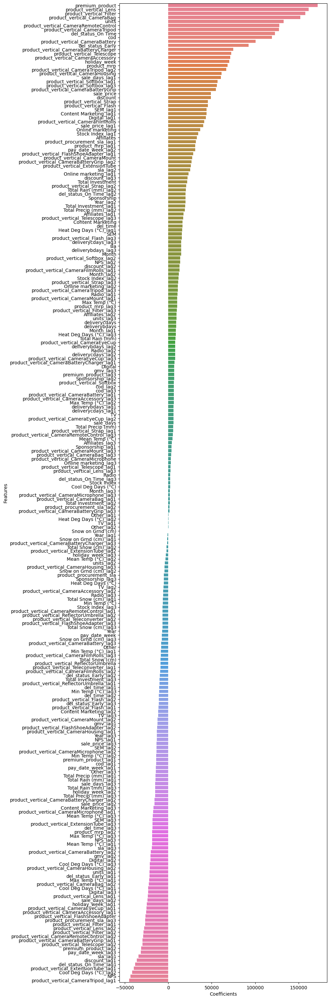

In [ ]:
# Plotting the feature importance

plt.figure(figsize=(10, 30), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

In [ ]:
#gamingaccessory

# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_gamingaccessory_model4_train[X_gamingaccessory_model4_train.columns]=scaler.fit_transform(X_gamingaccessory_model4_train[X_gamingaccessory_model4_train.columns])
# Transform on test data
X_gamingaccessory_model4_test[X_gamingaccessory_model4_test.columns]=scaler.transform(X_gamingaccessory_model4_test[X_gamingaccessory_model4_test.columns])

In [ ]:
X_gamingaccessory_model4_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,gmv_lag1,gmv_lag2,gmv_lag3,units,units_lag1,units_lag2,units_lag3,sale_price,sale_price_lag1,sale_price_lag2,sale_price_lag3,discount,discount_lag1,discount_lag2,discount_lag3,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,premium_product,premium_product_lag1,premium_product_lag2,premium_product_lag3,del_time,del_time_lag1,del_time_lag2,del_time_lag3,cod,cod_lag1,cod_lag2,cod_lag3,product_vertical_GameControlMount,product_vertical_GameControlMount_lag1,product_vertical_GameControlMount_lag2,product_vertical_GameControlMount_lag3,product_vertical_GamePad,product_vertical_GamePad_lag1,product_vertical_GamePad_lag2,product_vertical_GamePad_lag3,product_vertical_GameValueCards,product_vertical_GameValueCards_lag1,product_vertical_GameValueCards_lag2,product_vertical_GameValueCards_lag3,product_vertical_GamingAccessoryKit,product_vertical_GamingAccessoryKit_lag1,product_vertical_GamingAccessoryKit_lag2,product_vertical_GamingAccessoryKit_lag3,product_vertical_GamingAdapter,product_vertical_GamingAdapter_lag1,product_vertical_GamingAdapter_lag2,product_vertical_GamingAdapter_lag3,product_vertical_GamingChargingStation,product_vertical_GamingChargingStation_lag1,product_vertical_GamingChargingStation_lag2,product_vertical_GamingChargingStation_lag3,product_vertical_GamingConsole,product_vertical_GamingConsole_lag1,product_vertical_GamingConsole_lag2,product_vertical_GamingConsole_lag3,product_vertical_GamingHeadset,product_vertical_GamingHeadset_lag1,product_vertical_GamingHeadset_lag2,product_vertical_GamingHeadset_lag3,product_vertical_GamingKeyboard,product_vertical_GamingKeyboard_lag1,product_vertical_GamingKeyboard_lag2,product_vertical_GamingKeyboard_lag3,product_vertical_GamingMemoryCard,product_vertical_GamingMemoryCard_lag1,product_vertical_GamingMemoryCard_lag2,product_vertical_GamingMemoryCard_lag3,product_vertical_GamingMouse,product_vertical_GamingMouse_lag1,product_vertical_GamingMouse_lag2,product_vertical_GamingMouse_lag3,product_vertical_GamingMousePad,product_vertical_GamingMousePad_lag1,product_vertical_GamingMousePad_lag2,product_vertical_GamingMousePad_lag3,product_vertical_GamingSpeaker,product_vertical_GamingSpeaker_lag1,product_vertical_GamingSpeaker_lag2,product_vertical_GamingSpeaker_lag3,product_vertical_HandheldGamingConsole,product_vertical_HandheldGamingConsole_lag1,product_vertical_HandheldGamingConsole_lag2,product_vertical_HandheldGamingConsole_lag3,product_vertical_JoystickGamingWheel,product_vertical_JoystickGamingWheel_lag1,product_vertical_JoystickGamingWheel_lag2,product_vertical_JoystickGamingWheel_lag3,product_vertical_PhysicalGame,product_vertical_PhysicalGame_lag1,product_vertical_PhysicalGame_lag2,product_vertical_PhysicalGame_lag3,del_status_Early,del_status_Early_lag1,del_status_Early_lag2,del_status_Early_lag3,del_status_On Time,del_status_On Time_lag1,del_status_On Time_lag2,del_status_On Time_lag3,pay_date_week,pay_date_week_lag1,pay_date_week_lag2,pay_date_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Year,Year_lag1,Year_lag2,Year_lag3,Month,Month_lag1,Month_lag2,Month_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,TV,TV_lag1,TV_lag2,TV_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Online marketing,Online marketing_lag1,Online marketing_lag2,Online marketing_lag3,Affiliates,Affiliates_lag1,Affiliates_lag2,Affiliates_lag3,SEM,SEM_lag1,SEM_lag2,SEM_lag3,Radio,Radio_lag1,Radio_lag2,Radio_lag3,Other,Other_lag1,Other_lag2,Other_lag3,NPS,NPS_lag1,NPS_lag2,NPS_lag3,Stock In

In [ ]:
gamingaccessory_model4 = LinearRegression().fit(X_gamingaccessory_model4_train , y_gamingaccessory_model4_train)
y_gamingaccessory_model4_test_pred = gamingaccessory_model4.predict(X_gamingaccessory_model4_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_model4_test, y_gamingaccessory_model4_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model4_test, y_gamingaccessory_model4_test_pred)))

R2 Score: -161.24843621170538
Mean Squared Error: 216120885966048.16


In [ ]:
gamingaccessory_model4 = LinearRegression().fit(X_gamingaccessory_model4_train, y_gamingaccessory_model4_train)
y_gamingaccessory_model4_test_pred = gamingaccessory_model4.predict(X_gamingaccessory_model4_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_model4_test, y_gamingaccessory_model4_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model4_test, y_gamingaccessory_model4_test_pred)))

R2 Score: -161.24843621170538
Mean Squared Error: 216120885966048.16


In [ ]:
# Min and Max of GMV
Ymax = gaming_accessory_df.gmv.max()
Ymin = gaming_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  7209730.620678344
Minimumn Y :  598.0


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model4_test, y_gamingaccessory_model4_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

2.039225976140171

In [ ]:
#Building Linear Regression model for gamingaccessory using K-fold Cross Validation

gamingaccessory_model4_cvdf = gamingaccessory_model4_df.copy()

y_gamingaccessory_model4_cvdf = gamingaccessory_model4_cvdf.pop('gmv')
X_gamingaccessory_model4_cvdf = gamingaccessory_model4_cvdf

In [ ]:
gamingaccessory_model4_cv = LinearRegression().fit(X_gamingaccessory_model4_cvdf, y_gamingaccessory_model4_cvdf)
gamingaccessory_predictions_cv = cross_val_predict(gamingaccessory_model4_cv, X_gamingaccessory_model4_cvdf, y_gamingaccessory_model4_cvdf, cv=11)
accuracy = metrics.r2_score(y_gamingaccessory_model4_cvdf, gamingaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model4_cvdf, gamingaccessory_predictions_cv)))

Cross-Predicted Accuracy: 0.9325333893215889
Mean Squared Error: 113008736290.87605


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model4_cvdf, gamingaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.04663081374214288

In [ ]:
#Determining Feature Importance for gamingaccessory from model without cv

In [ ]:
#Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
gamingaccessory_lr_model_parameters = list(gamingaccessory_model4.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_model4.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_model4_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))

In [ ]:
# Creating a dataframe of the parameters and coefficients

gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
#gamingaccessory_lr_coef_df

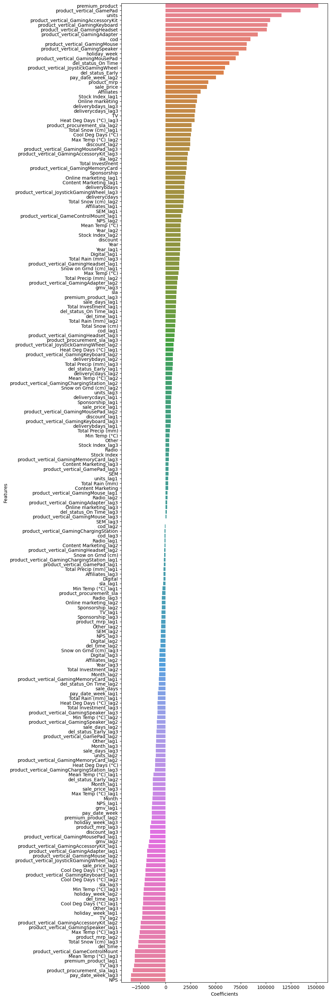

In [ ]:
# Plotting the feature importance

plt.figure(figsize=(10, 30), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

In [ ]:
#HomeAudio

In [ ]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_homeaudio_model4_train[X_homeaudio_model4_train.columns]=scaler.fit_transform(X_homeaudio_model4_train[X_homeaudio_model4_train.columns])
# Transform on test data
X_homeaudio_model4_test[X_homeaudio_model4_test.columns]=scaler.transform(X_homeaudio_model4_test[X_homeaudio_model4_test.columns])

In [ ]:
X_homeaudio_model4_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,gmv_lag1,gmv_lag2,gmv_lag3,units,units_lag1,units_lag2,units_lag3,sale_price,sale_price_lag1,sale_price_lag2,sale_price_lag3,discount,discount_lag1,discount_lag2,discount_lag3,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,premium_product,premium_product_lag1,premium_product_lag2,premium_product_lag3,del_time,del_time_lag1,del_time_lag2,del_time_lag3,cod,cod_lag1,cod_lag2,cod_lag3,product_vertical_AudioMP3Player,product_vertical_AudioMP3Player_lag1,product_vertical_AudioMP3Player_lag2,product_vertical_AudioMP3Player_lag3,product_vertical_BoomBox,product_vertical_BoomBox_lag1,product_vertical_BoomBox_lag2,product_vertical_BoomBox_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_vertical_HomeTheatre,product_vertical_HomeTheatre_lag1,product_vertical_HomeTheatre_lag2,product_vertical_HomeTheatre_lag3,product_vertical_KaraokePlayer,product_vertical_KaraokePlayer_lag1,product_vertical_KaraokePlayer_lag2,product_vertical_KaraokePlayer_lag3,product_vertical_SlingBox,product_vertical_SlingBox_lag1,product_vertical_SlingBox_lag2,product_vertical_SlingBox_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,del_status_Early,del_status_Early_lag1,del_status_Early_lag2,del_status_Early_lag3,del_status_On Time,del_status_On Time_lag1,del_status_On Time_lag2,del_status_On Time_lag3,pay_date_week,pay_date_week_lag1,pay_date_week_lag2,pay_date_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Year,Year_lag1,Year_lag2,Year_lag3,Month,Month_lag1,Month_lag2,Month_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,TV,TV_lag1,TV_lag2,TV_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Online marketing,Online marketing_lag1,Online marketing_lag2,Online marketing_lag3,Affiliates,Affiliates_lag1,Affiliates_lag2,Affiliates_lag3,SEM,SEM_lag1,SEM_lag2,SEM_lag3,Radio,Radio_lag1,Radio_lag2,Radio_lag3,Other,Other_lag1,Other_lag2,Other_lag3,NPS,NPS_lag1,NPS_lag2,NPS_lag3,Stock Index,Stock Index_lag1,Stock Index_lag2,Stock Index_lag3,Max Temp (°C),Max Temp (°C)_lag1,Max Temp (°C)_lag2,Max Temp (°C)_lag3,Min Temp (°C),Min Temp (°C)_lag1,Min Temp (°C)_lag2,Min Temp (°C)_lag3,Mean Temp (°C),Mean Temp (°C)_lag1,Mean Temp (°C)_lag2,Mean Temp (°C)_lag3,Heat Deg Days (°C),Heat Deg Days (°C)_lag1,Heat Deg Days (°C)_lag2,Heat Deg Days (°C)_lag3,Cool Deg Days (°C),Cool Deg Days (°C)_lag1,Cool Deg Days (°C)_lag2,Cool Deg Days (°C)_lag3,Total Rain (mm),Total Rain (mm)_lag1,Total Rain (mm)_lag2,Total Rain (mm)_lag3,Total Snow (cm),Total Snow (cm)_lag1,Total Snow (cm)_lag2,Total Snow (cm)_lag3,Total Precip (mm),Total Precip (mm)_lag1,Total Precip (mm)_lag2,Total Precip (mm)_lag3,Snow on Grnd (cm),Snow on Grnd (cm)_lag1,Snow on Grnd (cm)_lag2,Snow on Grnd (cm)

In [ ]:
#Building Linear Regression model for homeaudio

In [ ]:
homeaudio_model4 = LinearRegression().fit(X_homeaudio_model4_train, y_homeaudio_model4_train)
y_homeaudio_model4_test_pred = homeaudio_model4.predict(X_homeaudio_model4_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_model4_test, y_homeaudio_model4_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model4_test, y_homeaudio_model4_test_pred)))

R2 Score: -29.583318109235822
Mean Squared Error: 485186611027012.75


In [ ]:
# Min and Max of GMV
Ymax = home_audio_df.gmv.max()
Ymin = home_audio_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  19173248.0
Minimumn Y :  2599.0


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model4_test, y_homeaudio_model4_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

1.148993543369403

In [ ]:
#Building Linear Regression model for homeaudio using K-fold Cross Validation

homeaudio_model4_cvdf = homeaudio_model4_df.copy()

y_homeaudio_model4_cvdf = homeaudio_model4_cvdf.pop('gmv')
X_homeaudio_model4_cvdf = homeaudio_model4_cvdf

In [ ]:
homeaudio_model4_cv = LinearRegression().fit(X_homeaudio_model4_cvdf, y_homeaudio_model4_cvdf)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model4_cv, X_homeaudio_model4_cvdf, y_homeaudio_model4_cvdf, cv=5)
accuracy = metrics.r2_score(y_homeaudio_model4_cvdf, homeaudio_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model4_cvdf, homeaudio_predictions_cv)))

Cross-Predicted Accuracy: 0.9330376548845728
Mean Squared Error: 440770591255.59576


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model4_cvdf, homeaudio_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
NRMSE

0.03463135541151067

In [ ]:
#Determining Feature Importance for homeaudio with model with cv

# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
homeaudio_lr_model_parameters = list(homeaudio_model4_cv.coef_)
homeaudio_lr_model_parameters.insert(0, homeaudio_model4_cv.intercept_)
homeaudio_lr_model_parameters = [round(x, 3) for x in homeaudio_lr_model_parameters]
cols = X_homeaudio_model4_test.columns
cols = cols.insert(0, "constant")
homeaudio_lr_coef = list(zip(cols, homeaudio_lr_model_parameters))

In [ ]:
# Creating dataframe of parameter and coefficient

homeaudio_lr_coef_df = pd.DataFrame(homeaudio_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_lr_coef_df = homeaudio_lr_coef_df.rename(columns=col_rename)
homeaudio_lr_coef_df = homeaudio_lr_coef_df.iloc[1:,:]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Coefficients']!=0.0]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
#homeaudio_lr_coef_df

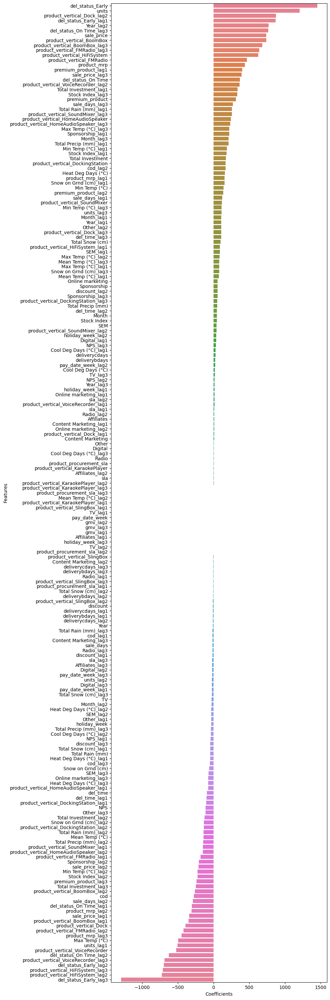

In [ ]:
# Plotting the feature importance

plt.figure(figsize=(10, 30), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

### Model 5: Distributive Lag Model (Multiplicative)

In [ ]:
# Copying the datasets for preparing model data

cameraaccessory_model5_df = camera_accessory_df.drop(columns="week")
gamingaccessory_model5_df = gaming_accessory_df.drop(columns="week")
homeaudio_model5_df = home_audio_df.drop(columns="week")

In [ ]:
print('Any null values in camera accessory: {}'.format(cameraaccessory_model5_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model5_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model5_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


In [ ]:
#Creating new lag(Lag of 3 weeks) variables for the dependent variable (GMV) as well as independent variables

cameraaccessory_model5_df_columns = cameraaccessory_model5_df.columns
gamingaccessory_model5_df_columns = gamingaccessory_model5_df.columns
homeaudio_model5_df_columns = homeaudio_model5_df.columns

In [ ]:
# Caling the user defined function lag_variables

cameraaccessory_model5_df = lag_variables(cameraaccessory_model5_df,cameraaccessory_model5_df_columns,3)
gamingaccessory_model5_df = lag_variables(gamingaccessory_model5_df,gamingaccessory_model5_df_columns,3)
homeaudio_model5_df = lag_variables(homeaudio_model5_df,homeaudio_model5_df_columns,3)

In [ ]:
#Creating new lag(Lag of 2 weeks) variables for the dependent variable (GMV) as well as independent variables

# Caling the user defined function lag_variables

cameraaccessory_model5_df = lag_variables(cameraaccessory_model5_df,cameraaccessory_model5_df_columns,2)
gamingaccessory_model5_df = lag_variables(gamingaccessory_model5_df,gamingaccessory_model5_df_columns,2)
homeaudio_model5_df = lag_variables(homeaudio_model5_df,homeaudio_model5_df_columns,2)

In [ ]:
#Creating new lag(Lag of 1 week) variables for the dependent variable (GMV) as well as independent variables

cameraaccessory_model5_df = lag_variables(cameraaccessory_model5_df,cameraaccessory_model5_df_columns,1)
gamingaccessory_model5_df = lag_variables(gamingaccessory_model5_df,gamingaccessory_model5_df_columns,1)
homeaudio_model5_df = lag_variables(homeaudio_model5_df,homeaudio_model5_df_columns,1)

In [ ]:
# Imputing the null values with 0

cameraaccessory_model5_df.fillna(value=0, inplace=True)
gamingaccessory_model5_df.fillna(value=0, inplace=True)
homeaudio_model5_df.fillna(value=0, inplace=True)

In [ ]:
print('Any null values in camera accessory: {}'.format(cameraaccessory_model5_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model5_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model5_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


In [ ]:
#Taking Logarithm of both the Dependent and the independent variables

cameraaccessory_model5_df = cameraaccessory_model5_df.applymap(lambda x: np.log(x))
cameraaccessory_model5_df = cameraaccessory_model5_df.replace([np.inf, -np.inf], 0)
cameraaccessory_model5_df = cameraaccessory_model5_df.replace(np.nan, 0)

gamingaccessory_model5_df = gamingaccessory_model5_df.applymap(lambda x: np.log(x))
gamingaccessory_model5_df = gamingaccessory_model5_df.replace([np.inf, -np.inf], 0)
gamingaccessory_model5_df = gamingaccessory_model5_df.replace(np.nan, 0)

homeaudio_model5_df = homeaudio_model5_df.applymap(lambda x: np.log(x))
homeaudio_model5_df = homeaudio_model5_df.replace([np.inf, -np.inf], 0)
homeaudio_model5_df = homeaudio_model5_df.replace(np.nan, 0)

In [ ]:
print('Any null values in camera accessory: {}'.format(cameraaccessory_model5_df.isnull().values.any()))
print('Any null values in gaming accessory: {}'.format(gamingaccessory_model5_df.isnull().values.any()))
print('Any null values in home audio: {}'.format(homeaudio_model5_df.isnull().values.any()))

Any null values in camera accessory: False
Any null values in gaming accessory: False
Any null values in home audio: False


In [ ]:
# Train test split

cameraaccessory_model5_train, cameraaccessory_model5_test = train_test_split(cameraaccessory_model5_df, train_size = 0.7, test_size = 0.3, random_state = 100)
gamingaccessory_model5_train, gamingaccessory_model5_test = train_test_split(gamingaccessory_model5_df, train_size = 0.7, test_size = 0.3, random_state = 100)
homeaudio_model5_train, homeaudio_model5_test = train_test_split(homeaudio_model5_df, train_size = 0.7, test_size = 0.3, random_state = 100)

In [ ]:
# Separating X and y train sets(Dependent and target variables)

y_cameraaccessory_model5_train = cameraaccessory_model5_train.pop('gmv')
X_cameraaccessory_model5_train = cameraaccessory_model5_train

y_gamingaccessory_model5_train = gamingaccessory_model5_train.pop('gmv')
X_gamingaccessory_model5_train = gamingaccessory_model5_train

y_homeaudio_model5_train = homeaudio_model5_train.pop('gmv')
X_homeaudio_model5_train = homeaudio_model5_train

In [ ]:
# Separating X and y test sets(Dependent and target variables)

y_cameraaccessory_model5_test = cameraaccessory_model5_test.pop('gmv')
X_cameraaccessory_model5_test = cameraaccessory_model5_test

y_gamingaccessory_model5_test = gamingaccessory_model5_test.pop('gmv')
X_gamingaccessory_model5_test = gamingaccessory_model5_test

y_homeaudio_model5_test = homeaudio_model5_test.pop('gmv')
X_homeaudio_model5_test = homeaudio_model5_test

In [ ]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_cameraaccessory_model5_train[X_cameraaccessory_model5_train.columns]=scaler.fit_transform(X_cameraaccessory_model5_train[X_cameraaccessory_model5_train.columns])
# Transform on test data
X_cameraaccessory_model5_test[X_cameraaccessory_model5_test.columns]=scaler.transform(X_cameraaccessory_model5_test[X_cameraaccessory_model5_test.columns])

In [ ]:
X_cameraaccessory_model5_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,gmv_lag1,gmv_lag2,gmv_lag3,units,units_lag1,units_lag2,units_lag3,sale_price,sale_price_lag1,sale_price_lag2,sale_price_lag3,discount,discount_lag1,discount_lag2,discount_lag3,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,premium_product,premium_product_lag1,premium_product_lag2,premium_product_lag3,del_time,del_time_lag1,del_time_lag2,del_time_lag3,cod,cod_lag1,cod_lag2,cod_lag3,product_vertical_CameraAccessory,product_vertical_CameraAccessory_lag1,product_vertical_CameraAccessory_lag2,product_vertical_CameraAccessory_lag3,product_vertical_CameraBag,product_vertical_CameraBag_lag1,product_vertical_CameraBag_lag2,product_vertical_CameraBag_lag3,product_vertical_CameraBattery,product_vertical_CameraBattery_lag1,product_vertical_CameraBattery_lag2,product_vertical_CameraBattery_lag3,product_vertical_CameraBatteryCharger,product_vertical_CameraBatteryCharger_lag1,product_vertical_CameraBatteryCharger_lag2,product_vertical_CameraBatteryCharger_lag3,product_vertical_CameraBatteryGrip,product_vertical_CameraBatteryGrip_lag1,product_vertical_CameraBatteryGrip_lag2,product_vertical_CameraBatteryGrip_lag3,product_vertical_CameraEyeCup,product_vertical_CameraEyeCup_lag1,product_vertical_CameraEyeCup_lag2,product_vertical_CameraEyeCup_lag3,product_vertical_CameraFilmRolls,product_vertical_CameraFilmRolls_lag1,product_vertical_CameraFilmRolls_lag2,product_vertical_CameraFilmRolls_lag3,product_vertical_CameraHousing,product_vertical_CameraHousing_lag1,product_vertical_CameraHousing_lag2,product_vertical_CameraHousing_lag3,product_vertical_CameraMicrophone,product_vertical_CameraMicrophone_lag1,product_vertical_CameraMicrophone_lag2,product_vertical_CameraMicrophone_lag3,product_vertical_CameraMount,product_vertical_CameraMount_lag1,product_vertical_CameraMount_lag2,product_vertical_CameraMount_lag3,product_vertical_CameraRemoteControl,product_vertical_CameraRemoteControl_lag1,product_vertical_CameraRemoteControl_lag2,product_vertical_CameraRemoteControl_lag3,product_vertical_CameraStorageMemoryCard,product_vertical_CameraStorageMemoryCard_lag1,product_vertical_CameraStorageMemoryCard_lag2,product_vertical_CameraStorageMemoryCard_lag3,product_vertical_CameraTripod,product_vertical_CameraTripod_lag1,product_vertical_CameraTripod_lag2,product_vertical_CameraTripod_lag3,product_vertical_DSLR,product_vertical_DSLR_lag1,product_vertical_DSLR_lag2,product_vertical_DSLR_lag3,product_vertical_ExtensionTube,product_vertical_ExtensionTube_lag1,product_vertical_ExtensionTube_lag2,product_vertical_ExtensionTube_lag3,product_vertical_Filter,product_vertical_Filter_lag1,product_vertical_Filter_lag2,product_vertical_Filter_lag3,product_vertical_Flash,product_vertical_Flash_lag1,product_vertical_Flash_lag2,product_vertical_Flash_lag3,product_vertical_FlashShoeAdapter,product_vertical_FlashShoeAdapter_lag1,product_vertical_FlashShoeAdapter_lag2,product_vertical_FlashShoeAdapter_lag3,product_vertical_Instant Cameras,product_vertical_Instant Cameras_lag1,product_vertical_Instant Cameras_lag2,product_vertical_Instant Cameras_lag3,product_vertical_Lens,product_vertical_Lens_lag1,product_vertical_Lens_lag2,product_vertical_Lens_lag3,product_vertical_ReflectorUmbrella,product_vertical_ReflectorUmbrella_lag1,product_vertical_ReflectorUmbrella_lag2,product_vertical_ReflectorUmbrella_lag3,product_vertical_Softbox,product_vertical_Softbox_lag1,product_vertical_Softbox_lag2,product_vertical_Softbox_lag3,product_vertical_Strap,product_vertical_Strap_lag1,product_vertical_Strap_lag2,product_vertical_Strap_lag3,product_vertical_Teleconverter,product_vertical_Teleconverter_lag1,product_vertical_Teleconverter_lag2,product_vertical_Teleconverter_lag3,product_vertical_Telescope,

In [ ]:
#LR Model for cameraaccessory

cameraaccessory_model5 = LinearRegression().fit(X_cameraaccessory_model5_train, y_cameraaccessory_model5_train)
y_cameraaccessory_model5_test_pred = cameraaccessory_model5.predict(X_cameraaccessory_model5_test)

print('R2 Score: {}'.format(r2_score(y_cameraaccessory_model5_test, y_cameraaccessory_model5_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model5_test, y_cameraaccessory_model5_test_pred)))

R2 Score: -12.190456367958085
Mean Squared Error: 124.2508633221544


In [ ]:
# Min and Max of GMV
Ymax = camera_accessory_df.gmv.max()
Ymin = camera_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  12709353.76009569
Minimumn Y :  299.0


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model5_test, y_cameraaccessory_model5_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000088


In [ ]:
#Building Linear Regression model for cameraaccessory using K-fold Cross Validation

cameraaccessory_model5_cvdf = cameraaccessory_model5_df.copy()

y_cameraaccessory_model5_cvdf = cameraaccessory_model5_cvdf.pop('gmv')
X_cameraaccessory_model5_cvdf = cameraaccessory_model5_cvdf

In [ ]:
cameraaccessory_model5_cv = LinearRegression().fit(X_cameraaccessory_model5_cvdf, y_cameraaccessory_model5_cvdf)
cameraaccessory_predictions_cv = cross_val_predict(cameraaccessory_model5_cv, X_cameraaccessory_model5_cvdf, y_cameraaccessory_model5_cvdf, cv=10)
accuracy = metrics.r2_score(y_cameraaccessory_model5_cvdf, cameraaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_cameraaccessory_model5_cvdf, cameraaccessory_predictions_cv)))

Cross-Predicted Accuracy: 0.9422392428022054
Mean Squared Error: 0.2659550558981183


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_cameraaccessory_model5_cvdf, cameraaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000004


In [ ]:
#Determining Feature Importance for cameraaccessory from model with cv

# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
cameraaccessory_lr_model_parameters = list(cameraaccessory_model5_cv.coef_)
cameraaccessory_lr_model_parameters.insert(0, cameraaccessory_model5_cv.intercept_)
cameraaccessory_lr_model_parameters = [round(x, 3) for x in cameraaccessory_lr_model_parameters]
cols = X_cameraaccessory_model5_test.columns
cols = cols.insert(0, "constant")
cameraaccessory_lr_coef = list(zip(cols, cameraaccessory_lr_model_parameters))

In [ ]:
# Creating a dataframe of the parameters and coefficients

cameraaccessory_lr_coef_df = pd.DataFrame(cameraaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.rename(columns=col_rename)
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.iloc[1:,:]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.loc[cameraaccessory_lr_coef_df['Coefficients']!=0.0]
cameraaccessory_lr_coef_df = cameraaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
cameraaccessory_lr_coef_df

,Features,Coefficients
4,units,0.150
56,product_vertical_CameraBattery,0.119
124,product_vertical_Lens,0.118
148,del_status_Early,0.118
36,premium_product,0.107
52,product_vertical_CameraBag,0.101
60,product_vertical_CameraBatteryCharger,0.095
96,product_vertical_CameraTripod,0.083
108,product_vertical_Filter,0.078
44,cod,0.071


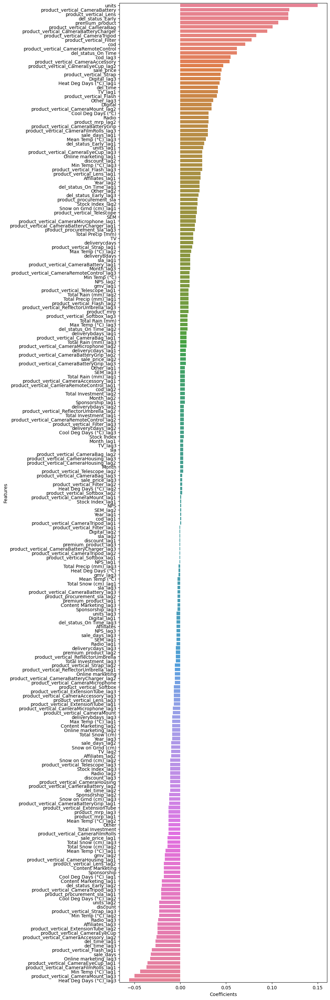

In [ ]:
# Plotting the feature importance

plt.figure(figsize=(10, 30), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=cameraaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

In [ ]:
#gamingaccessory

In [ ]:
# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_gamingaccessory_model5_train[X_gamingaccessory_model5_train.columns]=scaler.fit_transform(X_gamingaccessory_model5_train[X_gamingaccessory_model5_train.columns])
# Transform on test data
X_gamingaccessory_model5_test[X_gamingaccessory_model5_test.columns]=scaler.transform(X_gamingaccessory_model5_test[X_gamingaccessory_model5_test.columns])

In [ ]:
X_gamingaccessory_model5_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,gmv_lag1,gmv_lag2,gmv_lag3,units,units_lag1,units_lag2,units_lag3,sale_price,sale_price_lag1,sale_price_lag2,sale_price_lag3,discount,discount_lag1,discount_lag2,discount_lag3,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,premium_product,premium_product_lag1,premium_product_lag2,premium_product_lag3,del_time,del_time_lag1,del_time_lag2,del_time_lag3,cod,cod_lag1,cod_lag2,cod_lag3,product_vertical_GameControlMount,product_vertical_GameControlMount_lag1,product_vertical_GameControlMount_lag2,product_vertical_GameControlMount_lag3,product_vertical_GamePad,product_vertical_GamePad_lag1,product_vertical_GamePad_lag2,product_vertical_GamePad_lag3,product_vertical_GameValueCards,product_vertical_GameValueCards_lag1,product_vertical_GameValueCards_lag2,product_vertical_GameValueCards_lag3,product_vertical_GamingAccessoryKit,product_vertical_GamingAccessoryKit_lag1,product_vertical_GamingAccessoryKit_lag2,product_vertical_GamingAccessoryKit_lag3,product_vertical_GamingAdapter,product_vertical_GamingAdapter_lag1,product_vertical_GamingAdapter_lag2,product_vertical_GamingAdapter_lag3,product_vertical_GamingChargingStation,product_vertical_GamingChargingStation_lag1,product_vertical_GamingChargingStation_lag2,product_vertical_GamingChargingStation_lag3,product_vertical_GamingConsole,product_vertical_GamingConsole_lag1,product_vertical_GamingConsole_lag2,product_vertical_GamingConsole_lag3,product_vertical_GamingHeadset,product_vertical_GamingHeadset_lag1,product_vertical_GamingHeadset_lag2,product_vertical_GamingHeadset_lag3,product_vertical_GamingKeyboard,product_vertical_GamingKeyboard_lag1,product_vertical_GamingKeyboard_lag2,product_vertical_GamingKeyboard_lag3,product_vertical_GamingMemoryCard,product_vertical_GamingMemoryCard_lag1,product_vertical_GamingMemoryCard_lag2,product_vertical_GamingMemoryCard_lag3,product_vertical_GamingMouse,product_vertical_GamingMouse_lag1,product_vertical_GamingMouse_lag2,product_vertical_GamingMouse_lag3,product_vertical_GamingMousePad,product_vertical_GamingMousePad_lag1,product_vertical_GamingMousePad_lag2,product_vertical_GamingMousePad_lag3,product_vertical_GamingSpeaker,product_vertical_GamingSpeaker_lag1,product_vertical_GamingSpeaker_lag2,product_vertical_GamingSpeaker_lag3,product_vertical_HandheldGamingConsole,product_vertical_HandheldGamingConsole_lag1,product_vertical_HandheldGamingConsole_lag2,product_vertical_HandheldGamingConsole_lag3,product_vertical_JoystickGamingWheel,product_vertical_JoystickGamingWheel_lag1,product_vertical_JoystickGamingWheel_lag2,product_vertical_JoystickGamingWheel_lag3,product_vertical_PhysicalGame,product_vertical_PhysicalGame_lag1,product_vertical_PhysicalGame_lag2,product_vertical_PhysicalGame_lag3,del_status_Early,del_status_Early_lag1,del_status_Early_lag2,del_status_Early_lag3,del_status_On Time,del_status_On Time_lag1,del_status_On Time_lag2,del_status_On Time_lag3,pay_date_week,pay_date_week_lag1,pay_date_week_lag2,pay_date_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Year,Year_lag1,Year_lag2,Year_lag3,Month,Month_lag1,Month_lag2,Month_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,TV,TV_lag1,TV_lag2,TV_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Online marketing,Online marketing_lag1,Online marketing_lag2,Online marketing_lag3,Affiliates,Affiliates_lag1,Affiliates_lag2,Affiliates_lag3,SEM,SEM_lag1,SEM_lag2,SEM_lag3,Radio,Radio_lag1,Radio_lag2,Radio_lag3,Other,Other_lag1,Other_lag2,Other_lag3,NPS,NPS_lag1,NPS_lag2,NPS_lag3,Stock In

In [ ]:
gamingaccessory_model5 = LinearRegression().fit(X_gamingaccessory_model5_train , y_gamingaccessory_model5_train)
y_gamingaccessory_model5_test_pred = gamingaccessory_model5.predict(X_gamingaccessory_model5_test)

print('R2 Score: {}'.format(r2_score(y_gamingaccessory_model5_test, y_gamingaccessory_model5_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model5_test, y_gamingaccessory_model5_test_pred)))

R2 Score: -932.0427982360495
Mean Squared Error: 5882.202936633161


In [ ]:
# Min and Max of GMV
Ymax = gaming_accessory_df.gmv.max()
Ymin = gaming_accessory_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  7209730.620678344
Minimumn Y :  598.0


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model5_test, y_gamingaccessory_model5_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00001064


In [ ]:
#Building Linear Regression model for gamingaccessory using K-fold Cross Validation

gamingaccessory_model5_cvdf = gamingaccessory_model5_df.copy()

y_gamingaccessory_model5_cvdf = gamingaccessory_model5_cvdf.pop('gmv')
X_gamingaccessory_model5_cvdf = gamingaccessory_model5_cvdf

In [ ]:
gamingaccessory_model5_cv = LinearRegression().fit(X_gamingaccessory_model5_cvdf, y_gamingaccessory_model5_cvdf)
gamingaccessory_predictions_cv = cross_val_predict(gamingaccessory_model5_cv, X_gamingaccessory_model5_cvdf, y_gamingaccessory_model5_cvdf, cv=10)
accuracy = metrics.r2_score(y_gamingaccessory_model5_cvdf, gamingaccessory_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_gamingaccessory_model5_cvdf, gamingaccessory_predictions_cv)))

Cross-Predicted Accuracy: 0.9048968993668762
Mean Squared Error: 0.38056083155667997


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_gamingaccessory_model5_cvdf, gamingaccessory_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000009


In [ ]:
#Determining Feature Importance for gamingaccessory from model with cv

#Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
gamingaccessory_lr_model_parameters = list(gamingaccessory_model5_cv.coef_)
gamingaccessory_lr_model_parameters.insert(0, gamingaccessory_model5_cv.intercept_)
gamingaccessory_lr_model_parameters = [round(x, 3) for x in gamingaccessory_lr_model_parameters]
cols = X_gamingaccessory_model5_test.columns
cols = cols.insert(0, "constant")
gamingaccessory_lr_coef = list(zip(cols, gamingaccessory_lr_model_parameters))

In [ ]:
# Creating a dataframe of the parameters and coefficients

gamingaccessory_lr_coef_df = pd.DataFrame(gamingaccessory_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.rename(columns=col_rename)
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.iloc[1:,:]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.loc[gamingaccessory_lr_coef_df['Coefficients']!=0.0]
gamingaccessory_lr_coef_df = gamingaccessory_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
#gamingaccessory_lr_coef_df

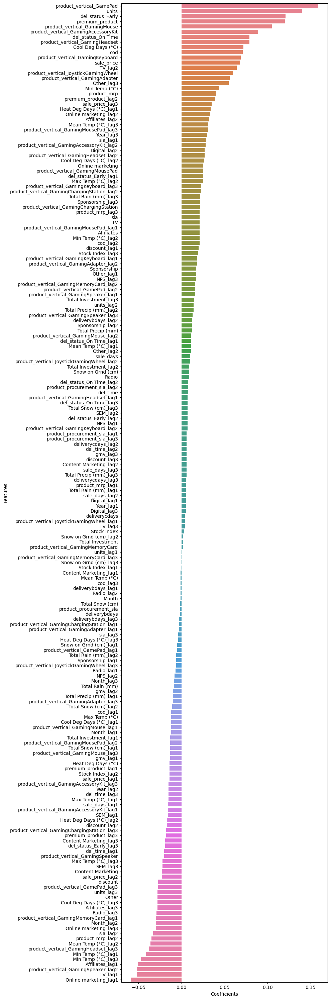

In [ ]:
# Plotting the feature importance

plt.figure(figsize=(10, 30), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=gamingaccessory_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

In [ ]:
#Homeaudio

# Create an object
scaler = StandardScaler()

# Fitting on the train data
X_homeaudio_model5_train[X_homeaudio_model5_train.columns]=scaler.fit_transform(X_homeaudio_model5_train[X_homeaudio_model5_train.columns])
# Transform on test data
X_homeaudio_model5_test[X_homeaudio_model5_test.columns]=scaler.transform(X_homeaudio_model5_test[X_homeaudio_model5_test.columns])

In [ ]:
X_homeaudio_model5_train.describe().apply(lambda s: s.apply('{0:.5f}'.format))

,gmv_lag1,gmv_lag2,gmv_lag3,units,units_lag1,units_lag2,units_lag3,sale_price,sale_price_lag1,sale_price_lag2,sale_price_lag3,discount,discount_lag1,discount_lag2,discount_lag3,product_mrp,product_mrp_lag1,product_mrp_lag2,product_mrp_lag3,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverybdays_lag3,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,deliverycdays_lag3,sla,sla_lag1,sla_lag2,sla_lag3,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,product_procurement_sla_lag3,premium_product,premium_product_lag1,premium_product_lag2,premium_product_lag3,del_time,del_time_lag1,del_time_lag2,del_time_lag3,cod,cod_lag1,cod_lag2,cod_lag3,product_vertical_AudioMP3Player,product_vertical_AudioMP3Player_lag1,product_vertical_AudioMP3Player_lag2,product_vertical_AudioMP3Player_lag3,product_vertical_BoomBox,product_vertical_BoomBox_lag1,product_vertical_BoomBox_lag2,product_vertical_BoomBox_lag3,product_vertical_Dock,product_vertical_Dock_lag1,product_vertical_Dock_lag2,product_vertical_Dock_lag3,product_vertical_DockingStation,product_vertical_DockingStation_lag1,product_vertical_DockingStation_lag2,product_vertical_DockingStation_lag3,product_vertical_FMRadio,product_vertical_FMRadio_lag1,product_vertical_FMRadio_lag2,product_vertical_FMRadio_lag3,product_vertical_HiFiSystem,product_vertical_HiFiSystem_lag1,product_vertical_HiFiSystem_lag2,product_vertical_HiFiSystem_lag3,product_vertical_HomeAudioSpeaker,product_vertical_HomeAudioSpeaker_lag1,product_vertical_HomeAudioSpeaker_lag2,product_vertical_HomeAudioSpeaker_lag3,product_vertical_HomeTheatre,product_vertical_HomeTheatre_lag1,product_vertical_HomeTheatre_lag2,product_vertical_HomeTheatre_lag3,product_vertical_KaraokePlayer,product_vertical_KaraokePlayer_lag1,product_vertical_KaraokePlayer_lag2,product_vertical_KaraokePlayer_lag3,product_vertical_SlingBox,product_vertical_SlingBox_lag1,product_vertical_SlingBox_lag2,product_vertical_SlingBox_lag3,product_vertical_SoundMixer,product_vertical_SoundMixer_lag1,product_vertical_SoundMixer_lag2,product_vertical_SoundMixer_lag3,product_vertical_VoiceRecorder,product_vertical_VoiceRecorder_lag1,product_vertical_VoiceRecorder_lag2,product_vertical_VoiceRecorder_lag3,del_status_Early,del_status_Early_lag1,del_status_Early_lag2,del_status_Early_lag3,del_status_On Time,del_status_On Time_lag1,del_status_On Time_lag2,del_status_On Time_lag3,pay_date_week,pay_date_week_lag1,pay_date_week_lag2,pay_date_week_lag3,holiday_week,holiday_week_lag1,holiday_week_lag2,holiday_week_lag3,Year,Year_lag1,Year_lag2,Year_lag3,Month,Month_lag1,Month_lag2,Month_lag3,Total Investment,Total Investment_lag1,Total Investment_lag2,Total Investment_lag3,TV,TV_lag1,TV_lag2,TV_lag3,Digital,Digital_lag1,Digital_lag2,Digital_lag3,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Sponsorship_lag3,Content Marketing,Content Marketing_lag1,Content Marketing_lag2,Content Marketing_lag3,Online marketing,Online marketing_lag1,Online marketing_lag2,Online marketing_lag3,Affiliates,Affiliates_lag1,Affiliates_lag2,Affiliates_lag3,SEM,SEM_lag1,SEM_lag2,SEM_lag3,Radio,Radio_lag1,Radio_lag2,Radio_lag3,Other,Other_lag1,Other_lag2,Other_lag3,NPS,NPS_lag1,NPS_lag2,NPS_lag3,Stock Index,Stock Index_lag1,Stock Index_lag2,Stock Index_lag3,Max Temp (°C),Max Temp (°C)_lag1,Max Temp (°C)_lag2,Max Temp (°C)_lag3,Min Temp (°C),Min Temp (°C)_lag1,Min Temp (°C)_lag2,Min Temp (°C)_lag3,Mean Temp (°C),Mean Temp (°C)_lag1,Mean Temp (°C)_lag2,Mean Temp (°C)_lag3,Heat Deg Days (°C),Heat Deg Days (°C)_lag1,Heat Deg Days (°C)_lag2,Heat Deg Days (°C)_lag3,Cool Deg Days (°C),Cool Deg Days (°C)_lag1,Cool Deg Days (°C)_lag2,Cool Deg Days (°C)_lag3,Total Rain (mm),Total Rain (mm)_lag1,Total Rain (mm)_lag2,Total Rain (mm)_lag3,Total Snow (cm),Total Snow (cm)_lag1,Total Snow (cm)_lag2,Total Snow (cm)_lag3,Total Precip (mm),Total Precip (mm)_lag1,Total Precip (mm)_lag2,Total Precip (mm)_lag3,Snow on Grnd (cm),Snow on Grnd (cm)_lag1,Snow on Grnd (cm)_lag2,Snow on Grnd (cm)

In [ ]:
homeaudio_model5 = LinearRegression().fit(X_homeaudio_model5_train, y_homeaudio_model5_train)
y_homeaudio_model5_test_pred = homeaudio_model5.predict(X_homeaudio_model5_test)

print('R2 Score: {}'.format(r2_score(y_homeaudio_model5_test, y_homeaudio_model5_test_pred)))
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model5_test, y_homeaudio_model5_test_pred)))

R2 Score: -11296.559730128838
Mean Squared Error: 3217.8234999869387


In [ ]:
# Min and Max of GMV
Ymax = home_audio_df.gmv.max()
Ymin = home_audio_df.gmv.min()
print("Maximumn Y : ", Ymax)
print("Minimumn Y : ", Ymin)

Maximumn Y :  19173248.0
Minimumn Y :  2599.0


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model5_test, y_homeaudio_model5_test_pred) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000296


In [ ]:
#Building Linear Regression model for homeaudio using K-fold Cross Validation

homeaudio_model5_cvdf = homeaudio_model5_df.copy()

y_homeaudio_model5_cvdf = homeaudio_model5_cvdf.pop('gmv')
X_homeaudio_model5_cvdf = homeaudio_model5_cvdf

In [ ]:
homeaudio_model5_cv = LinearRegression().fit(X_homeaudio_model5_cvdf, y_homeaudio_model5_cvdf)
homeaudio_predictions_cv = cross_val_predict(homeaudio_model5_cv, X_homeaudio_model5_cvdf, y_homeaudio_model5_cvdf, cv=5)
accuracy = metrics.r2_score(y_homeaudio_model5_cvdf, homeaudio_predictions_cv)
print("Cross-Predicted Accuracy:", accuracy)
print('Mean Squared Error: {}'.format(mean_squared_error(y_homeaudio_model5_cvdf, homeaudio_predictions_cv)))

Cross-Predicted Accuracy: 0.7288129070731234
Mean Squared Error: 0.3451653338564937


In [ ]:
# Calculating NRMSE
RMSE = mean_squared_error(y_homeaudio_model5_cvdf, homeaudio_predictions_cv) ** 0.5
NRMSE = RMSE / (Ymax - Ymin)
print("{:.8f}".format(NRMSE))

0.00000003


In [ ]:
#Determining Feature Importance for homeaudio with model with cv

# Formatting the output
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x))
pd.set_option('display.precision',1)

# linear regression model parameters
homeaudio_lr_model_parameters = list(homeaudio_model5_cv.coef_)
homeaudio_lr_model_parameters.insert(0, homeaudio_model5_cv.intercept_)
homeaudio_lr_model_parameters = [round(x, 3) for x in homeaudio_lr_model_parameters]
cols = X_homeaudio_model5_test.columns
cols = cols.insert(0, "constant")
homeaudio_lr_coef = list(zip(cols, homeaudio_lr_model_parameters))

In [ ]:
# Creating dataframe of parameters and coefficients

homeaudio_lr_coef_df = pd.DataFrame(homeaudio_lr_coef)
col_rename = {0:'Features',1: 'Coefficients'}
homeaudio_lr_coef_df = homeaudio_lr_coef_df.rename(columns=col_rename)
homeaudio_lr_coef_df = homeaudio_lr_coef_df.iloc[1:,:]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.loc[homeaudio_lr_coef_df['Coefficients']!=0.0]
homeaudio_lr_coef_df = homeaudio_lr_coef_df.sort_values(by=['Coefficients'], ascending = False)
#homeaudio_lr_coef_df

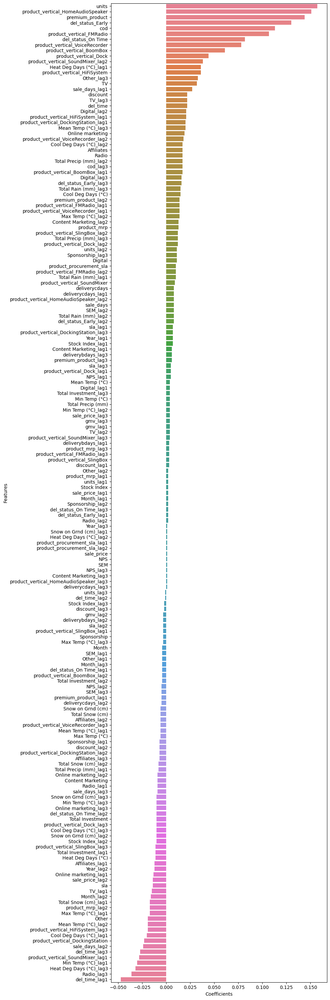

In [ ]:
# Plotting the feature importance

plt.figure(figsize=(10, 30), dpi=100, facecolor='w', edgecolor='k', frameon='True')
sns.barplot(y='Features', x='Coefficients', palette='husl', data=homeaudio_lr_coef_df, estimator=np.sum)
plt.tight_layout()

plt.show()

## Step 4: Model Selection and Evalualtion

#### Lets check the model scores for all the 3 categories

##### For Camera Accessory we will be selecting the multiplicative model as it has the highest accuracy compared to all the other models

In [ ]:
# Top 5 postively correlated KPI

top_pos_camera = cameraaccessory_mul_lr_coef_df.iloc[:5,:]
top_pos_camera

,Features,Coefficients
1,units,0.951
2,sale_price,0.787
6,deliverycdays,0.234
32,product_vertical_ReflectorUmbrella,0.203
4,product_mrp,0.142


In [ ]:
# Top 5 negatively correlated KPI

top_neg_camera = cameraaccessory_mul_lr_coef_df.iloc[-1:-6:-1,:]
top_neg_camera

,Features,Coefficients
3,discount,-0.304
5,deliverybdays,-0.228
7,sla,-0.099
45,Digital,-0.085
24,product_vertical_CameraTripod,-0.058


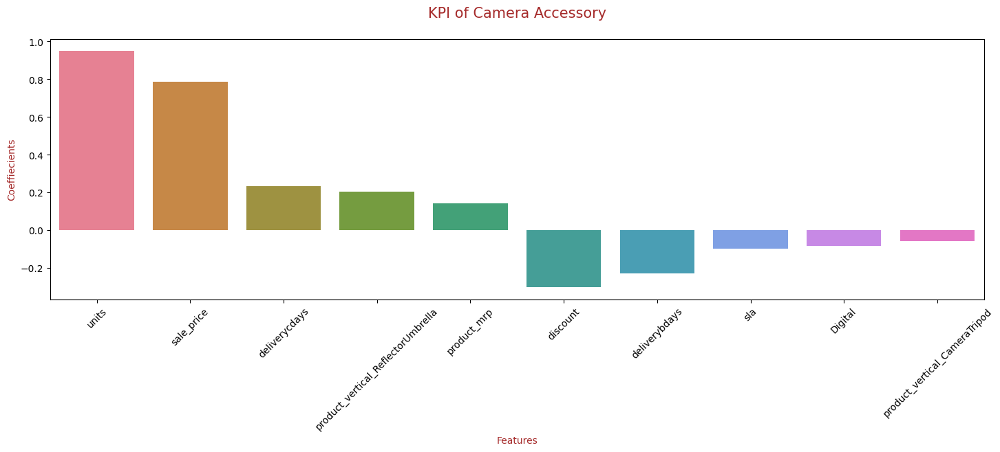

In [ ]:
# Plotting the KPI
cam = pd.concat([top_pos_camera,top_neg_camera], axis=0)
cam.reset_index(drop=True, inplace=True)
plt.figure(figsize=(15, 5))
sns.barplot(x='Features', y='Coefficients', palette='husl', data=cam, estimator=np.sum)
plt.title("KPI of Camera Accessory\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Coeffiecients", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Features", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.tight_layout()
plt.xticks(rotation = 45)
plt.show()

##### For Gaming Accessory we will be selecting the multiplicative model as it has the highest accuracy compared to all the other models


In [ ]:
# Top 5 postively correlated KPI

game_p = gamingaccessory_mul_lr_coef_df.iloc[:5,:]
game_p

,Features,Coefficients
13,product_vertical_GamePad,0.423
1,units,0.327
19,product_vertical_GamingHeadset,0.252
9,premium_product,0.198
16,product_vertical_GamingAdapter,0.151


In [ ]:
# Top 5 negatively correlated KPI

game_n = gamingaccessory_mul_lr_coef_df.iloc[-1:-6:-1,:]
game_n

,Features,Coefficients
38,Content Marketing,-0.086
26,product_vertical_JoystickGamingWheel,-0.081
35,TV,-0.074
8,product_procurement_sla,-0.067
11,cod,-0.062


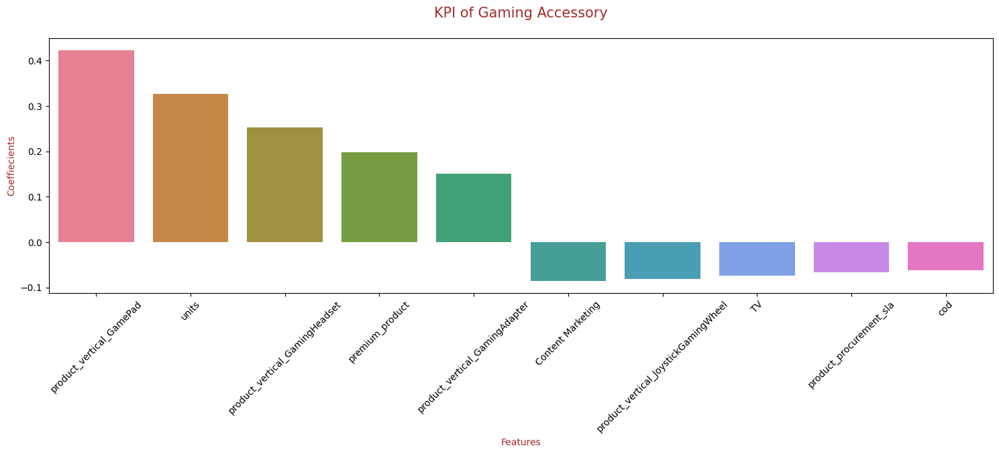

In [ ]:
# Plotting the KPI
game = pd.concat([game_p,game_n], axis=0)
game.reset_index(drop=True, inplace=True)
plt.figure(figsize=(15, 5))
sns.barplot(x='Features', y='Coefficients', palette='husl', data=game, estimator=np.sum)
plt.title("KPI of Gaming Accessory\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Coeffiecients", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Features", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.tight_layout()
plt.xticks(rotation = 45)
plt.show()

##### For Home Audio we will be selecting the multiplicative model as it has the highest accuracy compared to all the other models

In [ ]:
# Top 5 postively correlated KPI

aud_p = homeaudio_mul_lr_coef_df.iloc[:5,:]
aud_p

,Features,Coefficients
1,units,0.305
16,product_vertical_FMRadio,0.276
9,premium_product,0.262
18,product_vertical_HomeAudioSpeaker,0.225
2,sale_price,0.125


In [ ]:
# Top 5 negatively correlated KPI

aud_n =homeaudio_mul_lr_coef_df.iloc[-1:-6:-1,:]
aud_n

,Features,Coefficients
4,product_mrp,-0.095
7,sla,-0.093
48,Total Snow (cm),-0.087
30,Total Investment,-0.072
44,Mean Temp (°C),-0.071


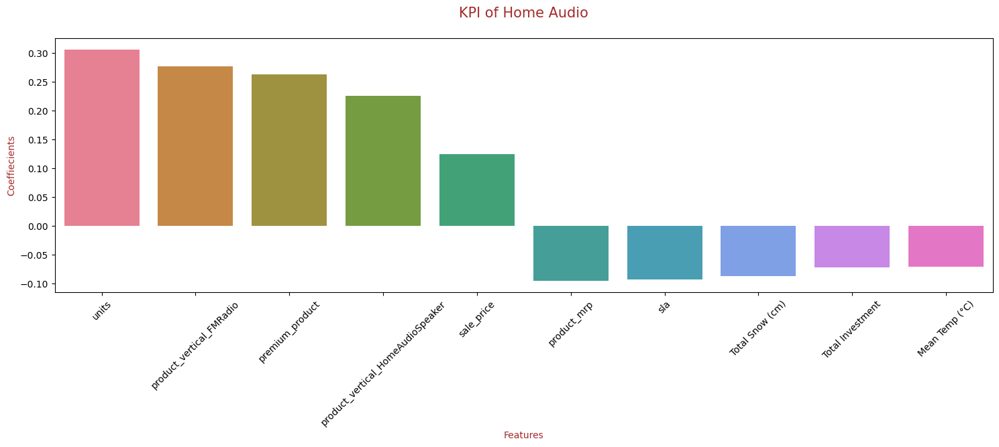

In [ ]:
# Plotting the KPI
aud = pd.concat([aud_p,aud_n], axis=0)
aud.reset_index(drop=True, inplace=True)
plt.figure(figsize=(15, 5))
sns.barplot(x='Features', y='Coefficients', palette='husl', data=aud, estimator=np.sum)
plt.title("KPI of Home Audio\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.ylabel("Coeffiecients", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.xlabel("Features", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.tight_layout()
plt.xticks(rotation = 45)
plt.show()

#### From the above models, it can be observed that there are interactions between KPIs of all the 3 categories

#### The multiplicative models tell us about the growth of revenue vs the interactive growth of the KPIs

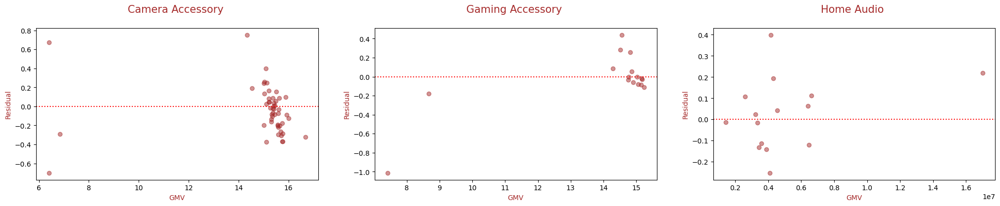

In [ ]:
#Residual Analysis

# Residual v/s predictions plot
plt.figure(figsize=[25,4])

plt.subplot(1,3,1)
y_cam_res = y_cameraaccessory_model2_cvdf - cameraaccessory_predictions_mcv
plt.scatter( cameraaccessory_predictions_mcv, y_cam_res, color="brown", alpha=0.5)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("GMV", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Residual", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.title("Camera Accessory \n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.subplot(1,3,2)
y_game_res = y_gamingaccessory_model2_test - y_gamingaccessory_model2_test_pred
plt.scatter( y_gamingaccessory_model2_test_pred, y_game_res, color="brown", alpha=0.5)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("GMV", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Residual", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.title("Gaming Accessory \n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.subplot(1,3,3)
y_aud_res = y_homeaudio_model2_test - y_homeaudio_model2_test_pred
plt.scatter( y_homeaudio_model1_test_pred, y_aud_res, color="brown", alpha=0.5)
plt.axhline(y=0, color='r', linestyle=':')
plt.xlabel("GMV", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Residual", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.title("Home Audio \n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.show()

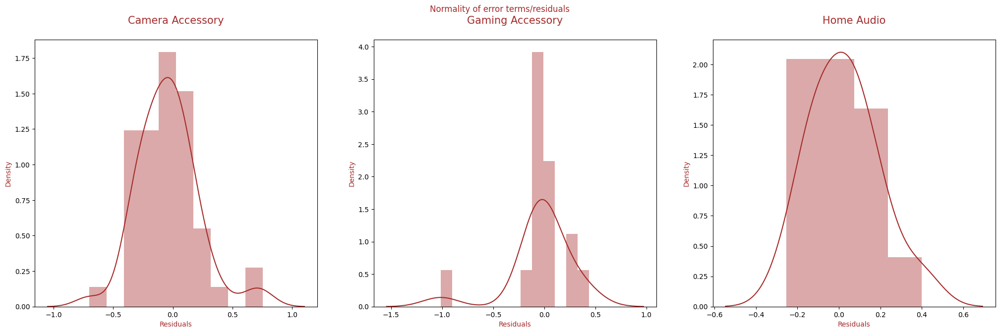

In [ ]:
# Distribution of errors
plt.figure(figsize=[25,7])

plt.subplot(1,3,1)
p = sns.distplot(y_cam_res,kde=True, color="brown")
p = plt.xlabel("Residuals", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
p = plt.ylabel("Density", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
p = plt.title("Camera Accessory\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.subplot(1,3,2)
p = sns.distplot(y_game_res,kde=True, color="brown")
p = plt.xlabel("Residuals", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
p = plt.ylabel("Density", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
p = plt.title("Gaming Accessory\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.subplot(1,3,3)
p = sns.distplot(y_aud_res,kde=True, color="brown")
p = plt.xlabel("Residuals", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
p = plt.ylabel("Density", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
p = plt.title("Home Audio\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})

plt.suptitle("Normality of error terms/residuals\n", fontdict={"fontsize":25, "fontweight":10, "color":"brown"})
plt.show()

##### Linear regression assumptions are satified as it can be clearly seen above that:

##### -Error terms are normally distributed
##### -Error terms are independent of each other
##### -Error terms have constant variance

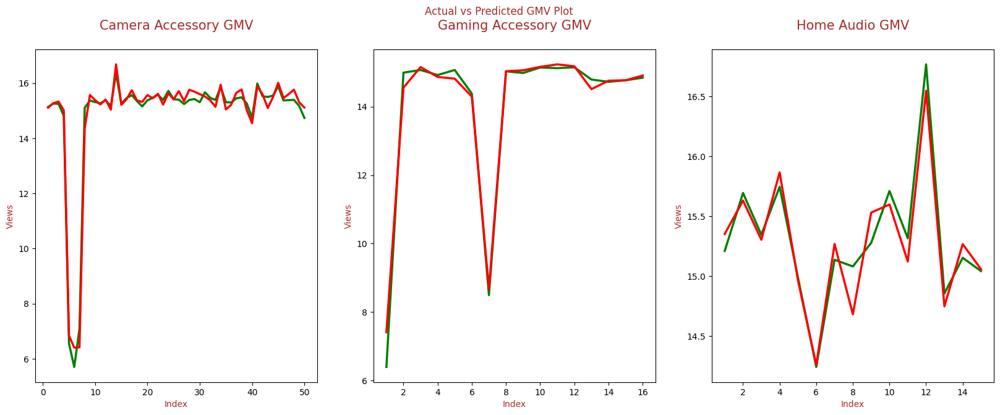

In [ ]:
#Actual vs Predicted Analysis

plt.figure(figsize=(20, 7))

plt.subplot(1, 3, 1)
c = [i for i in range(1,51,1)]
plt.plot(c,y_cameraaccessory_model2_cvdf, color="green", linewidth=2.5, linestyle="solid")
plt.plot(c,cameraaccessory_predictions_mcv, color="red",  linewidth=2.5, linestyle="solid")
plt.title("Camera Accessory GMV\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.xlabel("Index", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Views", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.subplot(1, 3, 2)
c = [i for i in range(1,17,1)]
plt.plot(c,y_gamingaccessory_model2_test, color="green", linewidth=2.5, linestyle="solid")
plt.plot(c,y_gamingaccessory_model2_test_pred, color="red",  linewidth=2.5, linestyle="solid")
plt.title("Gaming Accessory GMV\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.xlabel("Index", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Views", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.subplot(1, 3, 3)
c = [i for i in range(1,16,1)]
plt.plot(c,y_homeaudio_model2_test, color="green", linewidth=2.5, linestyle="solid")
plt.plot(c,y_homeaudio_model2_test_pred, color="red",  linewidth=2.5, linestyle="solid")
plt.title("Home Audio GMV\n", fontdict={"fontsize":15, "fontweight":5, "color":"brown"})
plt.xlabel("Index", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})
plt.ylabel("Views", fontdict={"fontsize":10, "fontweight":5, "color":"brown"})

plt.suptitle("Actual vs Predicted GMV Plot\n\n\n", fontdict={"fontsize":25, "fontweight":10, "color":"brown"})
plt.show()

#### Model Equation

##### For the purpose of this project, we will be selecting the top 10 KPIs for each product sub-category (5 highly positive/negative)

##### The equation for the best fit line for all the three product sub categories is as follows:

Camera Accessory gmv = (0.951 X units) + (0.787 X sale_price) + (0.234 X deliverycdays) + (0.203 X product_vertical_ReflectorUmbrella) +
                       (0.142 X product_mrp) + (-0.304 X discount ) + (-0.228 X deliverybdays) + (-0.099 X sla) +
                        (-0.085 X Digital) + (-0.058 X product_vertical_CameraTripod)

Gaming Accessory gmv = (0.423 X product_vertical_GamePad) + (0.327 X units) + (0.252 X product_vertical_GamingHeadset) +
                        (0.198 X premium_product) + (0.151 X product_vertical_GamingAdapter) + (-0.086 X Content Marketing) +
                         (-0.081 X Tproduct_vertical_JoystickGamingWheel) + (-0.074 X TV) + (-0.067 X product_procurement_sla) + (-0.062 X cod)

Home Audio gmv = (0.305 X units) + (0.276 X product_vertical_FMRadio) + (0.262 X premium_product) + (0.225 X product_vertical_HomeAudioSpeaker) +
                (0.125 X sale_price) + (-0.095X product_mrp) + (-0.093 X sla) + (-0.087 X Total Snow (cm)) + (-0.072 X Total Investment) +
                 (-0.071 X Mean Temp (°C))

#### Recommendation

##### Camera Accessory:

1.Product Vertical Reflector Umbrella with price above 2000 CAD contribute to high revenue. So, company should focus on the
availability and marketing of these products.

2.Customers tend to order products which minimum sla/ delivery days. So, company should focus on efficient warehousing and ensure that the product stock is sufficient in the nearest warehouse of the region where orders are high.

3.Company should revisit the digital marketing strategies

##### Gaming Accessory:

1.Products like Game Pad, Gaming Headset, Gaming Adapter and premium products contribute positively to revenue. So, company should focus on availability and marketing of these products.

2.Customers tend to order products with minimum sla, hence they should focus on logistics and warehousing
3.Company should revisit the content marketing strategies and TV ads as they have negatively impacted the revenue.

#### Home Audio:

1.Products like Radio, Gaming Headset, Speaker and premium products contribute positively to revenue. So, company should focus on availability and marketing of these products

2.During high snow, the demand for home audio products are low, so company can provide discount during this period and gain customers.

3.Customers tend to order products with minimum sla, hence they should focus on logistics and warehousing

4.Company should revisit its investment strategies as it has negatively impacted the revenue.